In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import nibabel as nib
import re
from sklearn.decomposition import PCA
import umap.plot
from scipy.stats import chi2_contingency

from matplotlib.patches import Patch
from sklearn.preprocessing import LabelEncoder
from scipy.cluster.hierarchy import fcluster

from statannotations.Annotator import Annotator
#from cuml.manifold import UMAP

from itertools import combinations
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests

from sklearn.metrics import classification_report
from sklearn import metrics

from lifelines import CoxPHFitter

In [2]:
import sys
print(sys.version)

3.7.12 | packaged by conda-forge | (default, Oct 26 2021, 06:08:21) 
[GCC 9.4.0]


In [3]:
plt.rcParams.update({
    "font.size": 12,              # base font size
    "axes.titlesize": 14,         # title font
    "axes.labelsize": 13,         # x and y labels
    "xtick.labelsize": 11,        # x ticks
    "ytick.labelsize": 11,        # y ticks
    "legend.fontsize": 11,        # legend
})

# merging tables

In [301]:
# table with key ADNI measurements
ADNI_key = pd.read_csv('/csc/epitkane/home/atagmazi/ADDL_pipeline/scripts/ADNIMERGE_04Aug2025.csv',header=[0], index_col=[0], low_memory = False)

ADNI_cdr = pd.read_csv('/csc/epitkane/home/atagmazi/ADDL_pipeline/scripts/ADNI_CDR_26Apr2026.csv',header=[0], index_col=[0], low_memory = False)


In [296]:
ADNI_key

Index(['COLPROT', 'ORIGPROT', 'PTID', 'SITE', 'VISCODE', 'EXAMDATE', 'DX_bl',
       'AGE', 'PTGENDER', 'PTEDUCAT',
       ...
       'PTAU_bl', 'FDG_bl', 'PIB_bl', 'AV45_bl', 'FBB_bl', 'Years_bl',
       'Month_bl', 'Month', 'M', 'update_stamp'],
      dtype='object', length=115)

In [302]:
# table with key A4 measurements
A4_PACC = pd.read_csv('/csc/epitkane/home/atagmazi/ADDL_pipeline/scripts/A4_SPPACC_PRV2_04Aug2025.csv',header=[0], low_memory = False)
A4_mmse = pd.read_csv('/csc/epitkane/home/atagmazi/ADDL_pipeline/scripts/A4_MMSE_PRV2_04Aug2025.csv',header=[0], low_memory = False)
A4_coglogic = pd.read_csv('/csc/epitkane/home/atagmazi/ADDL_pipeline/scripts/A4_COGLOGIC_PRV2_04Aug2025.csv',header=[0], low_memory = False)
A4_cogfcsr16 = pd.read_csv('/csc/epitkane/home/atagmazi/ADDL_pipeline/scripts/A4_COGFCSR16_PRV2_04Aug2025.csv',header=[0], low_memory = False)
A4_cogdigit = pd.read_csv('/csc/epitkane/home/atagmazi/ADDL_pipeline/scripts/A4_COGDIGIT_PRV2_04Aug2025.csv',header=[0], low_memory = False)

A4_suvr = pd.read_csv('/csc/epitkane/home/atagmazi/ADDL_pipeline/scripts/A4_PETSUVR_PRV2_22May2025.csv',header=[0], low_memory = False)

A4_cdr = pd.read_csv('/csc/epitkane/home/atagmazi/ADDL_pipeline/scripts/A4_CDR_PRV2_17Jun2025.csv',header=[0], low_memory = False)


In [323]:
# Our metafile
date = '26_05_25'
#path = '/csc/epitkane/home/atagmazi/ADDL_pipeline/scripts/VAE_model/' + date
path = '/csc/epitkane/home/atagmazi/ADDL_pipeline/scripts/bimodal_VAE/' + date
meta2=  pd.read_csv(path + '/metafile_shuffled_'+ date+'.csv',header=[0], index_col=[0], low_memory = False)

meta2.loc[meta2['Research.Group']=='LMCI','Research.Group'] = 'MCI'
meta2.loc[meta2['Research.Group']=='EMCI','Research.Group'] = 'MCI'
meta2['Subject.ID'] = meta2['MRI_subID'] #something happened with Subject.ID columns, there are 0 in some rows

In [8]:
meta2.columns

Index(['Project', 'Phase', 'Sex', 'Weight', 'Research.Group', 'VISCODE',
       'Study.Date', 'Age', 'Modality', 'Description', 'Imaging.Protocol',
       'Image.Data.ID', 'modality_subtype', 'PATH', 'MRI_subID',
       'MRI_Modality', 'MRI_Research.Group', 'MRI_Age', 'MRI_VISCODE',
       'MRI_studydate', 'MRI_Description', 'MRI_Imaging.protocol', 'MRI_Type',
       'MRI_ID', 'MRI_PATH', 'PET_PATH_normalised', 'MRI_PATH_registered',
       'pet_min', 'pet_max', 'pet_90q', 'pet_95q', 'pet_99q', 'pet_999q',
       'mri_min', 'mri_max', 'mri_90q', 'mri_95q', 'mri_99q', 'mri_999q',
       'Subject.ID'],
      dtype='object')

In [9]:
# checking that we didn't work with scans from email about quality concerns
meta2[meta2["Subject.ID"].str.startswith("381_S_")]

,Project,Phase,Sex,Weight,Research.Group,VISCODE,Study.Date,Age,Modality,Description,...,pet_95q,pet_99q,pet_999q,mri_min,mri_max,mri_90q,mri_95q,mri_99q,mri_999q,Subject.ID


In [324]:
# upload SUVR values from ADNI for comparison
adni_suvr = pd.read_csv('/csc/epitkane/home/atagmazi/ADDL_pipeline/scripts/UCBERKELEY_AMY_6MM_03Sep2024.csv')
suvr_inhouse=  pd.read_csv('/csc/epitkane/home/atagmazi/ADDL_pipeline/scripts/SUVR/suvr_values.csv', index_col=0)
# assign SUVR from ADNI to PET scans in our meta file
#meta2['Subject.ID'] = 0
#for i in range(meta2.shape[0]):
#    if meta2.Project[i] == 'ADNI':
#        meta2['Subject.ID'][i] = re.findall('\d+_S_\d+',meta2['PATH'][i])[0]
        
meta2['frontal_lobe'] = np.nan
meta2['cingulate'] = np.nan
meta2['parietal'] = np.nan
meta2['temporal'] = np.nan

meta2['SUMMARY_SUVR'] = np.nan
meta2['CENTILOIDS'] = np.nan
meta2['AMYLOID_STATUS'] = np.nan
for i in range(meta2.shape[0]):
    if meta2.Project[i] == 'ADNI':
        temp = adni_suvr[(adni_suvr['PTID'].str.contains(pat=meta2['Subject.ID'][i]))&
                         (adni_suvr['VISCODE'].str.contains(pat=meta2['VISCODE'][i]))]
        
        if not temp.empty:
            meta2.at[i, 'SUMMARY_SUVR'] = temp['SUMMARY_SUVR'].values[0]
            meta2.at[i, 'CENTILOIDS'] = temp['CENTILOIDS'].values[0]
            meta2.at[i, 'AMYLOID_STATUS'] = temp['AMYLOID_STATUS'].values[0]

        
    if meta2.Project[i] == 'A4':
        temp = A4_suvr[(A4_suvr['BID'].str.contains(pat=meta2['Subject.ID'][i])) &
                         (A4_suvr['brain_region']=='Composite_Summary')]
        meta2.at[i, 'SUMMARY_SUVR'] = temp['suvr_cer'].values[0]
        meta2.at[i, 'CENTILOIDS'] = temp['centiloid'].values[0]
        
        if meta2['Research.Group'][i] == 'amyloidE':
            meta2['AMYLOID_STATUS'][i] = 1 # Amyloid positive
        else:
            meta2['AMYLOID_STATUS'][i] = 0 # Amyloid negative
    
    meta2['frontal_lobe'][i] = suvr_inhouse[meta2['Image.Data.ID'][i]]['frontal_lobe']
    meta2['cingulate'][i] = suvr_inhouse[meta2['Image.Data.ID'][i]]['cingulate']
    meta2['parietal'][i] = suvr_inhouse[meta2['Image.Data.ID'][i]]['parietal']
    meta2['temporal'][i] = suvr_inhouse[meta2['Image.Data.ID'][i]]['temporal']

/csc/epitkane/home/atagmazi/.conda/envs/atagmazi_gpu8/lib/python3.7/site-packages/ipykernel_launcher.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/csc/epitkane/home/atagmazi/.conda/envs/atagmazi_gpu8/lib/python3.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/csc/epitkane/home/atagmazi/.conda/envs/atagmazi_gpu8/lib/python3.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-vi

In [11]:
meta2.CENTILOIDS

0         9.4714
1        -5.0000
2        58.0000
3        49.7468
4       -10.6663
          ...   
3105    -14.0000
3106         NaN
3107    103.0000
3108      8.0000
3109     93.0000
Name: CENTILOIDS, Length: 3110, dtype: float64

## Populational characteristics

In [12]:
# number of subjects
print(len(meta2[meta2.Project == 'ADNI']["Subject.ID"].unique()))
print(len(meta2[meta2.Project == 'A4']["Subject.ID"].unique()))

978
1328


In [13]:
# number of PET scans
meta2.Project.value_counts()

ADNI    1782
A4      1328
Name: Project, dtype: int64

In [13]:
#Age
print(meta2[meta2.Project == 'ADNI'].Age.mean())
print(meta2[meta2.Project == 'ADNI'].Age.std())

print(meta2[meta2.Project == 'A4'].Age.mean())
print(meta2[meta2.Project == 'A4'].Age.std())

74.86711560044894
7.428135692972346
71.75203313253019
4.788959491865282


In [14]:
#Sex
print(meta2[meta2.Project == 'ADNI'].Sex.value_counts())
print((meta2[meta2.Project == 'ADNI'].Sex.value_counts().F*100)/meta2[meta2.Project == 'ADNI'].shape[0])

print(meta2[meta2.Project == 'A4'].Sex.value_counts())
print((meta2[meta2.Project == 'A4'].Sex.value_counts().F*100)/meta2[meta2.Project == 'A4'].shape[0])


M    966
F    816
Name: Sex, dtype: int64
45.79124579124579
F    790
M    538
Name: Sex, dtype: int64
59.48795180722892


In [15]:
# Diagnoses
meta2['Research.Group'].value_counts()


amyloidE           1008
MCI                 967
CN                  495
LEARN amyloidNE     320
SMC                 163
AD                  157
Name: Research.Group, dtype: int64

In [16]:
meta2

,Project,Phase,Sex,Weight,Research.Group,VISCODE,Study.Date,Age,Modality,Description,...,mri_99q,mri_999q,Subject.ID,frontal_lobe,cingulate,parietal,temporal,SUMMARY_SUVR,CENTILOIDS,AMYLOID_STATUS
0,A4,NaN,M,83.9,LEARN amyloidNE,SCV2,1/01/2016,84.4,PET,Florbetapir <- MNI_3DBRAIN_C),...,561.022889,715.850910,B59563700,1.145302,1.283475,1.148258,1.029698,1.020,9.4714,0.0
1,ADNI,ADNI 2,M,84.9,MCI,v21,9/30/2013,69.7,PET,"AV45 Co-registered, Averaged <- PET Brain AV_4...",...,548.642743,712.191625,023_S_4115,1.153928,1.273741,1.247301,1.089690,0.979,-5.0000,0.0
2,ADNI,ADNI 2,M,75.7,CN,v21,1/22/2014,79.2,PET,"AV45 Co-registered, Averaged <- ADNI Brain PET...",...,514.238646,689.266167,032_S_4429,1.834832,1.947646,1.842250,1.283489,1.315,58.0000,1.0
3,A4,NaN,M,71.4,amyloidE,SCV2,1/01/2016,82.5,PET,Florbetapir <- PET Scan,...,1690.529869,2097.628151,B45524671,1.437630,1.442585,1.412739,1.392451,1.240,49.7468,1.0
4,A4,NaN,F,0.0,LEARN amyloidNE,SCV2,1/01/2016,71.8,PET,Florbetapir <- PET Scan,...,572.254060,664.659743,B14220479,1.145080,1.157843,1.165431,1.075555,0.910,-10.6663,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3105,ADNI,ADNI 2,F,76.7,CN,v31,1/07/2015,78.9,PET,"AV45 Co-registered, Averaged <- AV45_Dyn_4x5mi...",...,570.447152,660.795371,067_S_0056,1.030950,1.195908,1.008843,0.985447,0.931,-14.0000,0.0
3106,ADNI,ADNI GO,M,65.3,CN,m48,12/15/2010,89.3,PET,"AV45 Co-registered, Averaged <- 20 min 3D AV45...",...,2077.359536,2712.287479,005_S_0553,1.256077,1.259742,1.229100,1.147527,NaN,NaN,NaN
3107,ADNI,ADNI 2,M,72.1,AD,v21,9/20/2013,81.5,PET,"AV45 Co-registered, Averaged <- Adni AV45 4 X ...",...,1870.213466,2206.189639,006_S_4153,1.607215,1.532738,1.554297,1.398776,1.552,103.0000,1.0
3108,ADNI,ADNI 2,M,57.5,CN,v31,9/17/2014,79.1,PET,"AV45 Co-registered, Averaged <- ADNIGO - AV45 ...",...,457.731591,631.311213,009_S_0751,1.251284,1.143896,1.295364,1.120481,1.048,8.0000,0.0


In [17]:
meta2.shape

(3110, 47)

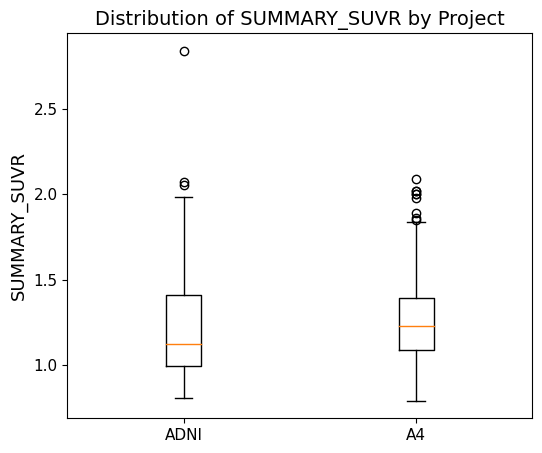

In [18]:
plt.figure(figsize=(6, 5))
plt.boxplot(
    [meta2.loc[meta2.Project == 'ADNI', 'SUMMARY_SUVR'].dropna(),
     meta2.loc[meta2.Project == 'A4', 'SUMMARY_SUVR']],
    labels=['ADNI', 'A4']
)
plt.ylabel("SUMMARY_SUVR")
plt.title("Distribution of SUMMARY_SUVR by Project")
plt.show()

In [19]:
meta2.CENTILOIDS

0         9.4714
1        -5.0000
2        58.0000
3        49.7468
4       -10.6663
          ...   
3105    -14.0000
3106         NaN
3107    103.0000
3108      8.0000
3109     93.0000
Name: CENTILOIDS, Length: 3110, dtype: float64

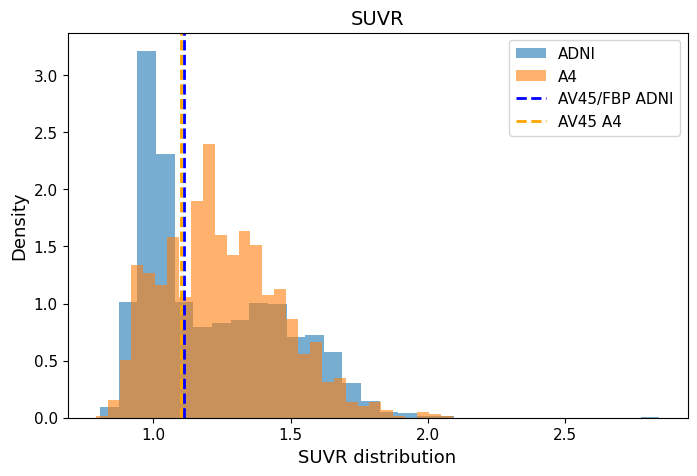

In [20]:
# Extract data
adni = meta2.loc[meta2.Project == 'ADNI', 'SUMMARY_SUVR'].dropna()
a4   = meta2.loc[meta2.Project == 'A4', 'SUMMARY_SUVR'].dropna()


t_stat, p_value = ttest_ind(adni, a4, equal_var=False)

# Plot overlapping histograms
plt.figure(figsize=(8, 5))
plt.hist(adni, bins=30, alpha=0.6, label='ADNI', density=True)
plt.hist(a4, bins=30, alpha=0.6, label='A4', density=True)

plt.axvline(1.11, color="blue", linestyle="--", linewidth=2, label="AV45/FBP ADNI")
#plt.axvline(1.4, color="red", linestyle="--", linewidth=2, label="PiB ADNI")
#plt.axvline(1.08, color="green", linestyle="--", linewidth=2, label="FBB ADNI")
plt.axvline(1.10, color="orange", linestyle="--", linewidth=2, label="AV45 A4")


plt.xlabel("SUVR distribution")
plt.ylabel("Density")
plt.title("SUVR")
plt.legend()
plt.show()


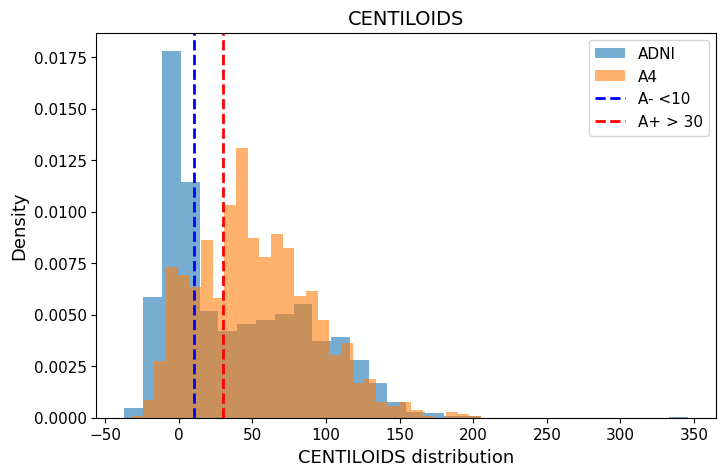

In [21]:
# Extract data
adni = meta2.loc[meta2.Project == 'ADNI', 'CENTILOIDS'].dropna()
a4   = meta2.loc[meta2.Project == 'A4', 'CENTILOIDS'].dropna()


t_stat, p_value = ttest_ind(adni, a4, equal_var=False)

# Plot overlapping histograms
plt.figure(figsize=(8, 5))
plt.hist(adni, bins=30, alpha=0.6, label='ADNI', density=True)
plt.hist(a4, bins=30, alpha=0.6, label='A4', density=True)

plt.axvline(10, color="blue", linestyle="--", linewidth=2, label="A- <10 ")
plt.axvline(30, color="red", linestyle="--", linewidth=2, label="A+ > 30")
#plt.axvline(1.08, color="green", linestyle="--", linewidth=2, label="FBB ADNI")
#plt.axvline(1.10, color="orange", linestyle="--", linewidth=2, label="AV45 A4")


plt.xlabel("CENTILOIDS distribution")
plt.ylabel("Density")
plt.title("CENTILOIDS")
plt.legend()
plt.show()

In [14]:
# ADNI MMSE table to extract VISCODE2
ADNI_mmse = pd.read_csv('/csc/epitkane/home/atagmazi/ADDL_pipeline/scripts/ADNI_MMSE_04Aug2025.csv',header=[0], index_col=[0], low_memory = False)


In [23]:
ADNI_mmse

,PTID,RID,VISCODE,VISCODE2,VISDATE,DONE,NDREASON,SOURCE,MMDATE,MMYEAR,...,MMDRAW,MMSCORE,ID,SITEID,USERDATE,USERDATE2,DD_CRF_VERSION_LABEL,LANGUAGE_CODE,HAS_QC_ERROR,update_stamp
PHASE,,,,,,,,,,,,,,,,,,,,,
ADNI1,011_S_0002,2,sc,sc,2005-08-17,NaN,NaN,NaN,1.0,1.0,...,1.0,28.0,10,107,2005-08-17,NaN,NaN,NaN,NaN,2024-08-22 07:18:34.0
ADNI1,022_S_0001,1,f,f,2005-08-18,NaN,NaN,NaN,1.0,1.0,...,0.0,28.0,12,10,2005-08-18,NaN,NaN,NaN,NaN,2024-08-22 07:18:34.0
ADNI1,011_S_0003,3,sc,sc,2005-08-18,NaN,NaN,NaN,0.0,1.0,...,1.0,20.0,14,107,2005-08-18,NaN,NaN,NaN,NaN,2024-08-22 07:18:34.0
ADNI1,022_S_0004,4,sc,sc,2005-08-18,NaN,NaN,NaN,1.0,1.0,...,0.0,27.0,16,10,2005-08-18,NaN,NaN,NaN,NaN,2024-08-22 07:18:34.0
ADNI1,011_S_0005,5,sc,sc,2005-08-23,NaN,NaN,NaN,1.0,1.0,...,1.0,29.0,18,107,2005-08-23,NaN,NaN,NaN,NaN,2024-08-22 07:18:34.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ADNI4,010_S_10869,10869,4_sc,sc,2025-07-16,1.0,NaN,1.0,0.0,1.0,...,1.0,24.0,112020,10,2025-07-30,2025-07-30,v1,e,0.0,2025-08-01 02:05:06.0
ADNI4,035_S_6480,6480,4_m12,m84,2025-07-23,1.0,NaN,1.0,0.0,1.0,...,1.0,26.0,112265,35,2025-07-30,2025-07-30,v1,e,0.0,2025-08-01 02:05:06.0
ADNI4,114_S_6597,6597,4_init,m78,2025-07-23,1.0,NaN,1.0,1.0,1.0,...,0.0,25.0,112414,114,2025-07-31,2025-07-31,v1,e,0.0,2025-08-02 02:03:16.0


In [335]:
meta2[meta2.Project == 'ADNI']

,Project,Phase,Sex,Weight,Research.Group,VISCODE,Study.Date,Age,Modality,Description,...,Subject.ID,frontal_lobe,cingulate,parietal,temporal,SUMMARY_SUVR,CENTILOIDS,AMYLOID_STATUS,CDR,VISCODE2
1,ADNI,ADNI 2,M,84.9,MCI,v21,9/30/2013,69.7,PET,"AV45 Co-registered, Averaged <- PET Brain AV_4...",...,023_S_4115,1.153928,1.273741,1.247301,1.089690,0.979,-5.0,0.0,NaN,m24
2,ADNI,ADNI 2,M,75.7,CN,v21,1/22/2014,79.2,PET,"AV45 Co-registered, Averaged <- ADNI Brain PET...",...,032_S_4429,1.834832,1.947646,1.842250,1.283489,1.315,58.0,1.0,NaN,m24
5,ADNI,ADNI 2,F,68.0,MCI,v31,12/29/2015,78.8,PET,"AV45 Co-registered, Averaged <- 016-S-4902(AC)...",...,016_S_4902,1.315704,1.324077,1.323315,1.347344,1.367,68.0,1.0,NaN,m36
6,ADNI,ADNI GO,M,69.9,MCI,bl,5/19/2011,74.9,PET,"AV45 Co-registered, Averaged <- 3D ADNI-GO AV4...",...,094_S_2367,1.181462,1.038707,1.242113,1.114056,1.077,13.0,0.0,NaN,bl
9,ADNI,ADNI GO,F,71.2,MCI,m48,10/14/2010,69.4,PET,"AV45 Co-registered, Averaged <- ADNI ITERATIVE...",...,033_S_0906,1.307461,1.363619,1.388973,1.247538,NaN,NaN,NaN,NaN,m48
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3105,ADNI,ADNI 2,F,76.7,CN,v31,1/07/2015,78.9,PET,"AV45 Co-registered, Averaged <- AV45_Dyn_4x5mi...",...,067_S_0056,1.030950,1.195908,1.008843,0.985447,0.931,-14.0,0.0,NaN,m108
3106,ADNI,ADNI GO,M,65.3,CN,m48,12/15/2010,89.3,PET,"AV45 Co-registered, Averaged <- 20 min 3D AV45...",...,005_S_0553,1.256077,1.259742,1.229100,1.147527,NaN,NaN,NaN,NaN,m48
3107,ADNI,ADNI 2,M,72.1,AD,v21,9/20/2013,81.5,PET,"AV45 Co-registered, Averaged <- Adni AV45 4 X ...",...,006_S_4153,1.607215,1.532738,1.554297,1.398776,1.552,103.0,1.0,NaN,m24
3108,ADNI,ADNI 2,M,57.5,CN,v31,9/17/2014,79.1,PET,"AV45 Co-registered, Averaged <- ADNIGO - AV45 ...",...,009_S_0751,1.251284,1.143896,1.295364,1.120481,1.048,8.0,0.0,NaN,m96


In [333]:
meta2['VISCODE2'] = meta2.VISCODE

In [340]:
# restore VISCODE2
for i in range(meta2.shape[0]):
#for i in range(10):
    if meta2.Project[i]== 'ADNI':
        temp = ADNI_mmse[(ADNI_mmse.PTID == meta2.MRI_subID[i]) & (ADNI_mmse.VISCODE == meta2.VISCODE[i])]
        if temp.shape[0]>0:
            meta2.loc[i,'VISCODE2'] = temp.VISCODE2.values[0]
        else: meta2.loc[i,'VISCODE2'] = meta2.loc[i,'VISCODE']

            
meta2.loc[meta2.VISCODE == 'v03','VISCODE2'] = 'bl'
meta2.loc[meta2.VISCODE2 == 'v21','VISCODE2'] = 'm24'
meta2.loc[meta2.VISCODE2 == 'v11','VISCODE2'] = 'm24' # just calculate number of monthes from baseline study date

In [26]:
meta2.VISCODE2.isna().value_counts()

False    3110
Name: VISCODE2, dtype: int64

In [341]:
meta2.VISCODE2.value_counts()

SCV2    1328
bl       765
m24      474
m48      286
m60       61
m72       55
m84       43
m96       36
m108      29
m36       16
m120      14
m12        3
Name: VISCODE2, dtype: int64

In [342]:
meta2_selected = meta2[['Project', 'Phase','MRI_subID','Sex', 'Weight', 'Research.Group', 'VISCODE','VISCODE2',
                       'Study.Date', 'Age', 'Modality', 'Description', 'Imaging.Protocol','Image.Data.ID', 
                       'modality_subtype', 'PATH','PET_PATH_normalised', 'AMYLOID_STATUS','SUMMARY_SUVR','CENTILOIDS']].copy()

new_columns = ['APOE4', 'ABETA', 'TAU', 'PTAU', 'MMSE', 'ADAS11', 'ADAS13',
               'RAVLT_immediate', 'LDELTOTAL', 'DIGITSCOR','TRABSCOR', 'PACC']
for col in new_columns:
    meta2_selected[col] = np.nan
    
for i in range(meta2_selected.shape[0]):
#for i in range(10):
    if meta2_selected.Project[i]== 'ADNI':
        temp = ADNI_key[(ADNI_key.PTID == meta2_selected.MRI_subID[i]) & 
                        ((ADNI_key.VISCODE == meta2_selected.VISCODE[i]) | (ADNI_key.VISCODE == meta2_selected.VISCODE2[i]) )]
        meta2_selected.loc[i,'APOE4'] = temp.APOE4.values[0] if temp.shape[0] > 0 else np.nan
        
        meta2_selected.loc[i,'ABETA'] = temp.ABETA.values[0] if temp.shape[0] > 0 else np.nan
        meta2_selected.loc[i,'TAU'] = temp.TAU.values[0] if temp.shape[0] > 0 else np.nan
        meta2_selected.loc[i,'PTAU'] = temp.PTAU.values[0] if temp.shape[0] > 0 else np.nan
        
        meta2_selected.loc[i,'MMSE'] = temp.MMSE.values[0] if temp.shape[0] > 0 else np.nan
        meta2_selected.loc[i,'ADAS11'] = temp.ADAS11.values[0] if temp.shape[0] > 0 else np.nan
        meta2_selected.loc[i,'ADAS13'] = temp.ADAS13.values[0] if temp.shape[0] > 0 else np.nan
        meta2_selected.loc[i,'RAVLT_immediate'] = temp.RAVLT_immediate.values[0] if temp.shape[0] > 0 else np.nan
        meta2_selected.loc[i,'LDELTOTAL'] = temp.LDELTOTAL.values[0] if temp.shape[0] > 0 else np.nan
        meta2_selected.loc[i,'DIGITSCOR'] = temp.DIGITSCOR.values[0] if temp.shape[0] > 0 else np.nan
        meta2_selected.loc[i,'TRABSCOR'] = temp.TRABSCOR.values[0] if temp.shape[0] > 0 else np.nan
        #meta2_selected.loc[i,'mPACCdigit'] = temp.mPACCdigit.values[0] if temp.shape[0] > 0 else np.nan
        meta2_selected.loc[i,'PACC'] = temp.mPACCtrailsB.values[0] if temp.shape[0] > 0 else np.nan
        
    if meta2_selected.Project[i]== 'A4': 
        
        #mmse
        temp = A4_mmse[(A4_mmse.BID == meta2_selected.MRI_subID[i])]
        meta2_selected.loc[i,'MMSE'] = temp.MMSCORE.values[0] if temp.shape[0] > 0 else np.nan
        
        #ldeltotal
        temp = A4_coglogic[(A4_coglogic.BID == meta2_selected.MRI_subID[i])]
        meta2_selected.loc[i,'LDELTOTAL'] = temp.LDELTOTAL.values[0] if temp.shape[0] > 0 else np.nan
        #FCSR16
        #temp = A4_cogfcsr16[(A4_cogfcsr16.BID == meta2_selected.MRI_subID[i])]
        #meta2_selected.loc[i,'FCSR16'] = temp.FCTOTAL.values[0] if temp.shape[0] > 0 else np.nan
        
        #digitscore
        temp = A4_cogdigit[(A4_cogdigit.BID == meta2_selected.MRI_subID[i])]
        meta2_selected.loc[i,'DIGITSCOR'] = temp.DIGITTOTAL.values[0] if temp.shape[0] > 0 else np.nan
        
        #PACC
        temp = A4_PACC[(A4_PACC.BID == meta2_selected.MRI_subID[i])]
        meta2_selected.loc[i,'PACC'] = temp.PACCRN.values[0] if temp.shape[0] > 0 else np.nan
   


In [308]:
meta2_selected.MRI_subID

0        B59563700
1       023_S_4115
2       032_S_4429
3        B45524671
4        B14220479
           ...    
3105    067_S_0056
3106    005_S_0553
3107    006_S_4153
3108    009_S_0751
3109    128_S_2045
Name: MRI_subID, Length: 3110, dtype: object

In [328]:
meta2.columns

Index(['Project', 'Phase', 'Sex', 'Weight', 'Research.Group', 'VISCODE',
       'Study.Date', 'Age', 'Modality', 'Description', 'Imaging.Protocol',
       'Image.Data.ID', 'modality_subtype', 'PATH', 'MRI_subID',
       'MRI_Modality', 'MRI_Research.Group', 'MRI_Age', 'MRI_VISCODE',
       'MRI_studydate', 'MRI_Description', 'MRI_Imaging.protocol', 'MRI_Type',
       'MRI_ID', 'MRI_PATH', 'PET_PATH_normalised', 'MRI_PATH_registered',
       'pet_min', 'pet_max', 'pet_90q', 'pet_95q', 'pet_99q', 'pet_999q',
       'mri_min', 'mri_max', 'mri_90q', 'mri_95q', 'mri_99q', 'mri_999q',
       'Subject.ID', 'frontal_lobe', 'cingulate', 'parietal', 'temporal',
       'SUMMARY_SUVR', 'CENTILOIDS', 'AMYLOID_STATUS', 'CDR'],
      dtype='object')

In [348]:
meta2_selected['CDR'] = np.nan
ADNI_cdr.VISCODE[ADNI_cdr.VISCODE == 'sc'] = 'bl'
ADNI_cdr.VISCODE2[ADNI_cdr.VISCODE2 == 'sc'] = 'bl'
for i in range(meta2_selected.shape[0]):
    if meta2_selected.Project[i]== 'ADNI':
        temp = ADNI_cdr[(ADNI_cdr.PTID == meta2_selected.MRI_subID[i]) & 
                        ((ADNI_cdr.VISCODE == meta2_selected.VISCODE[i]) | (ADNI_cdr.VISCODE2 == meta2_selected.VISCODE2[i]) )]
        meta2_selected.loc[i,'CDR'] = temp.CDGLOBAL.values[0] if temp.shape[0] > 0 else np.nan
        
    if meta2_selected.Project[i]== 'A4': 
        
        #mmse
        temp = A4_cdr[(A4_cdr.BID == meta2_selected.MRI_subID[i])]
        meta2_selected.loc[i,'CDR'] = temp.CDGLOBAL.values[0] if temp.shape[0] > 0 else np.nan
        

/csc/epitkane/home/atagmazi/.conda/envs/atagmazi_gpu8/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/csc/epitkane/home/atagmazi/.conda/envs/atagmazi_gpu8/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [18]:
meta2_selected.loc[meta2_selected.ABETA == '>1700','ABETA'] = '1700'
meta2_selected.ABETA = np.array(meta2_selected.ABETA.values, dtype = float)
#meta2_selected.ABETA = float(meta2_selected.ABETA)

meta2_selected.TAU = np.array(meta2_selected.TAU.values, dtype = float)

meta2_selected.loc[meta2_selected.PTAU == '<8','PTAU'] = '8'
meta2_selected.PTAU = np.array(meta2_selected.PTAU.values, dtype = float)

## Populational characteristic part 2

In [19]:
#Amyloid status
print(meta2_selected[meta2_selected.Project == 'ADNI'].AMYLOID_STATUS.value_counts())

print(meta2_selected[meta2_selected.Project == 'A4'].AMYLOID_STATUS.value_counts())


1.0    839
0.0    785
Name: AMYLOID_STATUS, dtype: int64
1.0    1008
0.0     320
Name: AMYLOID_STATUS, dtype: int64


In [31]:
#Amyloid status
print(meta2_selected[meta2_selected.Project == 'ADNI'].APOE4.value_counts())

print(meta2_selected[meta2_selected.Project == 'A4'].APOE4.value_counts())


0.0    1024
1.0     609
2.0     143
Name: APOE4, dtype: int64
Series([], Name: APOE4, dtype: int64)


In [32]:
#PACC
print(meta2_selected[meta2_selected.Project == 'ADNI'].PACC.mean())
print(meta2_selected[meta2_selected.Project == 'ADNI'].PACC.std())

print(meta2_selected[meta2_selected.Project == 'A4'].PACC.mean())
print(meta2_selected[meta2_selected.Project == 'A4'].PACC.std())

-4.6060369287125935
6.969329019481699
-0.08285960208961081
0.9919415259074377


In [349]:
#CDR
print(meta2_selected[meta2_selected.Project == 'ADNI'].CDR.value_counts())

print(meta2_selected[meta2_selected.Project == 'A4'].CDR.value_counts())


 0.5    915
 0.0    645
 1.0    178
 2.0     18
-1.0     17
 3.0      6
Name: CDR, dtype: int64
0.0    1328
Name: CDR, dtype: int64


In [350]:
meta2_selected[(meta2_selected["Project"] == "ADNI") & (meta2_selected["CDR"].isna())]

,Project,Phase,MRI_subID,Sex,Weight,Research.Group,VISCODE,VISCODE2,Study.Date,Age,...,PTAU,MMSE,ADAS11,ADAS13,RAVLT_immediate,LDELTOTAL,DIGITSCOR,TRABSCOR,PACC,CDR
494,ADNI,ADNI 2,116_S_4732,M,82.0,AD,v21,m24,5/13/2014,79.3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1901,ADNI,ADNI 2,098_S_2052,M,94.3,MCI,v11,m24,9/24/2012,75.3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2625,ADNI,ADNI 2,126_S_4686,M,87.0,AD,v21,m24,5/13/2014,73.8,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [322]:
meta2_selected[meta2_selected.Project == 'ADNI']

,Project,Phase,MRI_subID,Sex,Weight,Research.Group,VISCODE,VISCODE2,Study.Date,Age,...,PTAU,MMSE,ADAS11,ADAS13,RAVLT_immediate,LDELTOTAL,DIGITSCOR,TRABSCOR,PACC,CDR
1,ADNI,ADNI 2,023_S_4115,M,84.9,MCI,v21,m24,9/30/2013,69.7,...,23.37,29.0,9.0,18.0,31.0,6.0,NaN,59.0,-4.594110,0.5
2,ADNI,ADNI 2,032_S_4429,M,75.7,CN,v21,m24,1/22/2014,79.2,...,26.66,28.0,2.0,3.0,63.0,15.0,NaN,84.0,0.295178,0.0
5,ADNI,ADNI 2,016_S_4902,F,68.0,MCI,v31,m36,12/29/2015,78.8,...,NaN,23.0,27.0,39.0,14.0,0.0,NaN,142.0,-14.826400,1.0
6,ADNI,ADNI GO,094_S_2367,M,69.9,MCI,bl,bl,5/19/2011,74.9,...,18.85,25.0,6.0,10.0,33.0,9.0,NaN,66.0,-5.222800,NaN
9,ADNI,ADNI GO,033_S_0906,F,71.2,MCI,m48,m48,10/14/2010,69.4,...,35.54,23.0,15.0,25.0,26.0,0.0,NaN,300.0,-16.610700,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3105,ADNI,ADNI 2,067_S_0056,F,76.7,CN,v31,m108,1/07/2015,78.9,...,NaN,29.0,3.0,3.0,41.0,9.0,NaN,300.0,-3.105770,0.0
3106,ADNI,ADNI GO,005_S_0553,M,65.3,CN,m48,m48,12/15/2010,89.3,...,NaN,30.0,3.0,7.0,31.0,23.0,NaN,65.0,3.932580,0.0
3107,ADNI,ADNI 2,006_S_4153,M,72.1,AD,v21,m24,9/20/2013,81.5,...,43.51,19.0,23.0,34.0,15.0,0.0,NaN,182.0,-18.909000,0.5
3108,ADNI,ADNI 2,009_S_0751,M,57.5,CN,v31,m96,9/17/2014,79.1,...,NaN,27.0,12.0,16.0,37.0,14.0,NaN,54.0,-1.504600,0.0


# Uploading features

In [20]:
# remove samples with missing amyloid status info
missing = meta2_selected[meta2_selected.AMYLOID_STATUS.isna()]

In [21]:
missing

,Project,Phase,MRI_subID,Sex,Weight,Research.Group,VISCODE,VISCODE2,Study.Date,Age,...,TAU,PTAU,MMSE,ADAS11,ADAS13,RAVLT_immediate,LDELTOTAL,DIGITSCOR,TRABSCOR,PACC
9,ADNI,ADNI GO,033_S_0906,F,71.2,MCI,m48,m48,10/14/2010,69.4,...,385.6,35.54,23.0,15.0,25.0,26.0,0.0,NaN,300.0,-16.610700
11,ADNI,ADNI 2,014_S_4080,F,88.5,CN,v03,bl,8/17/2011,78.8,...,295.9,28.08,28.0,7.0,12.0,31.0,18.0,NaN,90.0,-0.639436
15,ADNI,ADNI GO,073_S_2190,M,64.8,MCI,bl,bl,3/30/2011,82.8,...,341.5,35.48,28.0,7.0,9.0,33.0,9.0,NaN,166.0,-3.680050
27,ADNI,ADNI GO,136_S_0873,F,46.3,MCI,m48,m48,11/09/2010,82.2,...,NaN,NaN,21.0,25.0,37.0,20.0,0.0,NaN,NaN,-20.069200
32,ADNI,ADNI GO,128_S_0229,F,69.4,CN,m48,m48,10/19/2010,79.1,...,NaN,NaN,30.0,1.0,3.0,72.0,20.0,NaN,103.0,3.613470
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3022,ADNI,ADNI GO,003_S_1057,F,63.5,MCI,m48,m48,3/11/2011,65.7,...,NaN,NaN,22.0,21.0,35.0,18.0,0.0,NaN,140.0,-15.665500
3040,ADNI,ADNI GO,127_S_0260,F,74.9,CN,m60,m60,5/17/2011,83.9,...,199.2,15.77,29.0,4.0,7.0,52.0,14.0,NaN,79.0,-0.100315
3096,ADNI,ADNI GO,082_S_2121,F,69.6,MCI,bl,bl,10/14/2010,67.9,...,247.4,20.87,23.0,7.0,10.0,41.0,9.0,NaN,120.0,-7.828700
3099,ADNI,ADNI 2,128_S_4599,M,88.0,CN,v03,bl,6/01/2012,60.2,...,166.6,15.80,30.0,0.0,0.0,71.0,19.0,NaN,47.0,5.167270


In [22]:
df_train = pd.read_csv(path + '/latent_features_train2_'+ date+'.csv', index_col = 0)
df_validation = pd.read_csv(path + '/latent_features_validation2_'+ date+'.csv', index_col = 0)
df_test = pd.read_csv(path + '/latent_features_test2_'+ date+'.csv', index_col = 0)

df_all = pd.concat([df_train,df_validation,df_test], axis = 1)

In [23]:
ids = []
id_colname = []
for col in df_all.columns:
    #ids.append(col.split('_')[0]) # 1modality 
    ids.append(col.split('/')[6].split('_')[0])
    id_colname.append(col.split('/')[6])
ids_unique = list(dict.fromkeys(ids)) 
df_all.columns = id_colname

In [24]:
# concatenate features from slices to scan level
pet_combined_df = pd.DataFrame()
for i in ids_unique:
    #Find columns that start with the current ID
    columns = [col for col in df_all.columns if col.startswith(i)]
    
    # Concatenate the matching columns vertically
    concat = pd.concat([df_all[col] for col in columns], ignore_index=True)
    
    # Assign the concatenated result to a new column in the combined DataFrame
    pet_combined_df[i] = concat
    
print('combined pet features')


combined pet features


In [39]:
pet_combined_df.shape

(11648, 3110)

In [25]:

# Keep only the columns NOT in missing['Image.Data.ID']
pet_combined_df_cleaned = pet_combined_df.loc[:, ~pet_combined_df.columns.isin(missing['Image.Data.ID'])]
meta2_cleaned = meta2_selected.drop(index=missing.index)
meta2_cleaned.reset_index(drop=True, inplace = True)

In [26]:
ad = meta2_cleaned[meta2_cleaned['Research.Group'] == 'AD']
pet_combined_df_cleaned_noad = pet_combined_df_cleaned.loc[:, ~pet_combined_df_cleaned.columns.isin(ad['Image.Data.ID'])]
meta2_cleaned_noad = meta2_cleaned.drop(index=ad.index)
meta2_cleaned_noad.reset_index(drop=True, inplace = True)

In [42]:
pet_combined_df_cleaned.shape

(11648, 2952)

In [43]:
pet_combined_df_cleaned_noad.shape

(11648, 2802)

In [44]:
meta2_cleaned.AMYLOID_STATUS.value_counts()

1.0    1847
0.0    1105
Name: AMYLOID_STATUS, dtype: int64

In [45]:
meta2_cleaned_noad.AMYLOID_STATUS.value_counts()

1.0    1713
0.0    1089
Name: AMYLOID_STATUS, dtype: int64

In [46]:
meta2_cleaned_noad['SUMMARY_SUVR'].min()

0.79

In [47]:
meta2_cleaned_noad['ABETA'].min()

203.0

In [48]:
meta2_cleaned_noad['TAU'].min()

81.54

In [49]:
meta2_cleaned_noad['PTAU'].min()

8.0

# AD-related measurments transformation

/csc/epitkane/home/atagmazi/.conda/envs/atagmazi_gpu8/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


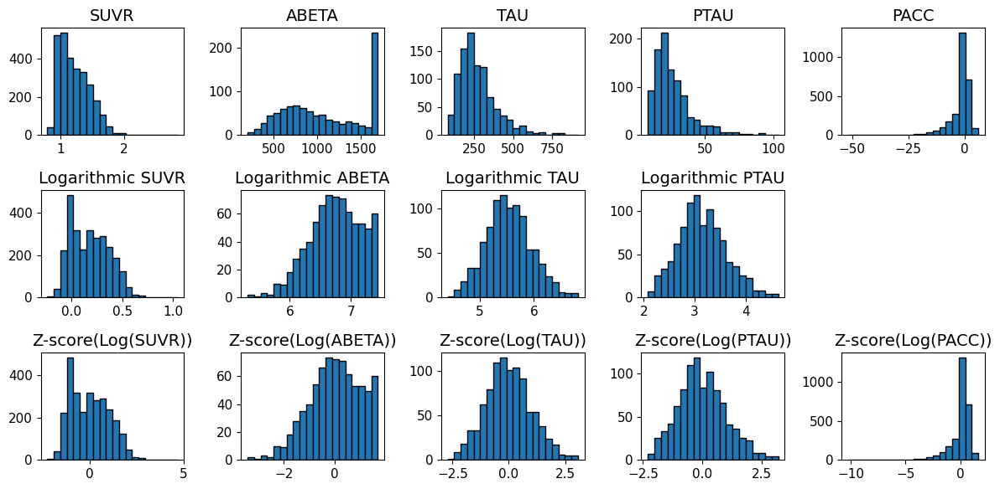

In [27]:

# Columns to plot
cols = ['SUMMARY_SUVR','ABETA', 'TAU', 'PTAU',  'PACC']
names = ['SUVR','ABETA', 'TAU', 'PTAU',  'PACC']
# Create subplots
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(12,6))
axes = axes.flatten()

# Plot histograms for each variable
for i, col in enumerate(cols):
    if col in meta2_cleaned_noad.columns:
        axes[i].hist(meta2_cleaned_noad[col].dropna(), bins=20, edgecolor='black')
        axes[i].set_title(names[i])
    else:
        axes[i].set_visible(False)

cols = ['SUMMARY_SUVR','ABETA', 'TAU', 'PTAU',  'PACC']
for i, col in enumerate(cols):
    if col in meta2_cleaned_noad.columns:
        data = meta2_cleaned_noad[col].dropna().copy()
        if col == 'ABETA':
            data = data[data<1700]
        axes[i+5].hist(np.log(data), bins=20, edgecolor='black')
        axes[i+5].set_title('Logarithmic '+names[i])
    else:
        axes[i+5].set_visible(False)

for i, col in enumerate(cols):
    if col in meta2_cleaned_noad.columns:
        data = meta2_cleaned_noad[col].dropna().copy()
        if col == 'ABETA':
            data = data[data<1700]
        if col == 'PACC':
            axes[i+10].hist((data - np.mean(data)) / np.std(data), bins=20, edgecolor='black')
        else: 
            axes[i+10].hist((np.log(data) - np.mean(np.log(data))) / np.std(np.log(data)), bins=20, edgecolor='black')
        
        axes[i+10].set_title('Z-score(Log('+names[i]+'))')
    else:
        axes[i+10].set_visible(False)
# Adjust layout
axes[9].remove()

plt.tight_layout()

#plt.savefig(path + f'/data_distribution{date}.png', bbox_inches='tight')
#plt.savefig(path + f'/data_distribution{date}.svg', format='svg', bbox_inches='tight')


plt.show()


In [28]:
######FEATURES TRANSFORMATION 
meta2_cleaned_noad.loc[meta2_cleaned_noad.ABETA == 1700, 'ABETA'] = np.nan

meta2_cleaned_noad.loc[:, 'SUMMARY_SUVR'] = (
    (np.log(meta2_cleaned_noad.SUMMARY_SUVR) - np.mean(np.log(meta2_cleaned_noad.SUMMARY_SUVR)))
    / np.std(np.log(meta2_cleaned_noad.SUMMARY_SUVR))
)

meta2_cleaned_noad.loc[:, 'ABETA'] = (
    (np.log(meta2_cleaned_noad.ABETA) - np.mean(np.log(meta2_cleaned_noad.ABETA)))
    / np.std(np.log(meta2_cleaned_noad.ABETA))
)

meta2_cleaned_noad.loc[:, 'TAU'] = (
    (np.log(meta2_cleaned_noad.TAU) - np.mean(np.log(meta2_cleaned_noad.TAU)))
    / np.std(np.log(meta2_cleaned_noad.TAU))
)

meta2_cleaned_noad.loc[:, 'PTAU'] = (
    (np.log(meta2_cleaned_noad.PTAU) - np.mean(np.log(meta2_cleaned_noad.PTAU)))
    / np.std(np.log(meta2_cleaned_noad.PTAU))
)

meta2_cleaned_noad.loc[:, 'PACC'] = (
    (meta2_cleaned_noad.PACC - np.mean(meta2_cleaned_noad.PACC))
    / np.std(meta2_cleaned_noad.PACC)
)


(array([  7.,  41., 222., 480., 317., 227., 317., 281., 290., 237., 185.,
        124.,  49.,  14.,   8.,   2.,   0.,   0.,   0.,   1.]),
 array([-2.23803864, -1.89261713, -1.54719562, -1.20177411, -0.85635261,
        -0.5109311 , -0.16550959,  0.17991192,  0.52533342,  0.87075493,
         1.21617644,  1.56159795,  1.90701945,  2.25244096,  2.59786247,
         2.94328398,  3.28870549,  3.63412699,  3.9795485 ,  4.32497001,
         4.67039152]),
 <BarContainer object of 20 artists>)

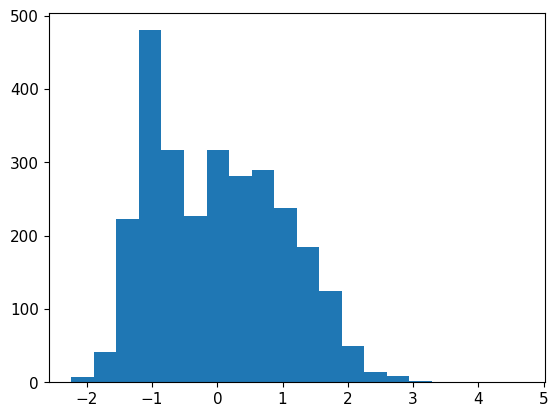

In [353]:
plt.hist(meta2_cleaned_noad.loc[:,'SUMMARY_SUVR'], bins=20)

# Random forest features selection
select features based on varience or importance

In [29]:
from sklearn.ensemble import RandomForestClassifier  # or RandomForestRegressor
import pandas as pd

def feature_selection(dataframe, labels):
    # X: features (DataFrame), y: target labels (array or Series)
    X = dataframe
    y = labels

    rf = RandomForestClassifier(n_estimators=100, random_state=42)
    rf.fit(X, y)

    importances = rf.feature_importances_
    feature_importance_df = pd.DataFrame({
        'feature': X.columns,
        'importance': importances
    })

    # Set threshold for importance (e.g., keep features with importance > 0.01)
    selected_features = feature_importance_df[feature_importance_df['importance'] > 0.01]['feature']

    print("Selected features:", selected_features.tolist())

    # Reduce X to selected features
    X_reduced = X[selected_features]
    return(X_reduced)



In [30]:
X_reduced_all = feature_selection(pet_combined_df_cleaned.T,meta2_cleaned.AMYLOID_STATUS)

Selected features: [2905, 3014, 3161, 3225, 3277, 6894, 7022, 7086, 7150]


In [31]:
X_reduced_all.columns.values

array([2905, 3014, 3161, 3225, 3277, 6894, 7022, 7086, 7150])

In [32]:
X_reduced_noad = feature_selection(pet_combined_df_cleaned_noad.T,meta2_cleaned_noad.AMYLOID_STATUS)

Selected features: [2905, 3014, 3033, 3161, 3225, 3270, 3277, 7022, 7086, 7693]


In [244]:
X_reduced_noad

,2905,3014,3033,3161,3225,3270,3277,7022,7086,7693
I1323673,0.607698,0.279434,0.803997,1.000060,1.056210,0.142450,0.447446,0.985387,1.079472,0.654254
I393755,0.510558,0.367180,0.775495,1.038580,1.147434,0.202229,0.466060,2.359696,2.425050,0.859235
I413047,0.936386,0.254062,1.196756,1.492417,1.612246,0.008646,0.562950,-0.327641,-0.543491,1.269609
I1411194,1.064757,0.261881,1.362124,1.621650,1.690316,0.036825,0.562786,0.636682,0.838313,0.861806
I1411241,0.788501,0.347665,1.022830,1.218097,1.270907,0.228825,0.405691,2.082536,2.328448,0.600983
...,...,...,...,...,...,...,...,...,...,...
I389844,0.806513,0.287551,1.028913,1.231692,1.262547,0.122837,0.375298,1.107413,1.186789,0.595420
I1411212,0.612157,0.281128,0.920041,1.214706,1.308513,0.094716,0.508404,2.786186,2.750553,0.546600
I468830,0.546932,0.316054,0.853513,1.112827,1.189536,0.137084,0.424559,2.137089,2.165479,0.549822
I445087,0.599025,0.359494,0.852048,1.109824,1.182739,0.181884,0.447228,-0.148498,-0.090141,0.850968


In [245]:
X_reduced_noad.columns.values

array([2905, 3014, 3033, 3161, 3225, 3270, 3277, 7022, 7086, 7693])

In [35]:
## features that cover 95% of importance

def feature_selection_95(dataframe, labels):
    # X: features (DataFrame), y: target labels (array or Series)
    X = dataframe
    y = labels

    rf = RandomForestClassifier(n_estimators=100, random_state=42)
    rf.fit(X, y)

    importances = rf.feature_importances_
    feature_importance_df = pd.DataFrame({
        'feature': X.columns,
        'importance': importances
    })
    
    feature_importance_df = feature_importance_df.sort_values(by='importance', ascending=False)
    feature_importance_df['cumulative_importance'] = feature_importance_df['importance'].cumsum()


    selected_features = feature_importance_df[feature_importance_df['cumulative_importance'] <= 0.95]['feature']

    print("Selected features:", selected_features.tolist())

    # Reduce X to selected features
    X_reduced = X[selected_features]
    return(X_reduced)

'''feature_importance_df = feature_importance_df.sort_values(by='importance', ascending=False)
feature_importance_df['cumulative_importance'] = feature_importance_df['importance'].cumsum()

# Keep features contributing up to 95% of total importance
selected_features = feature_importance_df[feature_importance_df['cumulative_importance'] <= 0.95]['feature']

print("Selected features:", selected_features.tolist())
X_reduced = X[selected_features]'''

'feature_importance_df = feature_importance_df.sort_values(by=\'importance\', ascending=False)\nfeature_importance_df[\'cumulative_importance\'] = feature_importance_df[\'importance\'].cumsum()\n\n# Keep features contributing up to 95% of total importance\nselected_features = feature_importance_df[feature_importance_df[\'cumulative_importance\'] <= 0.95][\'feature\']\n\nprint("Selected features:", selected_features.tolist())\nX_reduced = X[selected_features]'

In [36]:
X_reduced_all95 = feature_selection_95(pet_combined_df_cleaned.T,meta2_cleaned.AMYLOID_STATUS)

Selected features: [6894, 3225, 3161, 2905, 3277, 7150, 7086, 3014, 7022, 7693, 3270, 7245, 3033, 3078, 7406, 6455, 6989, 7309, 3097, 7821, 3334, 3322, 3981, 7342, 7181, 3511, 6958, 3417, 6638, 3533, 4505, 3142, 7117, 7278, 7373, 6574, 3703, 4445, 6877, 3545, 4749, 4633, 7430, 4249, 7949, 3481, 4317, 7238, 4057, 3661, 5017, 4825, 7053, 6263, 4381, 3206, 6391, 3526, 4893, 6861, 3673, 6199, 5145, 8077, 3341, 2670, 7730, 3469, 3386, 8548, 7878, 6797, 6766, 8356, 3821, 6726, 3085, 2350, 3021, 4077, 3989, 8333, 3895, 4765, 3034, 7565, 7629, 4614, 2798, 3491, 4377, 4509, 4189, 7470, 3741, 4121, 4637, 4365, 3319, 3398, 3149, 4253, 7161, 2862, 3405, 4441, 4701, 7437, 4023, 7666, 3575, 6519, 6702, 6477, 7534, 3767, 7214, 4429, 5879, 7581, 7757, 6925, 3693, 6541, 4237, 6839, 3993, 7662, 6135, 3929, 7501, 5273, 6830, 5561, 4141, 3082, 2926, 4573, 7325, 4313, 4045, 3447, 5637, 4205, 4685, 4125, 4333, 3098, 7622, 8141, 2478, 2414, 5741, 7794, 5021, 7385, 4506, 2777, 3066, 6045, 7174, 7031, 3436, 32

In [37]:
X_reduced_all95.shape

(2952, 3117)

In [38]:
X_reduced_noad95 = feature_selection_95(pet_combined_df_cleaned_noad.T,meta2_cleaned_noad.AMYLOID_STATUS)

Selected features: [3225, 3033, 3270, 3161, 3014, 7022, 7693, 3277, 7086, 2905, 3334, 3206, 5017, 4633, 3417, 7406, 7302, 2969, 6958, 7309, 3767, 8356, 3526, 7117, 3097, 6989, 7214, 4249, 3481, 7501, 3353, 3398, 2713, 7053, 4253, 4953, 4057, 6455, 4121, 6574, 4749, 3545, 7342, 6861, 3981, 7821, 5149, 3703, 3322, 7245, 7470, 3447, 2926, 6877, 4557, 6583, 7565, 2990, 6327, 7373, 2670, 7598, 6797, 4765, 3661, 3993, 7238, 3511, 6199, 3673, 4825, 6071, 3319, 3021, 2841, 7133, 7730, 5085, 7005, 3821, 3885, 6263, 6766, 4701, 6903, 4941, 7430, 5145, 4445, 3078, 8077, 7494, 6254, 4637, 8333, 6638, 3533, 6382, 3142, 3034, 3853, 7181, 8269, 6711, 4185, 4829, 4125, 3341, 6621, 7437, 7629, 6647, 3386, 4509, 8804, 3462, 5213, 7757, 4614, 5815, 6830, 4245, 7602, 4377, 7150, 4189, 3949, 4505, 3629, 6925, 6894, 6007, 5465, 8612, 6425, 3831, 4317, 4813, 5453, 4053, 7161, 3757, 3213, 4893, 6519, 6391, 4685, 7321, 2797, 4569, 7174, 4151, 5081, 5005, 5133, 8420, 7854, 2989, 3383, 7666, 7517, 2950, 7534, 70

In [62]:
X_reduced_noad95.shape

(2802, 3098)

# UMAPs with different features sets

In [39]:
# UMAP with all features, no AD
reducer_allfeat = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42,metric = 'correlation')
X_umap_all = reducer_allfeat.fit_transform(pet_combined_df_cleaned_noad.T)

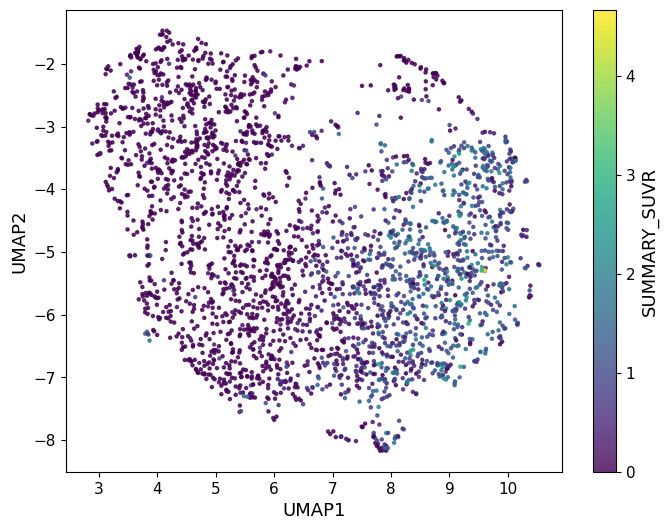

In [70]:
plt.figure(figsize=(8,6))
sc = plt.scatter(
    X_umap_all[:, 0],
    X_umap_all[:, 1],
    c=meta2_cleaned_noad["SUMMARY_SUVR"],   # continuous measure
    cmap="viridis",           # or "plasma", "coolwarm", etc.
    s=5,
    alpha=0.8,
    vmin = 0,
    vmax = meta2_cleaned_noad["SUMMARY_SUVR"].max()
)
plt.xlabel("UMAP1")
plt.ylabel("UMAP2")
plt.colorbar(sc, label="SUMMARY_SUVR")  # add color scale

plt.savefig(path + f'/big_umap{date}.png', bbox_inches='tight')
#plt.savefig(path + f'/all_vs_noad_umaps_dendrogram{date}.svg', format='svg', bbox_inches='tight')

plt.show()


In [40]:
# all samples, cover 95% of total features importance
#reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42,metric = 'correlation')
#X_umap_sel_all95 = reducer.fit_transform(X_reduced_all95)

# no AD samples, cover 95% of total features importance
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42,metric = 'correlation')
X_umap_sel_noad95 = reducer.fit_transform(X_reduced_noad95)


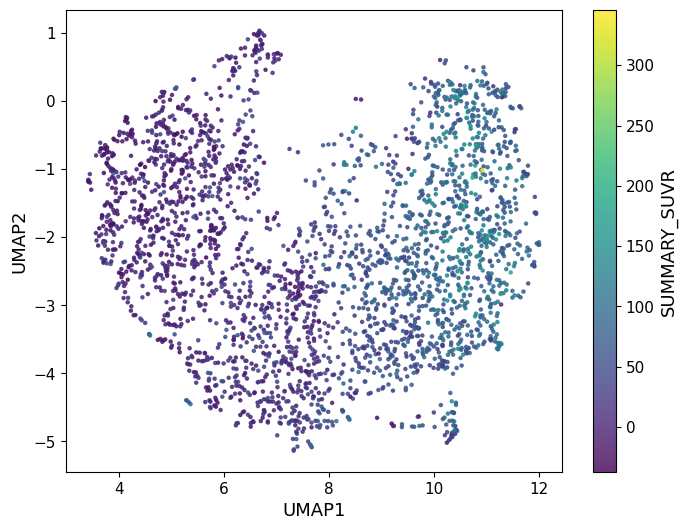

In [287]:
plt.figure(figsize=(8,6))
sc = plt.scatter(
    X_umap_sel_noad95[:, 0],
    X_umap_sel_noad95[:, 1],
    c=meta2_cleaned_noad["CENTILOIDS"],   # continuous measure
    cmap="viridis",           # or "plasma", "coolwarm", etc.
    s=5,
    alpha=0.8,
    vmin = np.min(meta2_cleaned_noad["CENTILOIDS"]),
    vmax = np.max(meta2_cleaned_noad["CENTILOIDS"])
)
plt.xlabel("UMAP1")
plt.ylabel("UMAP2")
plt.colorbar(sc, label="SUMMARY_SUVR")  # add color scale

#plt.savefig(path + f'/big_umap{date}.png', bbox_inches='tight')
#plt.savefig(path + f'/all_vs_noad_umaps_dendrogram{date}.svg', format='svg', bbox_inches='tight')

plt.show()


In [41]:
## UMAPs
# all samples, features importance > 0.01
#reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42,metric = 'correlation')
#X_umap_sel_all = reducer.fit_transform(X_reduced_noad)

# no AD samples, features importance > 0.01
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42,metric = 'correlation')
X_umap_sel_noad = reducer.fit_transform(X_reduced_noad)


In [291]:
X_reduced_noad

,2905,3014,3033,3161,3225,3270,3277,7022,7086,7693
I1323673,0.607698,0.279434,0.803997,1.000060,1.056210,0.142450,0.447446,0.985387,1.079472,0.654254
I393755,0.510558,0.367180,0.775495,1.038580,1.147434,0.202229,0.466060,2.359696,2.425050,0.859235
I413047,0.936386,0.254062,1.196756,1.492417,1.612246,0.008646,0.562950,-0.327641,-0.543491,1.269609
I1411194,1.064757,0.261881,1.362124,1.621650,1.690316,0.036825,0.562786,0.636682,0.838313,0.861806
I1411241,0.788501,0.347665,1.022830,1.218097,1.270907,0.228825,0.405691,2.082536,2.328448,0.600983
...,...,...,...,...,...,...,...,...,...,...
I389844,0.806513,0.287551,1.028913,1.231692,1.262547,0.122837,0.375298,1.107413,1.186789,0.595420
I1411212,0.612157,0.281128,0.920041,1.214706,1.308513,0.094716,0.508404,2.786186,2.750553,0.546600
I468830,0.546932,0.316054,0.853513,1.112827,1.189536,0.137084,0.424559,2.137089,2.165479,0.549822
I445087,0.599025,0.359494,0.852048,1.109824,1.182739,0.181884,0.447228,-0.148498,-0.090141,0.850968


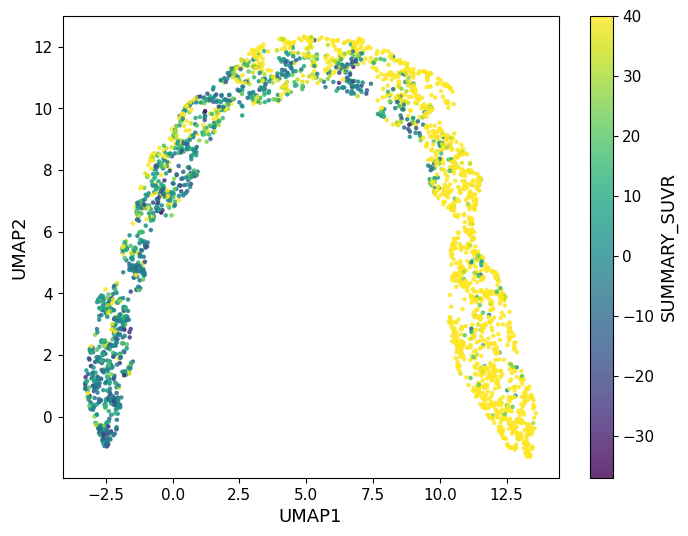

In [292]:
plt.figure(figsize=(8,6))
sc = plt.scatter(
    X_umap_sel_noad[:, 0],
    X_umap_sel_noad[:, 1],
    c=meta2_cleaned_noad["CENTILOIDS"],   # continuous measure
    cmap="viridis",           # or "plasma", "coolwarm", etc.
    s=5,
    alpha=0.8,
    vmin = np.min(meta2_cleaned_noad["CENTILOIDS"]),
    vmax = 40
)
plt.xlabel("UMAP1")
plt.ylabel("UMAP2")
plt.colorbar(sc, label="SUMMARY_SUVR")  # add color scale

#plt.savefig(path + f'/big_umap{date}.png', bbox_inches='tight')
#plt.savefig(path + f'/all_vs_noad_umaps_dendrogram{date}.svg', format='svg', bbox_inches='tight')

plt.show()


In [74]:
meta2_cleaned_noad.columns

Index(['Project', 'Phase', 'MRI_subID', 'Sex', 'Weight', 'Research.Group',
       'VISCODE', 'VISCODE2', 'Study.Date', 'Age', 'Modality', 'Description',
       'Imaging.Protocol', 'Image.Data.ID', 'modality_subtype', 'PATH',
       'PET_PATH_normalised', 'AMYLOID_STATUS', 'SUMMARY_SUVR', 'APOE4',
       'ABETA', 'TAU', 'PTAU', 'MMSE', 'ADAS11', 'ADAS13', 'RAVLT_immediate',
       'LDELTOTAL', 'DIGITSCOR', 'TRABSCOR', 'PACC'],
      dtype='object')

# Scans' ranking


In [42]:
def rank_along_parabola(df, x_col="UMAP1", y_col="UMAP2"):
    """
    Project points onto a fitted parabola and rank them along the curve.

    Parameters:
        df (pd.DataFrame): DataFrame containing UMAP coordinates.
        x_col (str): Column name for x-coordinates.
        y_col (str): Column name for y-coordinates.

    Returns:
        pd.DataFrame: Original DataFrame with added columns:
            - proj_x, proj_y : projected coordinates on parabola
            - arc_length : cumulative distance along parabola
            - rank_parabola : ordering along parabola
    """
    # ---- 1. Fit parabola ----
    coeffs = np.polyfit(df[x_col], df[y_col], 2)
    parabola = lambda x: np.polyval(coeffs, x)

    # ---- 2. Project each point onto parabola ----
    projected_points = []
    for x0, y0 in zip(df[x_col], df[y_col]):
        # candidate x-values near point
        x_candidates = np.linspace(x0 - 1, x0 + 1, 200)
        y_candidates = parabola(x_candidates)

        # closest candidate
        dists = np.sqrt((x_candidates - x0)**2 + (y_candidates - y0)**2)
        idx = np.argmin(dists)
        projected_points.append((x_candidates[idx], y_candidates[idx]))

    df = df.copy()
    df["proj_x"] = [p[0] for p in projected_points]
    df["proj_y"] = [p[1] for p in projected_points]

    # ---- 3. Rank by arc length ----
    proj_sorted = df.sort_values("proj_x").reset_index(drop=True)
    distances = np.sqrt(
        np.diff(proj_sorted["proj_x"])**2 + np.diff(proj_sorted["proj_y"])**2
    )
    arc_length = np.insert(np.cumsum(distances), 0, 0)

    proj_sorted["arc_length"] = arc_length
    proj_sorted["rank_parabola"] = proj_sorted["arc_length"].rank(method="first").astype(int) 
    proj_sorted["rank_parabola"] = proj_sorted["rank_parabola"]/proj_sorted["rank_parabola"].max() # rescale rank to 0-1 to bring scale closer to AD related measurments scales
    # ---- 4. Merge back ----
    df = df.merge(
        proj_sorted[["proj_x", "proj_y", "arc_length", "rank_parabola"]],
        on=["proj_x", "proj_y"],
        how="left"
    )

    return df


In [43]:
meta2_cleaned_noad['umap_X_all'] = X_umap_all[:, 0]
meta2_cleaned_noad['umap_Y_all'] = X_umap_all[:, 1]


ranking_all = rank_along_parabola(df = meta2_cleaned_noad, x_col="umap_X_all", y_col="umap_Y_all")
meta2_cleaned_noad['rank_parabola_all'] = ranking_all['rank_parabola'].copy()

In [68]:
np.max(meta2_cleaned_noad['rank_parabola_all'])

1.0

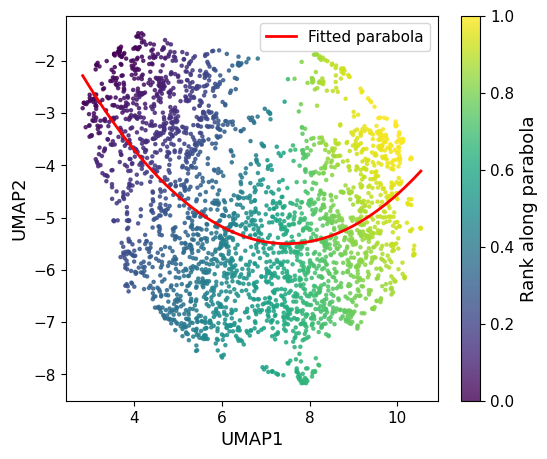

In [69]:
import numpy as np
import matplotlib.pyplot as plt

# Fit parabola to your UMAP points
coeffs = np.polyfit(X_umap_all[:, 0], X_umap_all[:, 1], 2)
fit_y = np.polyval(coeffs, X_umap_all[:, 0])

# Create plot
fig, ax = plt.subplots(figsize=(6, 5))

# Scatter plot of UMAP points colored by rank along parabola
sc = ax.scatter(
    X_umap_all[:, 0],
    X_umap_all[:, 1],
    c=meta2_cleaned_noad['rank_parabola_all'],
    cmap="viridis",
    s=5,
    alpha=0.8,
    vmin=0,
    vmax=np.max(meta2_cleaned_noad['rank_parabola_all'])
)

# Overlay fitted parabola curve
# Sort X for a smooth line
x_sorted = np.sort(X_umap_all[:, 0])
y_fit_sorted = np.polyval(coeffs, x_sorted)
ax.plot(x_sorted, y_fit_sorted, color='red', linewidth=2, label='Fitted parabola')

ax.set_xlabel("UMAP1")
ax.set_ylabel("UMAP2")

# Add colorbar and legend
fig.colorbar(sc, ax=ax, label='Rank along parabola')
ax.legend()

plt.show()


In [44]:
meta2_cleaned_noad['umap_X_95'] = X_umap_sel_noad95[:, 0]
meta2_cleaned_noad['umap_Y_95'] = X_umap_sel_noad95[:, 1]


ranking_95 = rank_along_parabola(df = meta2_cleaned_noad, x_col="umap_X_95", y_col="umap_Y_95")
meta2_cleaned_noad['rank_parabola_95'] = ranking_95['rank_parabola'].copy()

In [71]:
meta2_cleaned_noad

,Project,Phase,MRI_subID,Sex,Weight,Research.Group,VISCODE,VISCODE2,Study.Date,Age,...,LDELTOTAL,DIGITSCOR,TRABSCOR,PACC,umap_X_all,umap_Y_all,rank_parabola_all,umap_X_95,umap_Y_95,rank_parabola_95
0,A4,NaN,B59563700,M,83.9,LEARN amyloidNE,SCV2,SCV2,1/01/2016,84.4,...,10.0,46.0,NaN,0.440740,6.052932,-5.212869,0.421485,7.256672,-2.497415,0.417202
1,ADNI,ADNI 2,023_S_4115,M,84.9,MCI,v21,m24,9/30/2013,69.7,...,6.0,NaN,59.0,-0.555631,3.891479,-3.084414,0.079943,4.521598,-1.773526,0.111706
2,ADNI,ADNI 2,032_S_4429,M,75.7,CN,v21,m24,1/22/2014,79.2,...,15.0,NaN,84.0,0.450152,4.080909,-2.532140,0.054961,4.450919,-1.082883,0.065310
3,A4,NaN,B45524671,M,71.4,amyloidE,SCV2,SCV2,1/01/2016,82.5,...,11.0,33.0,NaN,0.142289,7.225991,-5.034188,0.576731,7.630265,-2.257822,0.468594
4,A4,NaN,B14220479,F,0.0,LEARN amyloidNE,SCV2,SCV2,1/01/2016,71.8,...,15.0,41.0,NaN,0.325951,4.427554,-4.911391,0.243398,5.642595,-2.986267,0.293719
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2797,ADNI,ADNI 2,033_S_0741,F,60.1,CN,v21,m84,8/29/2013,87.4,...,16.0,NaN,67.0,0.637313,7.035435,-3.903119,0.523911,6.823445,-1.760509,0.358672
2798,A4,NaN,B57770377,F,0.0,LEARN amyloidNE,SCV2,SCV2,1/01/2015,73.1,...,7.0,40.0,NaN,0.302993,5.678033,-3.867153,0.294789,6.275470,-2.302161,0.324768
2799,ADNI,ADNI 2,067_S_0056,F,76.7,CN,v31,m108,1/07/2015,78.9,...,9.0,NaN,300.0,-0.249462,5.259605,-3.796813,0.233405,5.761177,-1.901580,0.253390
2800,ADNI,ADNI 2,009_S_0751,M,57.5,CN,v31,m96,9/17/2014,79.1,...,14.0,NaN,54.0,0.079917,8.272133,-2.431593,0.875446,6.538792,0.671084,0.239829


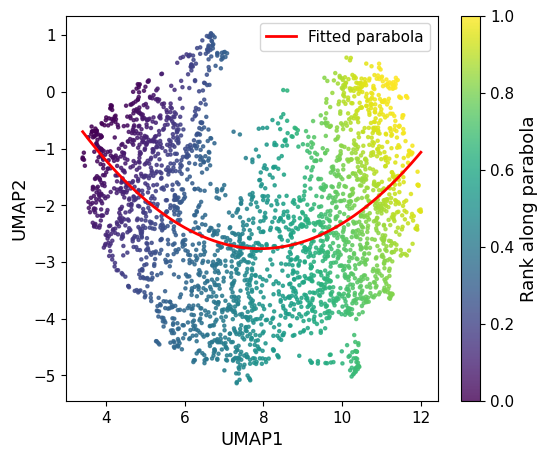

In [72]:
import numpy as np
import matplotlib.pyplot as plt

# Fit parabola to your UMAP points
coeffs = np.polyfit(X_umap_sel_noad95[:, 0], X_umap_sel_noad95[:, 1], 2)
fit_y = np.polyval(coeffs, X_umap_sel_noad95[:, 0])

# Create plot
fig, ax = plt.subplots(figsize=(6, 5))

# Scatter plot of UMAP points colored by rank along parabola
sc = ax.scatter(
    X_umap_sel_noad95[:, 0],
    X_umap_sel_noad95[:, 1],
    c=meta2_cleaned_noad['rank_parabola_95'],
    cmap="viridis",
    s=5,
    alpha=0.8,
    vmin=0,
    vmax=np.max(meta2_cleaned_noad['rank_parabola_95'])
)

# Overlay fitted parabola curve
# Sort X for a smooth line
x_sorted = np.sort(X_umap_sel_noad95[:, 0])
y_fit_sorted = np.polyval(coeffs, x_sorted)
ax.plot(x_sorted, y_fit_sorted, color='red', linewidth=2, label='Fitted parabola')

ax.set_xlabel("UMAP1")
ax.set_ylabel("UMAP2")

# Add colorbar and legend
fig.colorbar(sc, ax=ax, label='Rank along parabola')
ax.legend()

plt.show()


In [45]:
meta2_cleaned_noad['umap_X_top'] = X_umap_sel_noad[:, 0]
meta2_cleaned_noad['umap_Y_top'] = X_umap_sel_noad[:, 1]

ranking_top = rank_along_parabola(df = meta2_cleaned_noad, x_col="umap_X_top", y_col="umap_Y_top")
meta2_cleaned_noad['rank_parabola_top'] = ranking_top['rank_parabola'].copy()

In [74]:
meta2_cleaned_noad

,Project,Phase,MRI_subID,Sex,Weight,Research.Group,VISCODE,VISCODE2,Study.Date,Age,...,PACC,umap_X_all,umap_Y_all,rank_parabola_all,umap_X_95,umap_Y_95,rank_parabola_95,umap_X_top,umap_Y_top,rank_parabola_top
0,A4,NaN,B59563700,M,83.9,LEARN amyloidNE,SCV2,SCV2,1/01/2016,84.4,...,0.440740,6.052932,-5.212869,0.421485,7.256672,-2.497415,0.417202,-0.290796,7.129643,0.233762
1,ADNI,ADNI 2,023_S_4115,M,84.9,MCI,v21,m24,9/30/2013,69.7,...,-0.555631,3.891479,-3.084414,0.079943,4.521598,-1.773526,0.111706,-2.087784,-0.094147,0.025696
2,ADNI,ADNI 2,032_S_4429,M,75.7,CN,v21,m24,1/22/2014,79.2,...,0.450152,4.080909,-2.532140,0.054961,4.450919,-1.082883,0.065310,9.842444,7.216185,0.677016
3,A4,NaN,B45524671,M,71.4,amyloidE,SCV2,SCV2,1/01/2016,82.5,...,0.142289,7.225991,-5.034188,0.576731,7.630265,-2.257822,0.468594,4.196685,12.003477,0.429693
4,A4,NaN,B14220479,F,0.0,LEARN amyloidNE,SCV2,SCV2,1/01/2016,71.8,...,0.325951,4.427554,-4.911391,0.243398,5.642595,-2.986267,0.293719,-2.924521,0.941563,0.053533
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2797,ADNI,ADNI 2,033_S_0741,F,60.1,CN,v21,m84,8/29/2013,87.4,...,0.637313,7.035435,-3.903119,0.523911,6.823445,-1.760509,0.358672,-0.595223,8.095546,0.260885
2798,A4,NaN,B57770377,F,0.0,LEARN amyloidNE,SCV2,SCV2,1/01/2015,73.1,...,0.302993,5.678033,-3.867153,0.294789,6.275470,-2.302161,0.324768,-2.714389,-0.363802,0.015703
2799,ADNI,ADNI 2,067_S_0056,F,76.7,CN,v31,m108,1/07/2015,78.9,...,-0.249462,5.259605,-3.796813,0.233405,5.761177,-1.901580,0.253390,-2.678667,0.542572,0.037830
2800,ADNI,ADNI 2,009_S_0751,M,57.5,CN,v31,m96,9/17/2014,79.1,...,0.079917,8.272133,-2.431593,0.875446,6.538792,0.671084,0.239829,9.802542,7.740762,0.656674


In [75]:
len(fit_y)

2802

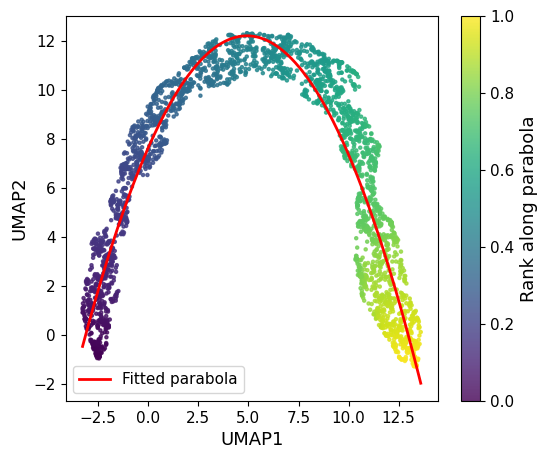

In [46]:
import numpy as np
import matplotlib.pyplot as plt

# Fit parabola to your UMAP points
coeffs = np.polyfit(X_umap_sel_noad[:, 0], X_umap_sel_noad[:, 1], 2)
fit_y = np.polyval(coeffs, X_umap_sel_noad[:, 0])

# Create plot
fig, ax = plt.subplots(figsize=(6, 5))

# Scatter plot of UMAP points colored by rank along parabola
sc = ax.scatter(
    X_umap_sel_noad[:, 0],
    X_umap_sel_noad[:, 1],
    c=meta2_cleaned_noad['rank_parabola_top'],
    cmap="viridis",
    s=5,
    alpha=0.8,
    vmin=0,
    vmax=np.max(meta2_cleaned_noad['rank_parabola_top'])
)

# Overlay fitted parabola curve
# Sort X for a smooth line
x_sorted = np.sort(X_umap_sel_noad[:, 0])
y_fit_sorted = np.polyval(coeffs, x_sorted)
ax.plot(x_sorted, y_fit_sorted, color='red', linewidth=2, label='Fitted parabola')

ax.set_xlabel("UMAP1")
ax.set_ylabel("UMAP2")

# Add colorbar and legend
fig.colorbar(sc, ax=ax, label='Rank along parabola')
ax.legend()

plt.show()


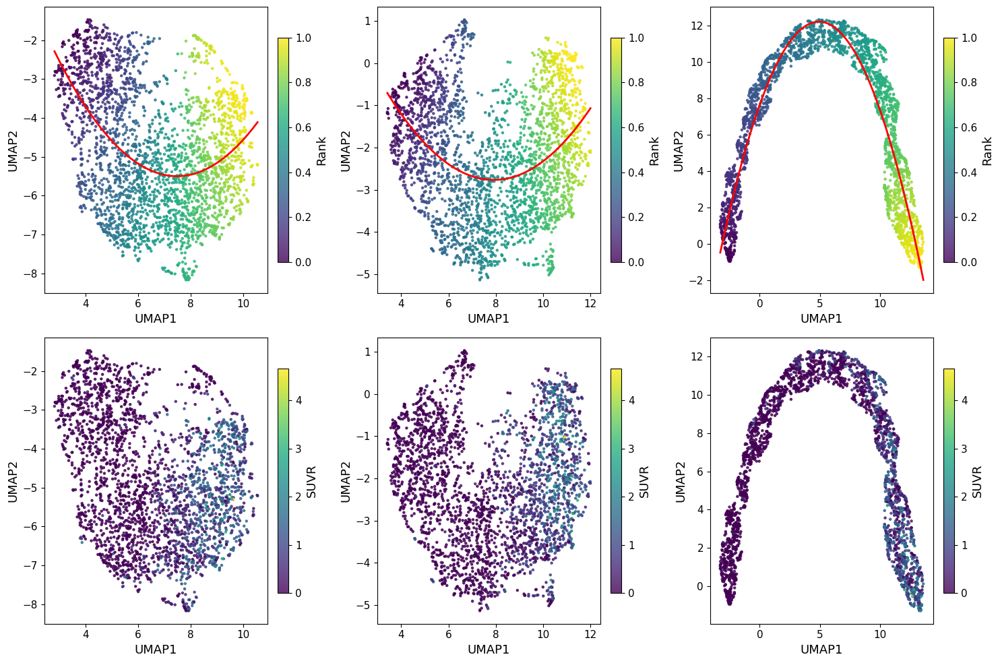

In [77]:
# Choose 6 continuous measures to visualize
features_to_plot = [meta2_cleaned_noad["rank_parabola_all"], meta2_cleaned_noad["rank_parabola_95"], meta2_cleaned_noad["rank_parabola_top"],
                    meta2_cleaned_noad["SUMMARY_SUVR"], meta2_cleaned_noad["SUMMARY_SUVR"], meta2_cleaned_noad["SUMMARY_SUVR"]]
vmax  = [np.max(meta2_cleaned_noad["rank_parabola_all"]),np.max(meta2_cleaned_noad["rank_parabola_95"]),np.max(meta2_cleaned_noad["rank_parabola_top"]),
        np.max(meta2_cleaned_noad["SUMMARY_SUVR"]),np.max(meta2_cleaned_noad["SUMMARY_SUVR"]),np.max(meta2_cleaned_noad["SUMMARY_SUVR"])]
umap = [X_umap_all,X_umap_sel_noad95,X_umap_sel_noad,
        X_umap_all,X_umap_sel_noad95,X_umap_sel_noad]
fig, axes = plt.subplots(2, 3, figsize=(15, 10))  # 2 rows, 3 columns
axes = axes.flatten()

for i, feature in enumerate(features_to_plot):
    
    coeffs = np.polyfit(umap[i][:, 0], umap[i][:, 1], 2)
    fit_y = np.polyval(coeffs, umap[i][:, 0])

    sc = axes[i].scatter(
        umap[i][:, 0],
        umap[i][:, 1],
        c=feature,
        cmap="viridis",
        s=5,
        alpha=0.8,
        vmin = 0, vmax = vmax[i]
    )
    
    x_sorted = np.sort(umap[i][:, 0])
    y_fit_sorted = np.polyval(coeffs, x_sorted)
    if i <3:
        axes[i].plot(x_sorted, y_fit_sorted, color='red', linewidth=2, label='Fitted parabola')

    #axes[i].set_title(feature)
    axes[i].set_xlabel("UMAP1")
    axes[i].set_ylabel("UMAP2")
    if i <3:
        fig.colorbar(sc, ax=axes[i], fraction=0.046, pad=0.04, label='Rank')
    else:
        fig.colorbar(sc, ax=axes[i], fraction=0.046, pad=0.04, label='SUVR')

plt.tight_layout()

#plt.savefig(path + f'/small_umaps_{date}.png', bbox_inches='tight')
#plt.savefig(path + f'/small_umaps_{date}.svg', format='svg', bbox_inches='tight')


plt.show()


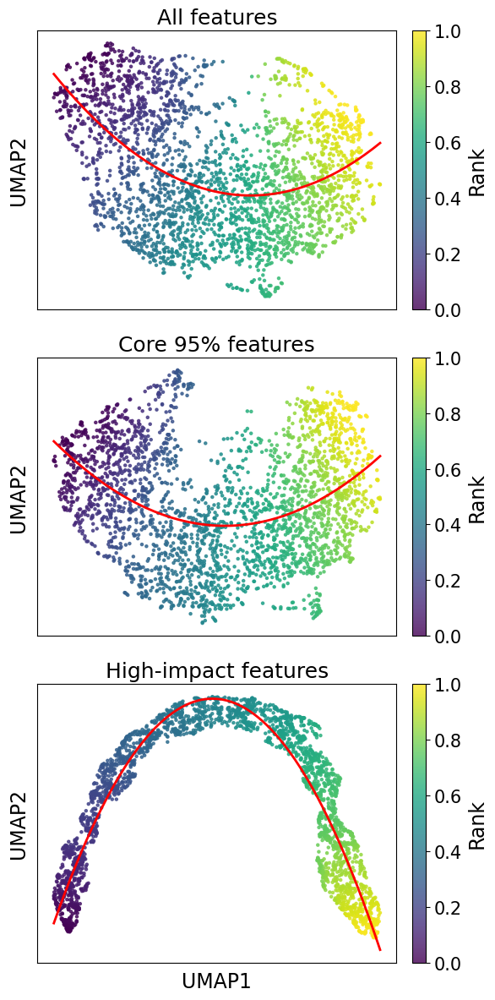

In [78]:
plt.rcParams.update({
    "font.size": 12,              # base font size
    "axes.titlesize": 18,         # title font
    "axes.labelsize": 17,         # x and y labels
    "xtick.labelsize": 15,        # x ticks
    "ytick.labelsize": 15,        # y ticks
    "legend.fontsize": 15,        # legend
})

# Choose 6 continuous measures to visualize
features_to_plot = [meta2_cleaned_noad["rank_parabola_all"], meta2_cleaned_noad["rank_parabola_95"], meta2_cleaned_noad["rank_parabola_top"]]
vmax  = [np.max(meta2_cleaned_noad["rank_parabola_all"]),np.max(meta2_cleaned_noad["rank_parabola_95"]),np.max(meta2_cleaned_noad["rank_parabola_top"])]
umap = [X_umap_all,X_umap_sel_noad95,X_umap_sel_noad]
t = ['All features','Core 95% features', 'High-impact features']
fig, axes = plt.subplots(3, 1, figsize=(6, 12))  # 2 rows, 3 columns
axes = axes.flatten()

for i, feature in enumerate(features_to_plot):
    
    coeffs = np.polyfit(umap[i][:, 0], umap[i][:, 1], 2)
    fit_y = np.polyval(coeffs, umap[i][:, 0])

    sc = axes[i].scatter(
        umap[i][:, 0],
        umap[i][:, 1],
        c=feature,
        cmap="viridis",
        s=5,
        alpha=0.8,
        vmin = 0, vmax = vmax[i]
    )
    
    x_sorted = np.sort(umap[i][:, 0])
    y_fit_sorted = np.polyval(coeffs, x_sorted)
    if i <3:
        axes[i].plot(x_sorted, y_fit_sorted, color='red', linewidth=2, label='Fitted parabola')

    axes[i].set_title(t[i])
    axes[i].set_xlabel("UMAP1")
    axes[i].set_ylabel("UMAP2")
    
    axes[i].set_xticklabels([])
    axes[i].set_yticklabels([])
    axes[i].set_xticks([])
    axes[i].set_yticks([])
    
    fig.colorbar(sc, ax=axes[i], fraction=0.046, pad=0.04, label='Rank')
    
    
axes[0].set_xlabel("")
axes[1].set_xlabel("")

plt.tight_layout()

#plt.savefig(path + f'/small_umaps_manuscript_{date}.png', bbox_inches='tight')
#plt.savefig(path + f'/small_umaps_manuscript_{date}.svg', format='svg', bbox_inches='tight')


plt.show()


# UMAP bootstrapping

In [336]:
import numpy as np
import umap

def umap_bootstrap(X, n_iter=100, sample_frac=0.5, random_state=42):
    """
    Works with both pandas DataFrame and numpy array.
    """
    rng = np.random.default_rng(random_state)
    embeddings = []

    n_samples = X.shape[0]
    subset_size = int(sample_frac * n_samples)

    for i in range(n_iter):
        # sample row indices (integer positions)
        subset_idx = rng.choice(n_samples, size=subset_size, replace=False)

        subset = X.iloc[subset_idx]  # works for numpy and pandas (iloc-like behavior)

        reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42,metric = 'correlation')
        embedding = reducer.fit_transform(subset)

        embeddings.append((subset_idx, embedding))

    return embeddings

In [ ]:
from scipy.spatial.distance import pdist

def embedding_similarity(embeddings):
    """
    Compute similarity (correlation of pairwise distances)
    between all embedding runs.
    """
    dists = [pdist(e[1]) for e in embeddings]

    sims = []
    for i in range(len(dists)):
        for j in range(i + 1, len(dists)):
            corr = np.corrcoef(dists[i], dists[j])[0, 1]
            sims.append(corr)

    return np.mean(sims), sims

In [337]:
results = umap_bootstrap(X_reduced_noad, n_iter=10, sample_frac=0.5, random_state=42)

In [303]:
import matplotlib.pyplot as plt
import math

def plot_umap_bootstrap(embeddings, n_cols=10):
    """
    Plot UMAP embeddings in a grid.

    Parameters:
        embeddings: list of (index, embedding array)
        n_cols: number of columns in grid
    """
    n_iter = len(embeddings)
    n_rows = math.ceil(n_iter / n_cols)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*2, n_rows*2))
    axes = axes.flatten()

    for i, (idx, emb) in enumerate(embeddings):
        ax = axes[i]
        ax.scatter(emb[:, 0], emb[:, 1], s=5)
        ax.set_title(f"Run {i+1}", fontsize=8)
        ax.set_xticks([])
        ax.set_yticks([])

    # Hide unused plots
    for j in range(i+1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

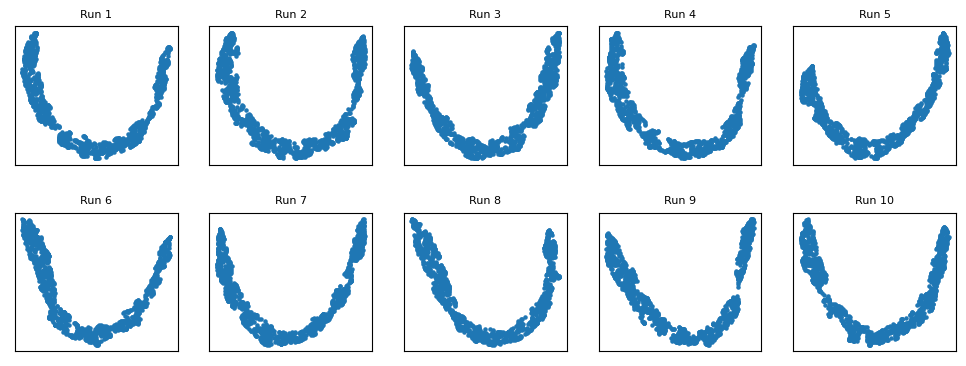

In [338]:
plot_umap_bootstrap(results, n_cols=5)

In [381]:
def umap_parabola_bootstrap(X, n_iter=100, sample_frac=0.5, random_state=42):
    """
    Bootstrap UMAP + parabola ranking with stable sample IDs.
    """

    rng = np.random.default_rng(random_state)

    # ---- FORCE SAFE INDEX TYPE ----
    if not isinstance(X, pd.DataFrame):
        X = pd.DataFrame(X)

    X = X.copy()
    X.index = X.index.astype(str)   # 🔥 fixes 45 vs 45.0 issue

    n_samples = X.shape[0]
    subset_size = int(sample_frac * n_samples)

    sample_ids = X.index.tolist()

    # store ranks per sample
    all_ranks = {sid: [] for sid in sample_ids}

    # store embeddings for plotting
    all_embeddings = []

    for i in range(n_iter):

        # ---- sample rows ----
        subset_pos = rng.choice(n_samples, size=subset_size, replace=False)
        subset = X.iloc[subset_pos].copy()

        subset_ids = subset.index.astype(str)

        # ---- UMAP ----
        reducer = umap.UMAP(random_state=42)
        emb = reducer.fit_transform(subset.values)

        df_umap = pd.DataFrame({
            "UMAP1": emb[:, 0],
            "UMAP2": emb[:, 1],
            "sample_id": subset_ids
        })

        # ---- rank ----
        ranked = rank_along_parabola(df_umap)

        ranked["sample_id"] = ranked["sample_id"].astype(str)

        # ---- optional direction fix ----
        if ranked["UMAP1"].corr(ranked["rank_parabola"]) < 0:
            ranked["rank_parabola"] = 1 - ranked["rank_parabola"]

        # ---- store results ----
        for _, row in ranked.iterrows():
            sid = str(row["sample_id"])
            all_ranks[sid].append(row["rank_parabola"])

        ranked["run"] = i
        all_embeddings.append(ranked)
        print(i)

    embeddings_df = pd.concat(all_embeddings, ignore_index=True)

    return all_ranks, embeddings_df


In [362]:
def summarize_ranks(all_ranks):
    rows = []

    for sid, vals in all_ranks.items():
        vals = np.array(vals)

        if len(vals) == 0:
            continue

        rows.append({
            "sample_id": sid,
            "mean_rank": vals.mean(),
            "std_rank": vals.std(),
            "ci_low": np.percentile(vals, 2.5),
            "ci_high": np.percentile(vals, 97.5),
            "n_obs": len(vals)
        })

    return pd.DataFrame(rows)

In [382]:
all_ranks, embeddings_df = umap_parabola_bootstrap(X_reduced_noad, n_iter = 1000)


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [396]:
import pickle

with open(path + f"all_ranks.pkl", "wb") as f:
    pickle.dump(all_ranks, f)
    
embeddings_df.to_csv(path + f"/embeddings.csv", index=False)

In [ ]:
summary_df = summarize_ranks(all_ranks)

In [397]:
all_ranks95, embeddings_df95 = umap_parabola_bootstrap(X_reduced_noad95, n_iter = 1000)


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [398]:
import pickle

with open(path + f"all_ranks95.pkl", "wb") as f:
    pickle.dump(all_ranks95, f)
    
embeddings_df.to_csv(path + f"/embeddings95.csv", index=False)

In [399]:
summary_df95 = summarize_ranks(all_ranks95)

In [401]:
all_ranks_all, embeddings_df_all = umap_parabola_bootstrap(pet_combined_df_cleaned_noad.T, n_iter = 1000)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [402]:
import pickle

with open(path + f"all_ranks_all.pkl", "wb") as f:
    pickle.dump(all_ranks_all, f)
    
embeddings_df.to_csv(path + f"/embeddings_df_all.csv", index=False)

In [404]:
summary_dfall = summarize_ranks(all_ranks_all)

In [389]:
summary_df["ci_width"] = summary_df["ci_high"] - summary_df["ci_low"]

global_stability = 1 - summary_df["ci_width"].mean()

In [390]:
global_stability

0.4669959728469667

{'whiskers': [<matplotlib.lines.Line2D at 0x7f7e505b3ad0>,
 'caps': [<matplotlib.lines.Line2D at 0x7f7e50bae590>,
 'boxes': [<matplotlib.lines.Line2D at 0x7f7e5083a450>],
 'medians': [<matplotlib.lines.Line2D at 0x7f7e50bae810>],
 'fliers': [<matplotlib.lines.Line2D at 0x7f7e50bae190>],
 'means': []}

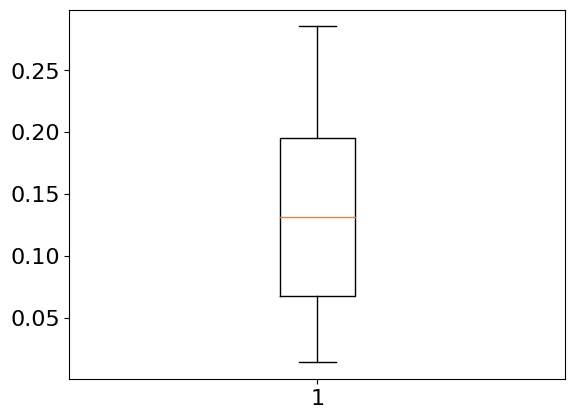

In [395]:
plt.boxplot(summary_df["std_rank"])

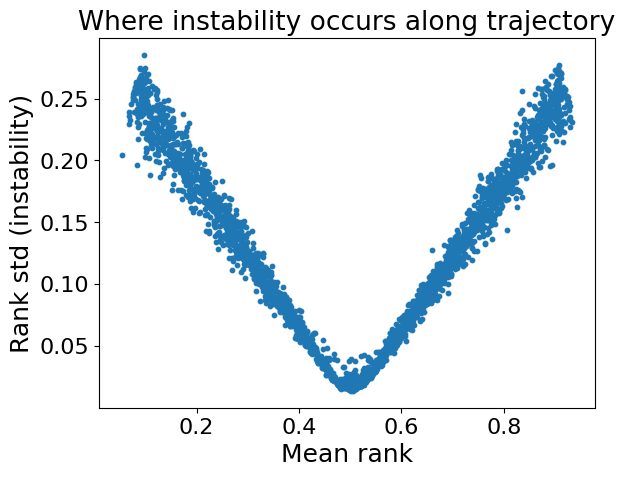

In [391]:
plt.scatter(summary_df["mean_rank"], summary_df["std_rank"], s=10)
plt.xlabel("Mean rank")
plt.ylabel("Rank std (instability)")
plt.title("Where instability occurs along trajectory")
plt.show()

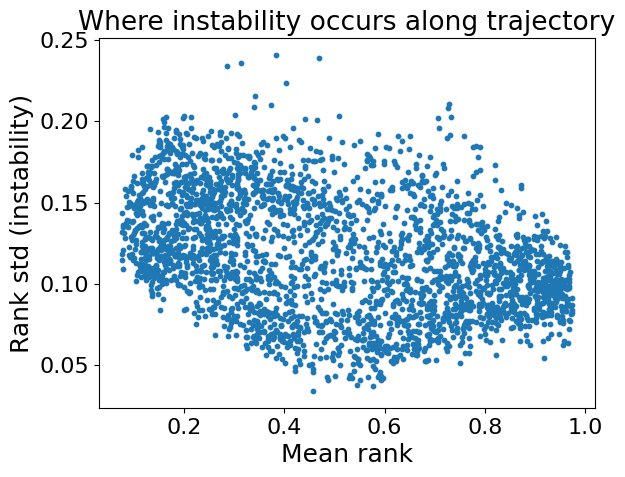

In [400]:
plt.scatter(summary_df95["mean_rank"], summary_df95["std_rank"], s=10)
plt.xlabel("Mean rank")
plt.ylabel("Rank std (instability)")
plt.title("Where instability occurs along trajectory")
plt.show()

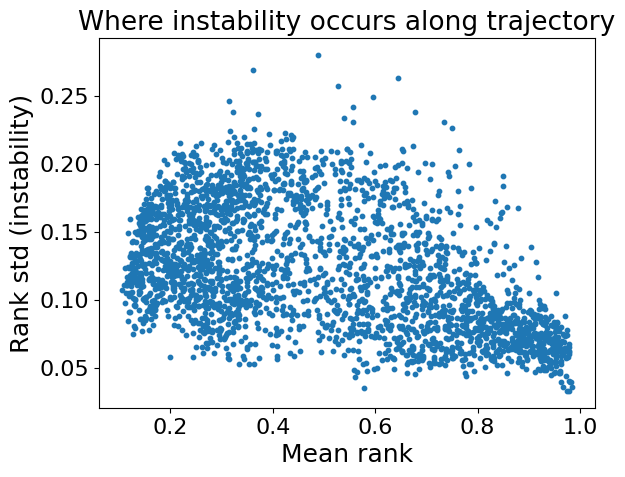

In [405]:
plt.scatter(summary_dfall["mean_rank"], summary_dfall["std_rank"], s=10)
plt.xlabel("Mean rank")
plt.ylabel("Rank std (instability)")
plt.title("Where instability occurs along trajectory")
plt.show()

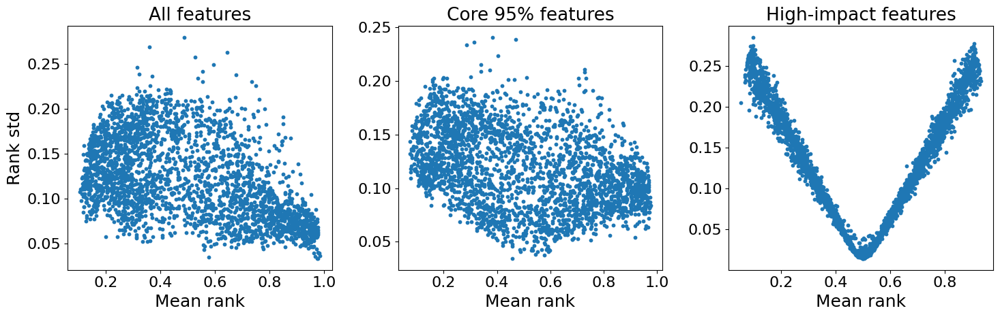

In [408]:
import matplotlib.pyplot as plt

# Create a figure with 3 subplots in one row
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot 1
axes[0].scatter(summary_dfall["mean_rank"], summary_dfall["std_rank"], s=10)
axes[0].set_xlabel("Mean rank")
axes[0].set_ylabel("Rank std")
axes[0].set_title("All features")

# Plot 2 (example: reuse or change data as needed)
axes[1].scatter(summary_df95["mean_rank"], summary_df95["std_rank"], s=10)
axes[1].set_xlabel("Mean rank")
axes[1].set_ylabel("")
axes[1].set_title("Core 95% features")

# Plot 3
axes[2].scatter(summary_df["mean_rank"], summary_df["std_rank"], s=10)
axes[2].set_xlabel("Mean rank")
axes[2].set_ylabel("")
axes[2].set_title("High-impact features")

# Adjust layout to prevent overlap
plt.tight_layout()

plt.savefig(path + f'/umap_bootstapping_{date}.png', bbox_inches='tight')
plt.savefig(path + f'/umap_bootstapping_{date}.svg', format='svg', bbox_inches='tight')

plt.show()

## correlation of ranks and AD related measurments

In [47]:
# correlations
col = ['SUMMARY_SUVR','ABETA', 'TAU', 'PTAU','PACC']
for i in col:
    corr1 = meta2_cleaned_noad[i].corr(meta2_cleaned_noad['rank_parabola_all'], 'spearman')
    corr2 = meta2_cleaned_noad[i].corr(meta2_cleaned_noad['rank_parabola_95'], 'spearman')
    corr3 = meta2_cleaned_noad[i].corr(meta2_cleaned_noad['rank_parabola_top'], 'spearman')
    
    print(f"correlation {i} with umap0_all: {corr1:.3f}")
    print(f"correlation {i} with umap0_95: {corr2:.3f}")
    print(f"correlation {i} with umap0_top: {corr3:.3f}")

correlation SUMMARY_SUVR with umap0_all: 0.749
correlation SUMMARY_SUVR with umap0_95: 0.796
correlation SUMMARY_SUVR with umap0_top: 0.755
correlation ABETA with umap0_all: -0.598
correlation ABETA with umap0_95: -0.594
correlation ABETA with umap0_top: -0.610
correlation TAU with umap0_all: 0.377
correlation TAU with umap0_95: 0.441
correlation TAU with umap0_top: 0.362
correlation PTAU with umap0_all: 0.460
correlation PTAU with umap0_95: 0.521
correlation PTAU with umap0_top: 0.454
correlation PACC with umap0_all: -0.252
correlation PACC with umap0_95: -0.224
correlation PACC with umap0_top: -0.241


In [90]:
def sliding_mean(x, y, window=50):
    """Compute sliding mean for y values sorted by x."""
    idx = np.argsort(x)
    x_sorted = np.array(x)[idx]
    y_sorted = np.array(y)[idx]

    # Rolling mean (simple window)
    y_smooth = np.convolve(y_sorted, np.ones(window)/window, mode='valid')

    # Make x_smooth same length as y_smooth
    offset = (len(y_sorted) - len(y_smooth)) // 2
    x_smooth = x_sorted[offset:offset + len(y_smooth)]
    
    return x_smooth, y_smooth


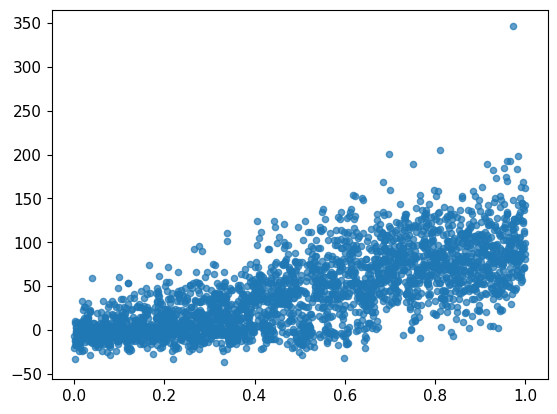

In [285]:
data_clean = meta2_cleaned_noad.dropna(subset=['CENTILOIDS'], inplace=False)
x = data_clean['rank_parabola_top']
y = data_clean['CENTILOIDS']    
plt.scatter(x, y, s=20, alpha=0.7)

correlation SUMMARY_SUVR with umap0_all: 0.749
correlation SUMMARY_SUVR with umap0_95: 0.796
correlation SUMMARY_SUVR with umap0_top: 0.755
0
SUMMARY_SUVR
correlation ABETA with umap0_all: -0.598
correlation ABETA with umap0_95: -0.594
correlation ABETA with umap0_top: -0.610
1
ABETA
correlation TAU with umap0_all: 0.377
correlation TAU with umap0_95: 0.441
correlation TAU with umap0_top: 0.362
2
TAU
correlation PTAU with umap0_all: 0.460
correlation PTAU with umap0_95: 0.521
correlation PTAU with umap0_top: 0.454
3
PTAU
correlation PACC with umap0_all: -0.252
correlation PACC with umap0_95: -0.224
correlation PACC with umap0_top: -0.241
4
PACC


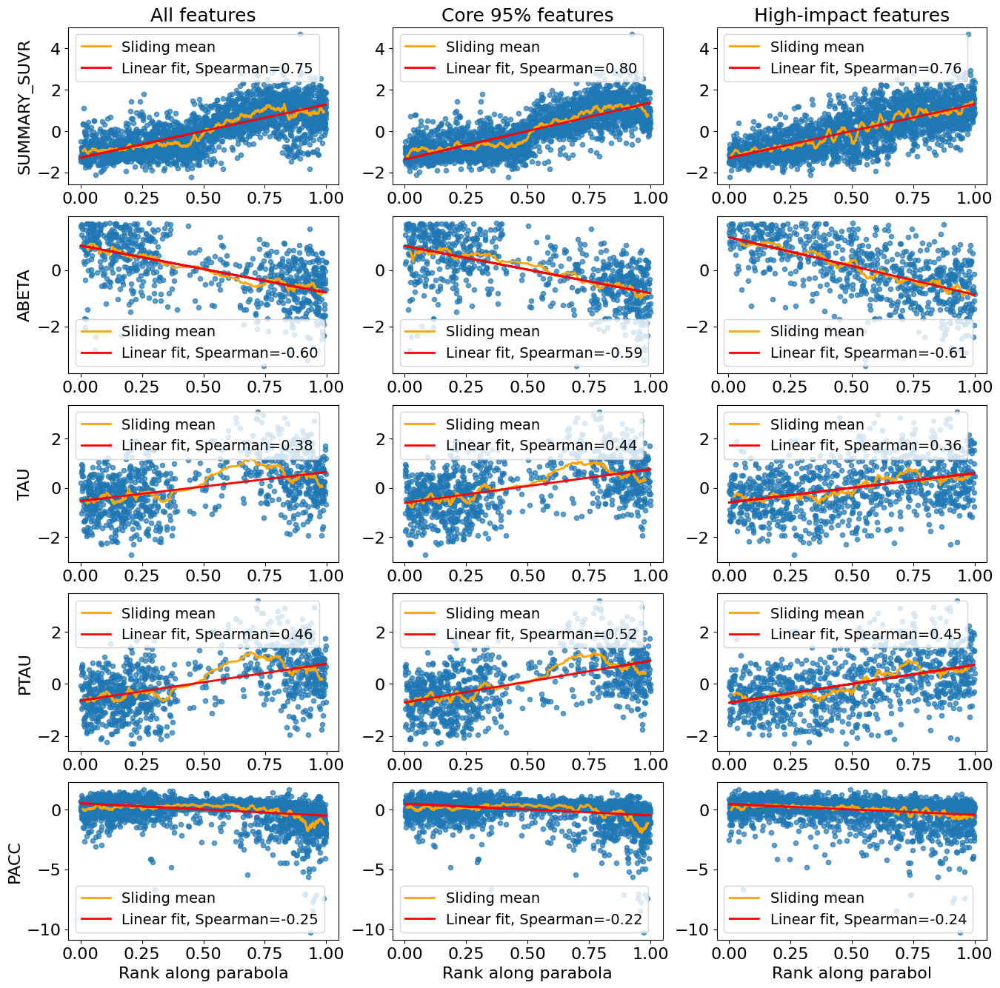

In [485]:
plt.rcParams.update({
    "font.size": 16,              # base font size
    "axes.titlesize": 18,         # title font
    "axes.labelsize": 16,         # x and y labels
    "xtick.labelsize": 16,        # x ticks
    "ytick.labelsize": 16,        # y ticks
    "legend.fontsize": 14        # legend
})

import matplotlib.pyplot as plt
import numpy as np

col = ['SUMMARY_SUVR','ABETA', 'TAU', 'PTAU','PACC']
fig, axes = plt.subplots(5, 3, figsize=(16, 16))  # 2 rows, 3 columns
#axes = axes.flatten()

for i,column in enumerate(col):
    data_clean = meta2_cleaned_noad.dropna(subset=[column], inplace=False)
    
    data_clean.reset_index(drop=True, inplace=True)
    
    # Spearman correlation
    corr1 = data_clean[column].corr(data_clean['rank_parabola_all'], 'spearman')
    corr2 = data_clean[column].corr(data_clean['rank_parabola_95'], 'spearman')
    corr3 = data_clean[column].corr(data_clean['rank_parabola_top'], 'spearman')
    
    print(f"correlation {column} with umap0_all: {corr1:.3f}")
    print(f"correlation {column} with umap0_95: {corr2:.3f}")
    print(f"correlation {column} with umap0_top: {corr3:.3f}")
    
    # ---- Plotting ----
    print(i)
    print(column)
    # Scatter plot
    x = data_clean['rank_parabola_all']
    y = data_clean[column]
    axes[i,0].scatter(x, y, s=20, alpha=0.7)
    
    # Add sliding mean line
    x_smooth, y_smooth = sliding_mean(x, y, window=50)
    axes[i,0].plot(x_smooth, y_smooth, color='orange', linewidth=2, label='Sliding mean')

    m, b = np.polyfit(x, y, 1)
    axes[i,0].plot(x, m*x + b, color='red', linewidth=2, label=f"Linear fit, Spearman={corr1:.2f}")
    if i == 4:
        axes[i,0].set_xlabel("Rank along parabola")
    if i == 0:
        axes[i,0].set_title("All features")
    
    axes[i,0].set_ylabel(column)
    #axes[i,0].title(f"{column} vs Parabola Rank")
    axes[i,0].legend()
    
    x = data_clean['rank_parabola_95']
    y = data_clean[column]
    axes[i,1].scatter(x, y, s=20, alpha=0.7)
    
    # Add sliding mean line
    x_smooth, y_smooth = sliding_mean(x, y, window=50)
    axes[i,1].plot(x_smooth, y_smooth, color='orange', linewidth=2, label='Sliding mean')

    m, b = np.polyfit(x, y, 1)
    axes[i,1].plot(x, m*x + b, color='red', linewidth=2, label=f"Linear fit, Spearman={corr2:.2f}")
    if i == 4:
        axes[i,1].set_xlabel("Rank along parabola")
    if i == 0:
        axes[i,1].set_title("Core 95% features")    
    #axes[i,1].set_ylabel(column)
    #axes[i,0].title(f"{column} vs Parabola Rank")
    axes[i,1].legend()
    
    x = data_clean['rank_parabola_top']
    y = data_clean[column]
    axes[i,2].scatter(x, y, s=20, alpha=0.7)
    
    # Add sliding mean line
    x_smooth, y_smooth = sliding_mean(x, y, window=50)
    axes[i,2].plot(x_smooth, y_smooth, color='orange', linewidth=2, label='Sliding mean')

    
    m, b = np.polyfit(x, y, 1)
    axes[i,2].plot(x, m*x + b, color='red', linewidth=2, label=f"Linear fit, Spearman={corr3:.2f}")
    if i == 4:
        axes[i,2].set_xlabel("Rank along parabol")
    if i == 0:
        axes[i,2].set_title("High-impact features") 
    #axes[i,2].set_ylabel(column)
    #axes[i,0].title(f"{column} vs Parabola Rank")
    axes[i,2].legend()
    
plt.savefig(path + f'/rank_features_correlation_{date}.png', bbox_inches='tight')
plt.savefig(path + f'/rank_features_correlation_{date}.svg', format='svg', bbox_inches='tight')

    
plt.show()
    


In [289]:
meta2_cleaned_noad[meta2_cleaned_noad.ABETA < 1700]

,Project,Phase,MRI_subID,Sex,Weight,Research.Group,VISCODE,VISCODE2,Study.Date,Age,...,PACC,umap_X_95,umap_Y_95,rank_parabola_95,umap_X_top,umap_Y_top,rank_parabola_top,umap_X_all,umap_Y_all,rank_parabola_all
6,ADNI,ADNI GO,094_S_2367,M,69.9,MCI,bl,bl,5/19/2011,74.9,...,-5.222800,10.110392,0.602072,2520,8.122295,10.416648,1537,9.381509,-2.763978,2758
9,ADNI,ADNI 2,052_S_0671,F,62.6,MCI,v31,m108,7/09/2015,70.2,...,-36.112200,11.554976,-1.505421,2663,4.221344,11.912228,1202,9.897534,-5.281675,2558
18,ADNI,ADNI 2,129_S_4073,M,89.6,MCI,v03,bl,7/08/2011,76.3,...,-5.611840,9.457361,-4.247551,1728,11.850544,2.353533,2420,5.407470,-7.553909,1287
22,ADNI,ADNI 2,094_S_4630,F,68.9,MCI,v21,m24,6/05/2014,67.7,...,-4.689420,6.305796,-4.395656,1038,-2.712976,3.887318,421,4.332057,-6.347640,877
25,ADNI,ADNI 2,011_S_4120,F,61.0,CN,v41,m48,7/21/2015,85.9,...,-6.505270,11.863989,-2.410273,2583,8.067786,11.853079,1466,9.848343,-6.362403,2414
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2790,ADNI,ADNI 2,027_S_4926,M,77.2,MCI,v03,bl,9/26/2012,62.6,...,-4.955830,3.932130,-1.197986,84,3.480239,10.800993,1106,4.362861,-1.670375,132
2791,ADNI,ADNI 2,098_S_4018,M,73.0,CN,v21,m24,4/25/2013,78.2,...,-0.654416,4.072959,-2.545455,329,-2.471649,-0.873251,6,3.121478,-2.850936,85
2794,ADNI,ADNI 2,027_S_4955,M,76.4,MCI,v03,bl,10/17/2012,71.5,...,-7.262810,10.609454,0.114886,2690,12.577848,2.598470,2422,9.524636,-3.246020,2759
2795,ADNI,ADNI 2,082_S_4224,M,79.1,CN,v21,m24,10/17/2013,77.3,...,-3.446270,4.556936,-0.874371,165,0.025660,7.255345,695,4.164630,-2.293577,130


# Linear regressions and forest plots for ranks of different features subsets

In [93]:
def forest_plot(coef, conf, ax=None, title=None, ylabel=None, color="black", ci_color="blue", y_positions=None):
    import matplotlib.pyplot as plt
    import pandas as pd

    if ax is None:
        fig, ax = plt.subplots(figsize=(6, 4))
        
    # Prepare data
    conf.columns = ["CI_lower", "CI_upper"]
    results = pd.concat([coef, conf], axis=1).reset_index()
    results.columns = ["Variable", "Coef", "CI_lower", "CI_upper"]

    # Remove intercept
    plot_data = results[results["Variable"] != "Intercept"].copy()

    # Use provided y positions or default to range
    if y_positions is None:
        y_positions = np.arange(len(plot_data))
    plot_data["y_pos"] = y_positions

    # Plot points with error bars
    ax.errorbar(
        x=plot_data["Coef"],
        y=plot_data["y_pos"],
        xerr=[plot_data["Coef"] - plot_data["CI_lower"], 
              plot_data["CI_upper"] - plot_data["Coef"]],
        fmt="o",
        color=color,
        ecolor=ci_color,
        elinewidth=2,
        capsize=4
    )

    # Add a vertical reference line at 0
    ax.axvline(x=0, color="red", linestyle="--")

    # Labeling
    ax.set_xlabel("Coefficient (95% CI)")
    if ylabel:
        ax.set_ylabel(ylabel)
    if title:
        ax.set_title(title)

    # Replace numeric y-ticks with variable names
    ax.set_yticks(plot_data["y_pos"])
    ax.set_yticklabels(plot_data["Variable"])

    return ax


In [331]:
'''def minmax_normalize_series(s):
    return (s - s.min()) / (s.max() - s.min())'''

In [362]:
meta2_cleaned_noad.SUMMARY_SUVR.min()

-2.2380386377894816

In [363]:
meta2_cleaned_noad.SUMMARY_SUVR.rank(method='min')

0        731.0
1        436.0
2       1890.0
3       1616.0
4         74.0
         ...  
2797     148.0
2798      74.0
2799     147.0
2800     900.0
2801    2420.0
Name: SUMMARY_SUVR, Length: 2802, dtype: float64

In [364]:
# Step 1: rank the values
meta2_cleaned_noad['suvr_rank'] = meta2_cleaned_noad['SUMMARY_SUVR'].rank(method='min')  # or 'average', 'dense', etc.

# Step 2: scale ranks to 0-1
meta2_cleaned_noad['suvr_rank'] = (meta2_cleaned_noad['suvr_rank'] - meta2_cleaned_noad['suvr_rank'].min()) / (meta2_cleaned_noad['suvr_rank'].max() - meta2_cleaned_noad['suvr_rank'].min())




0       0.260621
1       0.155302
2       0.674402
3       0.576580
4       0.026062
          ...   
2797    0.052481
2798    0.026062
2799    0.052124
2800    0.320957
2801    0.863620
Name: suvr_rank, Length: 2802, dtype: float64


In [368]:
meta2_cleaned_noad[meta2_cleaned_noad['suvr_rank']== 0]['SUMMARY_SUVR']

288   -2.238039
Name: SUMMARY_SUVR, dtype: float64

In [369]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

import numpy as np

variables = ['SUMMARY_SUVR','ABETA', 'TAU','PTAU',  'PACC','APOE4']
names = ['SUMMARY_SUVR','ABETA', 'TAU','PTAU',  'PACC', 'APOE4_1', 'APOE4_2']
parameters_suvr = pd.DataFrame()
parameters_all = pd.DataFrame()
parameters_95 = pd.DataFrame()
parameters_top = pd.DataFrame()

conf_suvr = pd.DataFrame()
conf_all = pd.DataFrame()
conf_95 = pd.DataFrame()
conf_top = pd.DataFrame()

for i,var in enumerate(variables):
    # Features (independent variables) and target (dependent variable)
    #X = meta2_cleaned_noad_bl[['clusters','Age','sex_binary']]   # predictors
    #y = meta2_cleaned_noad_bl[i]            # response
    #pt = PowerTransformer(method='yeo-johnson')
    data = meta2_cleaned_noad.dropna(subset=[var]).copy()
    data['APOE4'] = data['APOE4'].astype('category').cat.codes
    #data[i] = pt.fit_transform(meta2_cleaned_noad_bl[[i]].dropna())
    #if i != 'PACC':
    #    data[i] = np.log(data[i])
        
    '''mask = np.isfinite(X).all(axis=1) & np.isfinite(y)
    X_clean = X[mask]
    y_clean = y[mask]'''

    # Add constant for intercept
    #X_clean = sm.add_constant(X_clean)

    # Fit model
    #model = sm.OLS(y_clean, X_clean).fit()
    
    if var == 'APOE4':
        model = smf.mnlogit(var + " ~ suvr_rank + Age + C(Sex)", data=data).fit()
        parameters_suvr[[var+'_1',var+'_2']]=model.params[model.params.index.str.startswith("suvr_rank")]
        ci = pd.DataFrame(model.conf_int().loc[(slice(None), 'suvr_rank'), :].values)
    else:
        model = smf.ols(var+"~ suvr_rank + Age+C(Sex)", data=data).fit()
        parameters_suvr[var]=model.params[model.params.index.str.startswith("suvr_rank")]
        ci = model.conf_int().loc[model.params.index.str.startswith("suvr_rank")]
    conf_suvr = pd.concat([conf_suvr, ci])
    print(model.summary())
    
    if var == 'APOE4':
        model = smf.mnlogit(var + " ~ rank_parabola_all + Age + C(Sex)", data=data).fit()
        parameters_all[[var+'_1',var+'_2']]=model.params[model.params.index.str.startswith("rank_parabola")]
        ci = pd.DataFrame(model.conf_int().loc[(slice(None), 'rank_parabola_all'), :].values)
    else:
        model = smf.ols(var+"~ rank_parabola_all + Age+C(Sex)", data=data).fit()
        parameters_all[var]=model.params[model.params.index.str.startswith("rank_parabola")]
        ci = model.conf_int().loc[model.params.index.str.startswith("rank_parabola")]
    conf_all = pd.concat([conf_all, ci])
    print(model.summary())

    if var == 'APOE4':
        model = smf.mnlogit(var + " ~ rank_parabola_95 + Age + C(Sex)", data=data).fit()
        parameters_95[[var+'_1',var+'_2']]=model.params[model.params.index.str.startswith("rank_parabola")]
        ci = pd.DataFrame(model.conf_int().loc[(slice(None), 'rank_parabola_95'), :].values)
    else:
        model = smf.ols(var+"~ rank_parabola_95 + Age+C(Sex)", data=data).fit()
        parameters_95[var]=model.params[model.params.index.str.startswith("rank_parabola")]
        ci = model.conf_int().loc[model.params.index.str.startswith("rank_parabola")]
    
    conf_95 = pd.concat([conf_95, ci])
    print(model.summary())
    
    if var == 'APOE4':
        model = smf.mnlogit(var + " ~ rank_parabola_top + Age + C(Sex)", data=data).fit()
        parameters_top[[var+'_1',var+'_2']]=model.params[model.params.index.str.startswith("rank_parabola")]
        ci = pd.DataFrame(model.conf_int().loc[(slice(None), 'rank_parabola_top'), :].values)
    else:
        model = smf.ols(var+"~ rank_parabola_top + Age+C(Sex)", data=data).fit()
        parameters_top[var]=model.params[model.params.index.str.startswith("rank_parabola")]
        ci = model.conf_int().loc[model.params.index.str.startswith("rank_parabola")]
        
    conf_top = pd.concat([conf_top, ci])
    print(model.summary())
    

conf_suvr.index = names
parameters_suvr = parameters_suvr.T
    
conf_all.index = names
parameters_all = parameters_all.T

conf_95.index = names
parameters_95 = parameters_95.T

conf_top.index = names
parameters_top = parameters_top.T



                            OLS Regression Results                            
Dep. Variable:           SUMMARY_SUVR   R-squared:                       0.977
Model:                            OLS   Adj. R-squared:                  0.977
Method:                 Least Squares   F-statistic:                 4.023e+04
Date:                Fri, 21 Nov 2025   Prob (F-statistic):               0.00
Time:                        14:32:33   Log-Likelihood:                 1329.9
No. Observations:                2802   AIC:                            -2652.
Df Residuals:                    2798   BIC:                            -2628.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      -1.8456      0.033    -56.374      

                            OLS Regression Results                            
Dep. Variable:                  ABETA   R-squared:                       0.363
Model:                            OLS   Adj. R-squared:                  0.360
Method:                 Least Squares   F-statistic:                     143.3
Date:                Fri, 21 Nov 2025   Prob (F-statistic):           1.61e-73
Time:                        14:32:34   Log-Likelihood:                -907.30
No. Observations:                 760   AIC:                             1823.
Df Residuals:                     756   BIC:                             1841.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept             0.6506      0.31

                            OLS Regression Results                            
Dep. Variable:                   PTAU   R-squared:                       0.334
Model:                            OLS   Adj. R-squared:                  0.332
Method:                 Least Squares   F-statistic:                     159.7
Date:                Fri, 21 Nov 2025   Prob (F-statistic):           6.28e-84
Time:                        14:32:34   Log-Likelihood:                -1168.5
No. Observations:                 961   AIC:                             2345.
Df Residuals:                     957   BIC:                             2365.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      -1.7275      0.280     -6.180      

                            OLS Regression Results                            
Dep. Variable:                   PACC   R-squared:                       0.128
Model:                            OLS   Adj. R-squared:                  0.127
Method:                 Least Squares   F-statistic:                     136.7
Date:                Fri, 21 Nov 2025   Prob (F-statistic):           1.18e-82
Time:                        14:32:34   Log-Likelihood:                -3781.4
No. Observations:                2800   AIC:                             7571.
Df Residuals:                    2796   BIC:                             7595.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            2.8433      0.203  

                          MNLogit Regression Results                          
Dep. Variable:                  APOE4   No. Observations:                 1472
Model:                        MNLogit   Df Residuals:                     1464
Method:                           MLE   Df Model:                            6
Date:                Fri, 21 Nov 2025   Pseudo R-squ.:                  0.1261
Time:                        14:32:35   Log-Likelihood:                -1096.3
converged:                       True   LL-Null:                       -1254.5
Covariance Type:            nonrobust   LLR p-value:                 2.571e-65
         APOE4=1       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            2.9316      0.652      4.495      0.000       1.653       4.210
C(Sex)[T.M]          0.1724      0.124      1.394      0.163      -0.070       0.415
rank_parabola_95     2.5183 

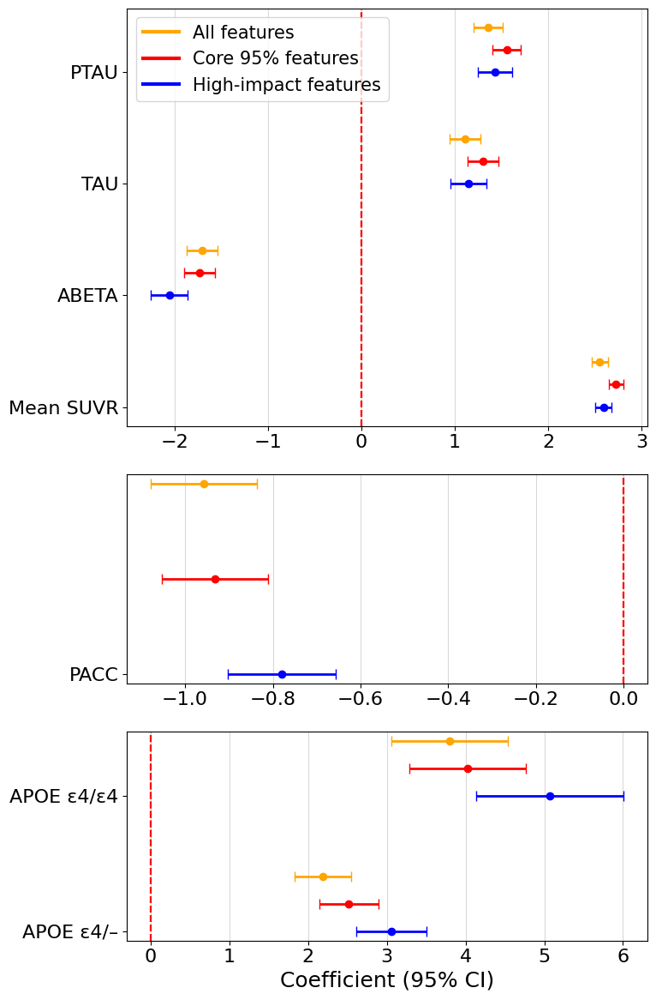

In [428]:
plt.rcParams.update({
    "font.size": 18,              # base font size
    "axes.titlesize": 19,         # title font
    "axes.labelsize": 18,         # x and y labels
    "xtick.labelsize": 16,        # x ticks
    "ytick.labelsize": 16,        # y ticks
    "legend.fontsize": 15        # legend
})


fig, axes = plt.subplots(3, 1, figsize=(8, 12),
    gridspec_kw={'height_ratios': [1, 0.5, 0.5]} )

# --- Row 1 'All features','Core 95% features', 'High-impact features'

#forest_plot(ax=axes[0], coef=parameters_suvr.iloc[:4, :], conf=conf_suvr.iloc[:4, :],
#            color='grey', ci_color='grey', y_positions=[0.4, 1.4, 2.4, 3.4])

forest_plot(ax=axes[0], coef=parameters_all.iloc[:4, :], conf=conf_all.iloc[:4, :],
             color='orange', ci_color='orange', y_positions=[0.2, 1.2, 2.2, 3.2])
forest_plot(ax=axes[0], coef=parameters_95.iloc[:4, :], conf=conf_95.iloc[:4, :],
             color='red', ci_color='red')
forest_plot(ax=axes[0], coef=parameters_top.iloc[:4, :], conf=conf_top.iloc[:4, :],
             color='blue', ci_color='blue', y_positions=[-0.2, 0.8, 1.8, 2.8])
axes[0].set_yticklabels(["Mean SUVR", "ABETA", "TAU","PTAU"])
axes[0].set_xlabel("")
axes[0].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)


# --- Row 2
#forest_plot(ax=axes[1], coef=parameters_suvr.iloc[4:5, :], conf=conf_suvr.iloc[4:5, :],
#             color='grey', ci_color='grey', y_positions=[0.4])

forest_plot(ax=axes[1], coef=parameters_all.iloc[4:5, :], conf=conf_all.iloc[4:5, :],
            color='orange', ci_color='orange', y_positions=[0.2])
forest_plot(ax=axes[1], coef=parameters_95.iloc[4:5, :], conf=conf_95.iloc[4:5, :],
            color='red', ci_color='red')
forest_plot(ax=axes[1], coef=parameters_top.iloc[4:5, :], conf=conf_top.iloc[4:5, :],
            color='blue', ci_color='blue', y_positions=[-0.2])
axes[1].set_xlabel("")
axes[1].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)

# --- Row 3
#forest_plot(ax=axes[2], coef=parameters_suvr.iloc[5:, :], conf=conf_suvr.iloc[5:, :],
#            color='grey', ci_color='grey', y_positions=[0.4, 1.4])

forest_plot(ax=axes[2], coef=parameters_all.iloc[5:, :], conf=conf_all.iloc[5:, :],
            color='orange', ci_color='orange', y_positions=[0.2, 1.2])
forest_plot(ax=axes[2], coef=parameters_95.iloc[5:, :], conf=conf_95.iloc[5:, :],
            color='red', ci_color='red')
forest_plot(ax=axes[2], coef=parameters_top.iloc[5:, :], conf=conf_top.iloc[5:, :],
            color='blue', ci_color='blue', y_positions=[-0.2, 0.8])
axes[2].set_yticklabels(["APOE ε4/–", "APOE ε4/ε4"])
axes[2].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)


# --- Add shared labels or legend
axes[0].legend(
    handles=[
        plt.Line2D([0], [0], color='orange', lw=3, label='All features'),
        plt.Line2D([0], [0], color='red', lw=3, label='Core 95% features'),
        plt.Line2D([0], [0], color='blue', lw=3, label='High-impact features'),
    ],
    loc='upper left', frameon=True
)

# Axis label for the bottom plot
axes[2].set_xlabel("Coefficient (95% CI)")

plt.tight_layout()
plt.savefig(path + f'/forest_plot_ranking_short_{date}.png', bbox_inches='tight')
plt.savefig(path + f'/forest_plot_ranking_short_{date}.svg', format='svg', bbox_inches='tight')

plt.show()


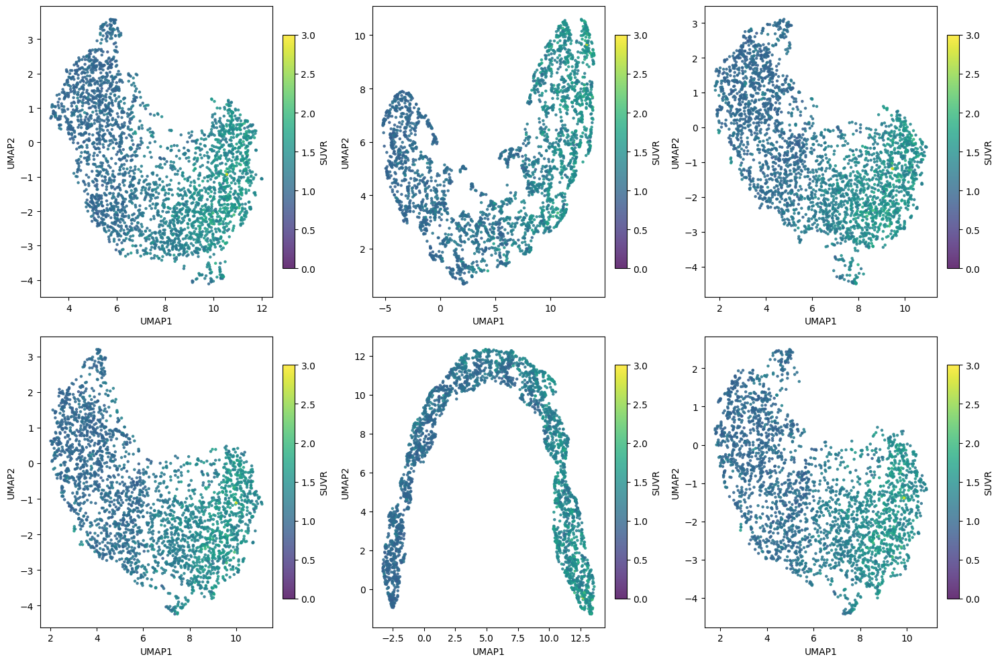

In [284]:
# Choose 6 continuous measures to visualize
features_to_plot = [meta2_cleaned["SUMMARY_SUVR"], meta2_cleaned["SUMMARY_SUVR"], meta2_cleaned["SUMMARY_SUVR"],
                    meta2_cleaned_noad["SUMMARY_SUVR"], meta2_cleaned_noad["SUMMARY_SUVR"], meta2_cleaned_noad["SUMMARY_SUVR"]]
umap = [X_umap_sel_all90,X_umap_sel_all,X_umap_sel_all_between,
        X_umap_sel_noad90,X_umap_sel_noad,X_umap_sel_noad_between]
fig, axes = plt.subplots(2, 3, figsize=(15, 10))  # 2 rows, 3 columns
axes = axes.flatten()

for i, feature in enumerate(features_to_plot):
    sc = axes[i].scatter(
        umap[i][:, 0],
        umap[i][:, 1],
        c=feature,
        cmap="viridis",
        s=5,
        alpha=0.8,
        vmin = 0, vmax = 3
    )
    #axes[i].set_title(feature)
    axes[i].set_xlabel("UMAP1")
    axes[i].set_ylabel("UMAP2")
    fig.colorbar(sc, ax=axes[i], fraction=0.046, pad=0.04, label='SUVR')

plt.tight_layout()

plt.savefig(path + f'/small_umaps_{date}.png', bbox_inches='tight')
#plt.savefig(path + f'/all_vs_noad_umaps_dendrogram{date}.svg', format='svg', bbox_inches='tight')


plt.show()


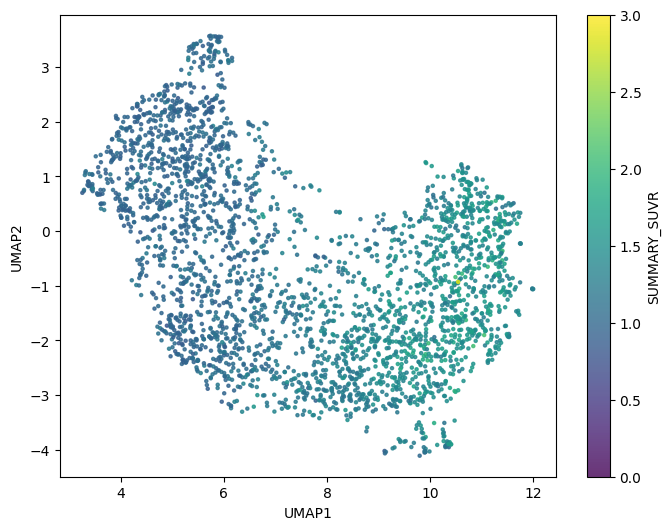

In [269]:
plt.figure(figsize=(8,6))
sc = plt.scatter(
    X_umap_sel_all90[:, 0],
    X_umap_sel_all90[:, 1],
    c=meta2_cleaned["SUMMARY_SUVR"],   # continuous measure
    cmap="viridis",           # or "plasma", "coolwarm", etc.
    s=5,
    alpha=0.8,
    vmin = 0,
    vmax = 3
)
plt.xlabel("UMAP1")
plt.ylabel("UMAP2")
plt.colorbar(sc, label="SUMMARY_SUVR")  # add color scale
plt.show()

## UMAP and clustering

In [329]:
'''# UMAP based on original features
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42,metric = 'correlation')
#X_umap = reducer.fit_transform(pet_combined_df_cleaned.T)
X_umap_all = reducer.fit_transform(X_reduced_all)

# UMAP based on original features
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42,metric = 'correlation')
#X_umap = reducer.fit_transform(pet_combined_df_cleaned.T)
X_umap_noad = reducer.fit_transform(X_reduced_noad)
'''

In [64]:
X_reduced_noad

,2905,3014,3033,3161,3225,3270,3277,7022,7086,7693
I1323673,0.607698,0.279434,0.803997,1.000060,1.056210,0.142450,0.447446,0.985387,1.079472,0.654254
I393755,0.510558,0.367180,0.775495,1.038580,1.147434,0.202229,0.466060,2.359696,2.425050,0.859235
I413047,0.936386,0.254062,1.196756,1.492417,1.612246,0.008646,0.562950,-0.327641,-0.543491,1.269609
I1411194,1.064757,0.261881,1.362124,1.621650,1.690316,0.036825,0.562786,0.636682,0.838313,0.861806
I1411241,0.788501,0.347665,1.022830,1.218097,1.270907,0.228825,0.405691,2.082536,2.328448,0.600983
...,...,...,...,...,...,...,...,...,...,...
I389844,0.806513,0.287551,1.028913,1.231692,1.262547,0.122837,0.375298,1.107413,1.186789,0.595420
I1411212,0.612157,0.281128,0.920041,1.214706,1.308513,0.094716,0.508404,2.786186,2.750553,0.546600
I468830,0.546932,0.316054,0.853513,1.112827,1.189536,0.137084,0.424559,2.137089,2.165479,0.549822
I445087,0.599025,0.359494,0.852048,1.109824,1.182739,0.181884,0.447228,-0.148498,-0.090141,0.850968


In [103]:
pet_combined_df_cleaned_noad.T.shape

(2802, 11648)

In [104]:
X_reduced_noad95.shape

(2802, 3098)

In [48]:
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist, squareform

# Assume X_reduced is your data (samples × features)

corr_all = np.corrcoef(pet_combined_df_cleaned_noad.T)  # correlation between features (columns)
corr_dist_all = 1 - corr_all
# Step 2: Convert to condensed distance matrix form (required by linkage)
condensed_corr_dist_all = squareform(corr_dist_all, checks=False)
# Step 3: Compute linkage on correlation distance matrix
linkage_data_all = linkage(condensed_corr_dist_all, method='ward')



# Step 1: Compute the correlation distance matrix
# Correlation distance = 1 - correlation coefficient
corr_95 = np.corrcoef(X_reduced_noad95)  # correlation between features (columns)
corr_dist_95 = 1 - corr_95
# Step 2: Convert to condensed distance matrix form (required by linkage)
condensed_corr_dist_95 = squareform(corr_dist_95, checks=False)
# Step 3: Compute linkage on correlation distance matrix
linkage_data_95 = linkage(condensed_corr_dist_95, method='ward')


corr_noad_top = np.corrcoef(X_reduced_noad)  # correlation between features (columns)
corr_dist_noad_top = 1 - corr_noad_top
condensed_corr_dist_noad_top = squareform(corr_dist_noad_top, checks=False)
linkage_data_noad_top = linkage(condensed_corr_dist_noad_top, method='ward')

# Step 4: Plot dendrogram
'''plt.figure(figsize=(10, 6))
dendrogram(linkage_data, labels=X_reduced.indexes if hasattr(X_reduced, 'indexes') else None)
plt.title("Hierarchical Clustering Dendrogram (Correlation Distance)")
plt.xlabel("Features")
plt.ylabel("Distance")
plt.show()'''

'plt.figure(figsize=(10, 6))\ndendrogram(linkage_data, labels=X_reduced.indexes if hasattr(X_reduced, \'indexes\') else None)\nplt.title("Hierarchical Clustering Dendrogram (Correlation Distance)")\nplt.xlabel("Features")\nplt.ylabel("Distance")\nplt.show()'

In [80]:
from sklearn.metrics import classification_report
from sklearn import metrics
clusters = fcluster(linkage_data_all, t=2, criterion='maxclust')
am_status = meta2_cleaned_noad['AMYLOID_STATUS'].copy()
am_status[am_status==1] = 2
am_status[am_status==0] = 1
# 1- amyloid negative, 2 - amyloid positive
confusion_matrix = metrics.confusion_matrix(am_status, clusters)
Accuracy = metrics.accuracy_score(am_status, clusters)
print('Accuracy:' + str(Accuracy))
Sensitivity_recall = metrics.recall_score(am_status, clusters, pos_label=2)
print('Sensitivity:' + str(Sensitivity_recall))
Specificity = metrics.recall_score(am_status, clusters, pos_label=1)
print('Specificity:' + str(Specificity))
print(classification_report(am_status, clusters, target_names=['1', '2']))

Accuracy:0.801570306923626
Sensitivity:0.9095154699357851
Specificity:0.6317722681359045
              precision    recall  f1-score   support

           1       0.82      0.63      0.71      1089
           2       0.80      0.91      0.85      1713

    accuracy                           0.80      2802
   macro avg       0.81      0.77      0.78      2802
weighted avg       0.80      0.80      0.80      2802



In [81]:
clusters = fcluster(linkage_data_all, t=3, criterion='maxclust')
data = pd.DataFrame()
data['am_status'] = meta2_cleaned_noad['AMYLOID_STATUS'].copy()
data.am_status[data.am_status==1] = 2
data.am_status[data.am_status==0] = 1
data['clusters'] = clusters
data = data[(data.clusters == 1)|(data.clusters == 2) ]
# 1- amyloid negative, 2 - amyloid positive
confusion_matrix = metrics.confusion_matrix(data.am_status, data.clusters)
Accuracy = metrics.accuracy_score(data.am_status, data.clusters)
print('Accuracy:' + str(Accuracy))
Sensitivity_recall = metrics.recall_score(data.am_status, data.clusters)
print('Sensitivity:' + str(Sensitivity_recall))
Specificity = metrics.recall_score(data.am_status, data.clusters, pos_label=2)
print('Specificity:' + str(Specificity))
print(classification_report(data.am_status, data.clusters, target_names=['1', '2']))

Accuracy:0.8657178217821783
Sensitivity:0.9173333333333333
Specificity:0.8210161662817552
              precision    recall  f1-score   support

           1       0.82      0.92      0.86       750
           2       0.92      0.82      0.87       866

    accuracy                           0.87      1616
   macro avg       0.87      0.87      0.87      1616
weighted avg       0.87      0.87      0.87      1616



In [88]:
linkage_data_95

array([[1.87000000e+02, 2.16500000e+03, 1.61773660e-02, 2.00000000e+00],
       [3.78000000e+02, 2.61600000e+03, 2.00461509e-02, 2.00000000e+00],
       [9.03000000e+02, 1.71800000e+03, 2.04510617e-02, 2.00000000e+00],
       ...,
       [5.59600000e+03, 5.59900000e+03, 7.00101963e+00, 1.23500000e+03],
       [5.59700000e+03, 5.60000000e+03, 1.07566565e+01, 1.98500000e+03],
       [5.59800000e+03, 5.60100000e+03, 1.27417304e+01, 2.80200000e+03]])

In [83]:
X_reduced_noad95.shape

(2802, 3098)

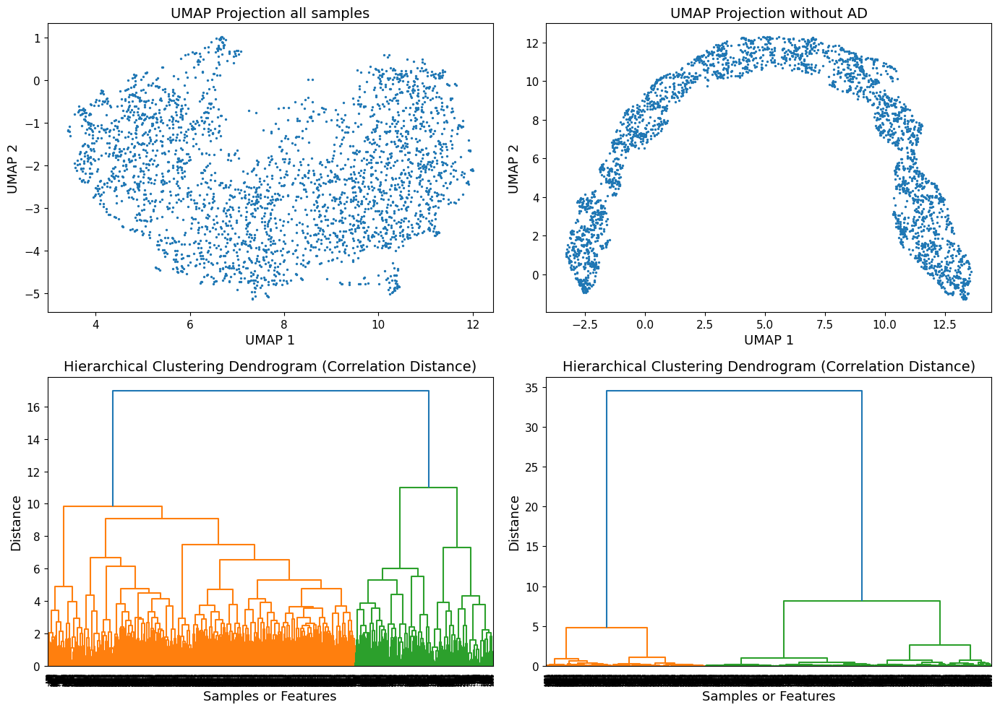

In [79]:
from scipy.cluster.hierarchy import dendrogram

# Create a 2x2 subplot grid
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# --- Plot 1: UMAP without clusters ---
axs[0, 0].scatter(X_umap_sel_noad95[:, 0], X_umap_sel_noad95[:, 1], s=2)
axs[0, 0].set_title('UMAP Projection all samples')
axs[0, 0].set_xlabel('UMAP 1')
axs[0, 0].set_ylabel('UMAP 2')

# --- Plot 2: UMAP with cluster coloring ---
scatter = axs[0, 1].scatter(X_umap_sel_noad[:, 0], X_umap_sel_noad[:, 1], s=2)
axs[0, 1].set_title('UMAP Projection without AD')
axs[0, 1].set_xlabel('UMAP 1')
axs[0, 1].set_ylabel('UMAP 2')

# --- Plot 3: Dendrogram (Ward / Euclidean) ---
dendrogram(linkage_data_95, ax=axs[1, 0], labels=X_umap_sel_noad95.index if hasattr(X_umap_sel_noad95, 'index') else None)
axs[1, 0].set_title("Hierarchical Clustering Dendrogram (Correlation Distance)")
axs[1, 0].set_xlabel("Samples or Features")
axs[1, 0].set_ylabel("Distance")

# --- Plot 4: Dendrogram (Correlation Distance) ---
# Assuming `linkage_corr` is your correlation-based linkage matrix
# If you haven't computed it yet, see the earlier message for how to do it
dendrogram(linkage_data_noad_top, ax=axs[1, 1], labels=X_umap_sel_noad.index if hasattr(X_umap_sel_noad, 'index') else None)
axs[1, 1].set_title("Hierarchical Clustering Dendrogram (Correlation Distance)")
axs[1, 1].set_xlabel("Samples or Features")
axs[1, 1].set_ylabel("Distance")

# Adjust layout
plt.tight_layout()


#plt.savefig(path + f'/95_vs_top_umaps_dendrogram{date}.png', bbox_inches='tight')
#plt.savefig(path + f'/95_vs_top_umaps_dendrogram{date}.svg', format='svg', bbox_inches='tight')

plt.show()

## subclusters

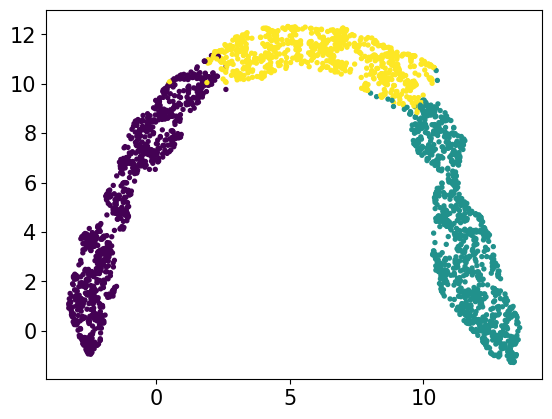

In [82]:
clusters = fcluster(linkage_data_noad_top, t=3, criterion='maxclust')
plt.scatter(X_umap_sel_noad[:, 0], X_umap_sel_noad[:, 1], c=clusters, s=8)

In [84]:
X_reduced_noad95

,3225,3033,3270,3161,3014,7022,7693,3277,7086,2905,...,3868,9009,8844,7755,4462,2273,8656,4115,3671,6509
I1323673,1.056210,0.803997,0.142450,1.000060,0.279434,0.985387,0.654254,0.447446,1.079472,0.607698,...,-0.603256,0.096650,0.196590,-0.390897,-0.086235,-0.375532,-0.420708,-0.333360,-0.248022,-0.356579
I393755,1.147434,0.775495,0.202229,1.038580,0.367180,2.359696,0.859235,0.466060,2.425050,0.510558,...,-0.894636,-0.756000,-0.432383,-0.667273,-0.784423,0.173916,0.897056,0.246734,0.748647,0.509650
I413047,1.612246,1.196756,0.008646,1.492417,0.254062,-0.327641,1.269609,0.562950,-0.543491,0.936386,...,0.208248,0.365287,-0.110337,0.038121,-0.751594,0.707655,1.763136,-0.522147,1.365972,-0.633612
I1411194,1.690316,1.362124,0.036825,1.621650,0.261881,0.636682,0.861806,0.562786,0.838313,1.064757,...,0.049683,-0.154179,-0.070059,0.912255,-0.100088,-0.576369,-0.729190,-0.194871,0.481994,-1.560082
I1411241,1.270907,1.022830,0.228825,1.218097,0.347665,2.082536,0.600983,0.405691,2.328448,0.788501,...,-1.001863,0.048294,-0.134051,-0.389545,-0.314773,-0.083885,0.614214,-0.129694,0.241845,-0.583932
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
I389844,1.262547,1.028913,0.122837,1.231692,0.287551,1.107413,0.595420,0.375298,1.186789,0.806513,...,-0.105005,-0.004955,-0.046714,0.321927,-0.689807,-0.259332,-0.074747,-0.267824,0.210045,-0.796591
I1411212,1.308513,0.920041,0.094716,1.214706,0.281128,2.786186,0.546600,0.508404,2.750553,0.612157,...,0.210214,-0.297687,-0.131404,-1.104468,-0.113655,0.028946,0.580812,0.096745,0.218610,0.485759
I468830,1.189536,0.853513,0.137084,1.112827,0.316054,2.137089,0.549822,0.424559,2.165479,0.546932,...,0.274238,-0.382013,0.696370,0.284355,-1.070440,0.163333,-0.636894,0.059323,0.170109,0.806803
I445087,1.182739,0.852048,0.181884,1.109824,0.359494,-0.148498,0.850968,0.447228,-0.090141,0.599025,...,-0.771644,-0.009622,-0.487030,-0.061479,0.568580,-0.145883,-0.122193,0.494892,-0.668613,0.395692


In [90]:
linkage_data_95.shape

(2801, 4)

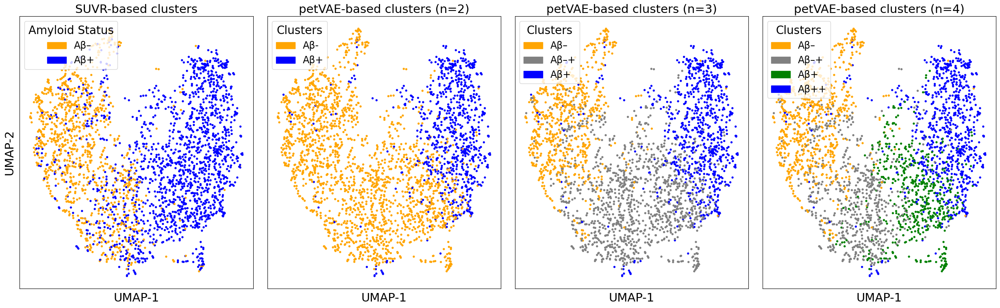

In [421]:
plt.rcParams.update({
    "font.size": 20,              # base font size
    "axes.titlesize": 21,         # title font
    "axes.labelsize": 21,         # x and y labels
    "xtick.labelsize": 18,        # x ticks
    "ytick.labelsize": 18,        # y ticks
    "legend.fontsize": 17        # legend
})



X_umap = X_umap_sel_noad95
linkage_data = linkage_data_95
# Define clustering
clusters = fcluster(linkage_data, t=2, criterion='maxclust')
replace_map = {1: 2, 2: 1} # be carefull here, after rerun the clustering code
clusters= np.array([replace_map[label] for label in clusters])

clusters3 = fcluster(linkage_data, t=3, criterion='maxclust')
replace_map = {1: 3, 2: 1, 3: 2} # be carefull here, after rerun the clustering code
clusters3= np.array([replace_map[label] for label in clusters3])

clusters4 = fcluster(linkage_data, t=4, criterion='maxclust')
replace_map = {1: 4, 2: 1, 3: 2, 4:3} # be carefull here, after rerun the clustering code
clusters4= np.array([replace_map[label] for label in clusters4])


# Manual color assignment: Cluster 1 = red (Amyloid Positive), Cluster 2 = gray (Amyloid Negative)
cluster_colors = {1: 'orange', 2: 'blue'}
cluster_color_list = [cluster_colors[c] for c in clusters]

cluster_colors3 = {1: 'orange', 2: 'grey',3:'blue'}
cluster_color_list3 = [cluster_colors3[c] for c in clusters3]

cluster_colors4 = {1: 'orange', 2: 'grey',3:'green', 4: 'blue'} 
cluster_color_list4 = [cluster_colors4[c] for c in clusters4]

# Encode Amyloid status
lab1 = LabelEncoder().fit_transform(meta2_cleaned_noad['AMYLOID_STATUS'].astype(str))
# Manual mapping: 1 = Amyloid Positive (blue), 0 = Negative (orange)
amyloid_colors = ['orange' if l == 0 else 'blue' for l in lab1]

# Create figure with subplots
fig, axes = plt.subplots(1, 4, figsize=(25, 8))

# --- Subplot 1: Amyloid Status ---
axes[0].scatter(X_umap[:, 0], X_umap[:, 1], c=amyloid_colors, s=8)
handles_amyloid = [Patch(color='orange', label="Aβ–"),
                   Patch(color='blue', label="Aβ+")]
axes[0].legend(handles=handles_amyloid, title="Amyloid Status", loc='upper left')
axes[0].set_title("SUVR-based clusters")
axes[0].set_xlabel("UMAP-1")
axes[0].set_ylabel("UMAP-2")

# --- Subplot 2: Clustering ---
axes[1].scatter(X_umap[:, 0], X_umap[:, 1], c=cluster_color_list, s=8)
handles_cluster = [Patch(color='orange', label="Aβ-"),
                   Patch(color='blue', label="Aβ+")]
axes[1].legend(handles=handles_cluster, title='Clusters', loc='upper left')
axes[1].set_title("petVAE-based clusters (n=2)")
axes[1].set_xlabel("UMAP-1")
#axes[1].set_ylabel("UMAP-2", fontsize=18)

# --- Subplot 3: Clustering ---
axes[2].scatter(X_umap[:, 0], X_umap[:, 1], c=cluster_color_list3, s=8)
handles_cluster = [Patch(color='orange', label="Aβ–"),
                   Patch(color='grey', label="Aβ–+"),
                  Patch(color='blue', label="Aβ+")]
axes[2].legend(handles=handles_cluster, title='Clusters', loc='upper left')
axes[2].set_title("petVAE-based clusters (n=3)")
axes[2].set_xlabel("UMAP-1")
#axes[2].set_ylabel("UMAP-2", fontsize=18)

# --- Subplot 4: Clustering ---
axes[3].scatter(X_umap[:, 0], X_umap[:, 1], c=cluster_color_list4, s=8)
handles_cluster = [Patch(color='orange', label="Aβ–"),
                   Patch(color='grey', label="Aβ–+"),
                  Patch(color='green', label="Aβ+"),
                   Patch(color='blue', label="Aβ++")
                  ]
axes[3].legend(handles=handles_cluster, title='Clusters', loc='upper left')
axes[3].set_title("petVAE-based clusters (n=4)")
axes[3].set_xlabel("UMAP-1")
#axes[2].set_ylabel("UMAP-2", fontsize=18)

for i in range(4):
    axes[i].set_xticklabels([])
    axes[i].set_yticklabels([])
    axes[i].set_xticks([])
    axes[i].set_yticks([])
    
plt.tight_layout()
#plt.savefig(path + f'/sel_features_95_umap_cluster_vs_amyloid_{date}.png', bbox_inches='tight')
#plt.savefig(path + f'/sel_features_95_umap_cluster_vs_amyloid_{date}.svg', format='svg', bbox_inches='tight')


plt.show()


In [100]:
clusters4

array([3, 2, 2, ..., 2, 2, 1], dtype=int32)

In [102]:
clusters4

array([2, 1, 1, ..., 1, 1, 4])

In [47]:
data

,am_status,clusters
0,1.0,1
1,1.0,1
2,2.0,2
4,1.0,1
5,2.0,2
...,...,...
2947,1.0,1
2948,1.0,1
2949,2.0,2
2950,1.0,2


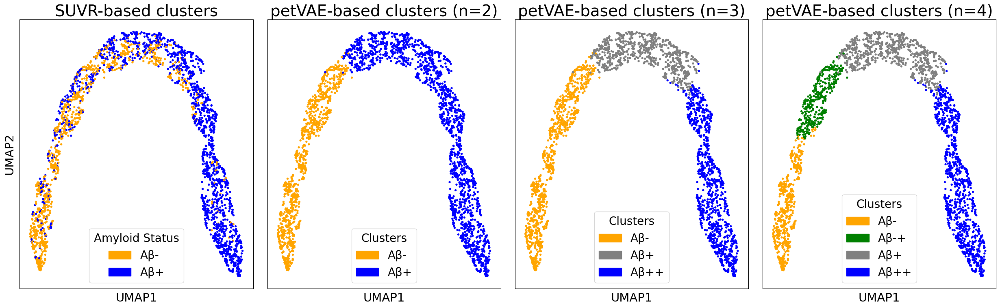

In [258]:
plt.rcParams.update({
    "font.size": 20,              # base font size
    "axes.titlesize": 28,         # title font
    "axes.labelsize": 21,         # x and y labels
    "xtick.labelsize": 21,        # x ticks
    "ytick.labelsize": 21,        # y ticks
    "legend.fontsize": 20        # legend
})


import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from sklearn.preprocessing import LabelEncoder
from scipy.cluster.hierarchy import fcluster
import numpy as np

X_umap = X_umap_sel_noad
linkage_data = linkage_data_noad_top
# Define clustering
clusters = fcluster(linkage_data, t=2, criterion='maxclust')
clusters3 = fcluster(linkage_data, t=3, criterion='maxclust')
replace_map = {1: 1, 2: 3, 3: 2} # be carefull here, after rerun the clustering code
clusters3= np.array([replace_map[label] for label in clusters3])

clusters4 = fcluster(linkage_data, t=4, criterion='maxclust')
replace_map = {1: 2, 2: 1, 3: 4, 4:3} # be carefull here, after rerun the clustering code
clusters4= np.array([replace_map[label] for label in clusters4])


# Manual color assignment: Cluster 1 = red (Amyloid Positive), Cluster 2 = gray (Amyloid Negative)
cluster_colors = {1: 'orange', 2: 'blue'}
cluster_color_list = [cluster_colors[c] for c in clusters]

cluster_colors3 = {1: 'orange', 2: 'grey',3:'blue'}
cluster_color_list3 = [cluster_colors3[c] for c in clusters3]

cluster_colors4 = {1: 'orange', 2: 'green',3:'grey', 4: 'blue'} 
cluster_color_list4 = [cluster_colors4[c] for c in clusters4]

# Encode Amyloid status
lab1 = LabelEncoder().fit_transform(meta2_cleaned_noad['AMYLOID_STATUS'].astype(str))
# Manual mapping: 1 = Amyloid Positive (blue), 0 = Negative (orange)
amyloid_colors = ['orange' if l == 0 else 'blue' for l in lab1]

# Create figure with subplots
fig, axes = plt.subplots(1, 4, figsize=(25, 8))

# --- Subplot 1: Amyloid Status ---
axes[0].scatter(X_umap[:, 0], X_umap[:, 1], c=amyloid_colors, s=8)
handles_amyloid = [Patch(color='orange', label="Aβ-"),
                   Patch(color='blue', label="Aβ+")]
axes[0].legend(handles=handles_amyloid, title="Amyloid Status", loc='lower center')
axes[0].set_title("SUVR-based clusters")
axes[0].set_xlabel("UMAP1")
axes[0].set_ylabel("UMAP2")

# --- Subplot 2: Clustering ---
axes[1].scatter(X_umap[:, 0], X_umap[:, 1], c=cluster_color_list, s=8)
handles_cluster = [Patch(color='orange', label="Aβ-"),
                   Patch(color='blue', label="Aβ+")]
axes[1].legend(handles=handles_cluster, title='Clusters', loc='lower center')
axes[1].set_title("petVAE-based clusters (n=2)")
axes[1].set_xlabel("UMAP1")
#axes[1].set_ylabel("UMAP-2", fontsize=18)

# --- Subplot 3: Clustering ---
axes[2].scatter(X_umap[:, 0], X_umap[:, 1], c=cluster_color_list3, s=8)
handles_cluster = [Patch(color='orange', label="Aβ-"),
                   Patch(color='grey', label="Aβ+"),
                  Patch(color='blue', label="Aβ++")]
axes[2].legend(handles=handles_cluster, title='Clusters', loc='lower center')
axes[2].set_title("petVAE-based clusters (n=3)")
axes[2].set_xlabel("UMAP1")
#axes[2].set_ylabel("UMAP-2", fontsize=18)

# --- Subplot 4: Clustering ---
axes[3].scatter(X_umap[:, 0], X_umap[:, 1], c=cluster_color_list4, s=8)
handles_cluster = [Patch(color='orange', label="Aβ-"),
                   Patch(color='green', label="Aβ-+"),
                  Patch(color='grey', label="Aβ+"),
                  Patch(color='blue', label="Aβ++")]
axes[3].legend(handles=handles_cluster, title='Clusters', loc='lower center')
axes[3].set_title("petVAE-based clusters (n=4)")
axes[3].set_xlabel("UMAP1")
#axes[2].set_ylabel("UMAP-2", fontsize=18)

for i in range(4):
    axes[i].set_xticklabels([])
    axes[i].set_yticklabels([])
    axes[i].set_xticks([])
    axes[i].set_yticks([])

plt.tight_layout()
#plt.savefig(path + f'/sel_features_top_umap_cluster_vs_amyloid_{date}.png', bbox_inches='tight')
#plt.savefig(path + f'/sel_features_top_umap_cluster_vs_amyloid_{date}.svg', format='svg', bbox_inches='tight')


plt.show()


In [259]:
#########IMPORTANT, REORDERING CLUSTERS TO MORE INTUITIVE ORDER ######
clusters4 = fcluster(linkage_data_95, t=4, criterion='maxclust')
replace_map = {1: 4, 2: 1, 3: 2, 4:3} # be carefull here, after rerun the clustering code
clusters4= np.array([replace_map[label] for label in clusters4])

meta2_cleaned_noad['clusters95_4'] = clusters4

clusters4 = fcluster(linkage_data_noad_top, t=4, criterion='maxclust')
replace_map = {1: 2, 2: 1, 3: 4, 4:3} # be carefull here, after rerun the clustering code
clusters4= np.array([replace_map[label] for label in clusters4])

meta2_cleaned_noad['clusters_top_4'] = clusters4



clusters3 = fcluster(linkage_data_noad_top, t=3, criterion='maxclust')
replace_map = {1: 1, 2: 3, 3: 2} # be carefull here, after rerun the clustering code
clusters3= np.array([replace_map[label] for label in clusters3])

meta2_cleaned_noad['clusters_top_3'] = clusters3


In [84]:
meta2_cleaned_noad['clusters_top_3'].value_counts()

3    1070
1    1001
2     731
Name: clusters_top_3, dtype: int64

In [85]:
pd.DataFrame(clusters3).value_counts()

3    1070
1    1001
2     731
dtype: int64

In [86]:
pd.DataFrame(clusters4).value_counts()

4    1070
3     731
1     582
2     419
dtype: int64

In [114]:
####ACCURACY####

In [115]:
clusters = fcluster(linkage_data_95, t=2, criterion='maxclust')
replace_map = {1: 2, 2: 1} # be carefull here, after rerun the clustering code
clusters= np.array([replace_map[label] for label in clusters])

data = pd.DataFrame()
data['am_status'] = meta2_cleaned_noad['AMYLOID_STATUS'].copy()
data.am_status[data.am_status==1] = 2
data.am_status[data.am_status==0] = 1
data['clusters'] = clusters
data = data[(data.clusters == 1)|(data.clusters == 2) ]
# 1- amyloid negative, 2 - amyloid positive
confusion_matrix = metrics.confusion_matrix(data.am_status, data.clusters)
Accuracy = metrics.accuracy_score(data.am_status, data.clusters)
# Extract TN, FP, FN, TP
tn, fp, fn, tp = confusion_matrix.ravel()

# Compute sensitivity (recall, TPR)
sensitivity = tp / (tp + fn)

# Compute specificity (TNR)
specificity = tn / (tn + fp)

print(f"Accuracy: {Accuracy:.3f}")
print(f"Sensitivity (Recall / TPR): {sensitivity:.3f}")
print(f"Specificity (TNR): {specificity:.3f}")

Accuracy: 0.671
Sensitivity (Recall / TPR): 0.469
Specificity (TNR): 0.988


In [88]:
clusters = fcluster(linkage_data_95, t=3, criterion='maxclust')
replace_map = {1: 3, 2: 1, 3: 2}  # be carefull here, after rerun the clustering code
clusters= np.array([replace_map[label] for label in clusters])

data = pd.DataFrame()
data['am_status'] = meta2_cleaned_noad['AMYLOID_STATUS'].copy()
data.am_status[data.am_status==1] = 3
data.am_status[data.am_status==0] = 1
data['clusters'] = clusters
data = data[(data.clusters == 1)|(data.clusters == 3) ]
# 1- amyloid negative, 2 - amyloid positive
confusion_matrix = metrics.confusion_matrix(data.am_status, data.clusters)
Accuracy = metrics.accuracy_score(data.am_status, data.clusters)
# Extract TN, FP, FN, TP
tn, fp, fn, tp = confusion_matrix.ravel()

# Compute sensitivity (recall, TPR)
sensitivity = tp / (tp + fn)

# Compute specificity (TNR)
specificity = tn / (tn + fp)

print(f"Accuracy: {Accuracy:.3f}")
print(f"Sensitivity (Recall / TPR): {sensitivity:.3f}")
print(f"Specificity (TNR): {specificity:.3f}")


Accuracy: 0.912
Sensitivity (Recall / TPR): 0.865
Specificity (TNR): 0.980


In [89]:
ad = meta2_cleaned[meta2_cleaned['Research.Group'] == 'AD']
pet_combined_df_cleaned_noad = pet_combined_df_cleaned.loc[:, ~pet_combined_df_cleaned.columns.isin(ad['Image.Data.ID'])]
df = meta2_cleaned.drop(index=ad.index)
df.reset_index(drop=True, inplace = True)
df.loc[df.ABETA == 1700, 'ABETA'] = np.nan

#df = meta2_cleaned_noad.copy()
df['clusters'] = clusters

# Compute number of valid samples for each variable
n_suvr = df['SUMMARY_SUVR'].notna().sum()
n_female = df.Sex.value_counts().F
p_female = round(df.Sex.value_counts().F*100/df.shape[0],2)
n_age = df['Age'].notna().sum()
n_apoe = df['APOE4'].notna().sum()
n_amyloid_status = df['AMYLOID_STATUS'].notna().sum()
n_abeta_csf = df['ABETA'].notna().sum()
n_ptau_csf = df['PTAU'].notna().sum()
n_pacc_csf = df['PACC'].notna().sum()

# Helper function for mean ± SD
def mean_sd(x):
    return f"{x.mean():.2f} ± {x.std():.2f}"

# Build table with sample sizes in column labels
table = df.groupby('clusters').apply(lambda g: pd.Series({
    f"Mean SUVR ± SD (N={n_suvr})": mean_sd(g['SUMMARY_SUVR']),
    #f"Number of Aβ− (N={df[df['AMYLOID_STATUS'] == 0].shape[0]})": (g['AMYLOID_STATUS'] == 0).sum(),
    f"Number of Aβ+ (N={df[df['AMYLOID_STATUS'] == 1].shape[0]},{round(df[df['AMYLOID_STATUS'] == 1].shape[0]*100/n_amyloid_status,2)})": f"{(g['AMYLOID_STATUS'] == 1).sum()},{round((g['AMYLOID_STATUS'] == 1).sum()*100/(g['AMYLOID_STATUS'].notna().sum()),2)}",
    f"Abeta CSF (N={n_abeta_csf})":mean_sd(g['ABETA']),
    f"PTAU CSF (N={n_ptau_csf})":mean_sd(g['PTAU']),
    f"PACC (N={n_pacc_csf})":mean_sd(g['PACC']),
    f"Mean Age ± SD (N={n_age})": mean_sd(g['Age']),
    #"Number of Male (N=)": (g['Sex'] == 1).sum(),
    f"Number of Female (N={n_female},{p_female}%)": f"{(g['Sex'] == 'F').sum()},{round((g['Sex'] == 'F').sum()*100/len(g),2)}%",
    f"Number of APOE ε4 carriers (N={n_apoe})": f"{(g['APOE4'] > 0).sum()}/{g['APOE4'].notna().sum()},{round((g['APOE4'] > 0).sum()*100/(g['APOE4'].notna().sum()),2)}",
    "Total N": len(g)
})).reset_index()

print(table)

   clusters Mean SUVR ± SD (N=2802) Number of Aβ+ (N=1713,61.13)  \
0         1             1.03 ± 0.10                    125,16.67   
1         2             1.18 ± 0.19                    784,63.48   
2         3             1.45 ± 0.19                    804,98.41   

  Abeta CSF (N=760) PTAU CSF (N=961) PACC (N=2800) Mean Age ± SD (N=2802)  \
0  1150.65 ± 331.29     19.44 ± 7.29  -1.43 ± 3.76           74.45 ± 7.14   
1   993.91 ± 350.18    27.06 ± 16.21  -0.44 ± 2.87           71.19 ± 5.41   
2   689.94 ± 219.36    34.09 ± 14.29  -4.51 ± 6.75           75.49 ± 6.10   

  Number of Female (N=1470,52.46%) Number of APOE ε4 carriers (N=1472)  \
0                       251,33.47%                       144/665,21.65   
1                       847,68.58%                       119/310,38.39   
2                       372,45.53%                       321/497,64.59   

   Total N  
0      750  
1     1235  
2      817  


In [490]:
df[df['AMYLOID_STATUS'] == 0].shape[0]

1089

In [90]:
clusters = fcluster(linkage_data_95, t=4, criterion='maxclust')
replace_map = {1: 4, 2: 1, 3: 2, 4:3} # be carefull here, after rerun the clustering code
clusters= np.array([replace_map[label] for label in clusters])

data = pd.DataFrame()
data['am_status'] = meta2_cleaned_noad['AMYLOID_STATUS'].copy()
data.am_status[data.am_status==1] = 4
data.am_status[data.am_status==0] = 1
data['clusters'] = clusters
data = data[(data.clusters == 1)|(data.clusters == 4) ]
# 1- amyloid negative, 2 - amyloid positive
confusion_matrix = metrics.confusion_matrix(data.am_status, data.clusters)
Accuracy = metrics.accuracy_score(data.am_status, data.clusters)
# Extract TN, FP, FN, TP
tn, fp, fn, tp = confusion_matrix.ravel()

# Compute sensitivity (recall, TPR)
sensitivity = tp / (tp + fn)

# Compute specificity (TNR)
specificity = tn / (tn + fp)

print(f"Accuracy: {Accuracy:.3f}")
print(f"Sensitivity (Recall / TPR): {sensitivity:.3f}")
print(f"Specificity (TNR): {specificity:.3f}")


Accuracy: 0.912
Sensitivity (Recall / TPR): 0.865
Specificity (TNR): 0.980


In [91]:
ad = meta2_cleaned[meta2_cleaned['Research.Group'] == 'AD']
pet_combined_df_cleaned_noad = pet_combined_df_cleaned.loc[:, ~pet_combined_df_cleaned.columns.isin(ad['Image.Data.ID'])]
df = meta2_cleaned.drop(index=ad.index)
df.reset_index(drop=True, inplace = True)
df.loc[df.ABETA == 1700, 'ABETA'] = np.nan

#df = meta2_cleaned_noad.copy()
df['clusters'] = clusters

# Compute number of valid samples for each variable
n_suvr = df['SUMMARY_SUVR'].notna().sum()
n_female = df.Sex.value_counts().F
p_female = round(df.Sex.value_counts().F*100/df.shape[0],2)
n_age = df['Age'].notna().sum()
n_apoe = df['APOE4'].notna().sum()
n_amyloid_status = df['AMYLOID_STATUS'].notna().sum()
n_abeta_csf = df['ABETA'].notna().sum()
n_ptau_csf = df['PTAU'].notna().sum()
n_pacc_csf = df['PACC'].notna().sum()

# Helper function for mean ± SD
def mean_sd(x):
    return f"{x.mean():.2f} ± {x.std():.2f}"

# Build table with sample sizes in column labels
table = df.groupby('clusters').apply(lambda g: pd.Series({
    f"Mean SUVR ± SD (N={n_suvr})": mean_sd(g['SUMMARY_SUVR']),
    #f"Number of Aβ− (N={df[df['AMYLOID_STATUS'] == 0].shape[0]})": (g['AMYLOID_STATUS'] == 0).sum(),
    f"Number of Aβ+ (N={df[df['AMYLOID_STATUS'] == 1].shape[0]},{round(df[df['AMYLOID_STATUS'] == 1].shape[0]*100/n_amyloid_status,2)})": f"{(g['AMYLOID_STATUS'] == 1).sum()},{round((g['AMYLOID_STATUS'] == 1).sum()*100/(g['AMYLOID_STATUS'].notna().sum()),2)}",
    f"Abeta CSF (N={n_abeta_csf})":mean_sd(g['ABETA']),
    f"PTAU CSF (N={n_ptau_csf})":mean_sd(g['PTAU']),
    f"PACC (N={n_pacc_csf})":mean_sd(g['PACC']),
    f"Mean Age ± SD (N={n_age})": mean_sd(g['Age']),
    #"Number of Male (N=)": (g['Sex'] == 1).sum(),
    f"Number of Female (N={n_female},{p_female}%)": f"{(g['Sex'] == 'F').sum()},{round((g['Sex'] == 'F').sum()*100/len(g),2)}%",
    f"Number of APOE ε4 carriers (N={n_apoe})": f"{(g['APOE4'] > 0).sum()}/{g['APOE4'].notna().sum()},{round((g['APOE4'] > 0).sum()*100/(g['APOE4'].notna().sum()),2)}",
    "Total N": len(g)
})).reset_index()

print(table)

   clusters Mean SUVR ± SD (N=2802) Number of Aβ+ (N=1713,61.13)  \
0         1             1.03 ± 0.10                    125,16.67   
1         2             1.07 ± 0.12                    251,37.57   
2         3             1.31 ± 0.16                     533,94.0   
3         4             1.45 ± 0.19                    804,98.41   

  Abeta CSF (N=760) PTAU CSF (N=961) PACC (N=2800) Mean Age ± SD (N=2802)  \
0  1150.65 ± 331.29     19.44 ± 7.29  -1.43 ± 3.76           74.45 ± 7.14   
1  1112.73 ± 350.66     21.91 ± 9.30  -0.28 ± 2.74           70.95 ± 5.67   
2   821.10 ± 270.32    39.58 ± 21.80  -0.64 ± 3.00           71.48 ± 5.07   
3   689.94 ± 219.36    34.09 ± 14.29  -4.51 ± 6.75           75.49 ± 6.10   

  Number of Female (N=1470,52.46%) Number of APOE ε4 carriers (N=1472)  \
0                       251,33.47%                       144/665,21.65   
1                       482,72.16%                        77/237,32.49   
2                       365,64.37%                 

In [118]:

clusters = fcluster(linkage_data_noad_top, t=2, criterion='maxclust')
am_status = meta2_cleaned_noad['AMYLOID_STATUS'].copy()
am_status[am_status==1] = 2
am_status[am_status==0] = 1
# 1- amyloid negative, 2 - amyloid positive
confusion_matrix = metrics.confusion_matrix(am_status, clusters)
Accuracy = metrics.accuracy_score(am_status, clusters)
# Extract TN, FP, FN, TP
tn, fp, fn, tp = confusion_matrix.ravel()

# Compute sensitivity (recall, TPR)
sensitivity = tp / (tp + fn)

# Compute specificity (TNR)
specificity = tn / (tn + fp)

print(f"Accuracy: {Accuracy:.3f}")
print(f"Sensitivity (Recall / TPR): {sensitivity:.3f}")
print(f"Specificity (TNR): {specificity:.3f}")

Accuracy: 0.812
Sensitivity (Recall / TPR): 0.872
Specificity (TNR): 0.718


In [93]:
clusters = fcluster(linkage_data_noad_top, t=3, criterion='maxclust')
replace_map = {1: 1, 2: 3, 3: 2}
clusters= np.array([replace_map[label] for label in clusters])

data = pd.DataFrame()
data['am_status'] = meta2_cleaned_noad['AMYLOID_STATUS'].copy()
data.am_status[data.am_status==1] = 3
data.am_status[data.am_status==0] = 1
data['clusters'] = clusters
data = data[(data.clusters == 1)|(data.clusters == 3) ]
# 1- amyloid negative, 2 - amyloid positive
confusion_matrix = metrics.confusion_matrix(data.am_status, data.clusters)
Accuracy = metrics.accuracy_score(data.am_status, data.clusters)
# Extract TN, FP, FN, TP
tn, fp, fn, tp = confusion_matrix.ravel()

# Compute sensitivity (recall, TPR)
sensitivity = tp / (tp + fn)

# Compute specificity (TNR)
specificity = tn / (tn + fp)

print(f"Accuracy: {Accuracy:.3f}")
print(f"Sensitivity (Recall / TPR): {sensitivity:.3f}")
print(f"Specificity (TNR): {specificity:.3f}")

Accuracy: 0.869
Sensitivity (Recall / TPR): 0.823
Specificity (TNR): 0.937


In [94]:
ad = meta2_cleaned[meta2_cleaned['Research.Group'] == 'AD']
pet_combined_df_cleaned_noad = pet_combined_df_cleaned.loc[:, ~pet_combined_df_cleaned.columns.isin(ad['Image.Data.ID'])]
df = meta2_cleaned.drop(index=ad.index)
df.reset_index(drop=True, inplace = True)
df.loc[df.ABETA == 1700, 'ABETA'] = np.nan


#df = meta2_cleaned_noad.copy()
df['clusters'] = clusters

# Compute number of valid samples for each variable
n_suvr = df['SUMMARY_SUVR'].notna().sum()
n_female = df.Sex.value_counts().F
p_female = round(df.Sex.value_counts().F*100/df.shape[0],2)
n_age = df['Age'].notna().sum()
n_apoe = df['APOE4'].notna().sum()
n_amyloid_status = df['AMYLOID_STATUS'].notna().sum()
n_abeta_csf = df['ABETA'].notna().sum()
n_ptau_csf = df['PTAU'].notna().sum()
n_pacc_csf = df['PACC'].notna().sum()

# Helper function for mean ± SD
def mean_sd(x):
    return f"{x.mean():.2f} ± {x.std():.2f}"

# Build table with sample sizes in column labels
table = df.groupby('clusters').apply(lambda g: pd.Series({
    f"Mean SUVR ± SD (N={n_suvr})": mean_sd(g['SUMMARY_SUVR']),
    #f"Number of Aβ− (N={df[df['AMYLOID_STATUS'] == 0].shape[0]})": (g['AMYLOID_STATUS'] == 0).sum(),
    f"Number of Aβ+ (N={df[df['AMYLOID_STATUS'] == 1].shape[0]},{round(df[df['AMYLOID_STATUS'] == 1].shape[0]*100/n_amyloid_status,2)})": f"{(g['AMYLOID_STATUS'] == 1).sum()},{round((g['AMYLOID_STATUS'] == 1).sum()*100/(g['AMYLOID_STATUS'].notna().sum()),2)}",
    f"Abeta CSF (N={n_abeta_csf})":mean_sd(g['ABETA']),
    f"PTAU CSF (N={n_ptau_csf})":mean_sd(g['PTAU']),
    f"PACC (N={n_pacc_csf})":mean_sd(g['PACC']),
    f"Mean Age ± SD (N={n_age})": mean_sd(g['Age']),
    #"Number of Male (N=)": (g['Sex'] == 1).sum(),
    f"Number of Female (N={n_female},{p_female}%)": f"{(g['Sex'] == 'F').sum()},{round((g['Sex'] == 'F').sum()*100/len(g),2)}%",
    f"Number of APOE ε4 carriers (N={n_apoe})": f"{(g['APOE4'] > 0).sum()}/{g['APOE4'].notna().sum()},{round((g['APOE4'] > 0).sum()*100/(g['APOE4'].notna().sum()),2)}",
    "Total N": len(g)
})).reset_index()

print(table)

   clusters Mean SUVR ± SD (N=2802) Number of Aβ+ (N=1713,61.13)  \
0         1             1.03 ± 0.10                    219,21.88   
1         2             1.20 ± 0.19                    477,65.25   
2         3             1.41 ± 0.20                   1017,95.05   

  Abeta CSF (N=760) PTAU CSF (N=961) PACC (N=2800) Mean Age ± SD (N=2802)  \
0  1241.81 ± 310.50     19.92 ± 7.24  -0.70 ± 3.34           71.99 ± 6.32   
1   948.07 ± 317.47    24.91 ± 13.90  -1.36 ± 3.94           73.70 ± 6.65   
2   722.53 ± 256.06    33.08 ± 15.48  -3.38 ± 6.10           74.30 ± 6.10   

  Number of Female (N=1470,52.46%) Number of APOE ε4 carriers (N=1472)  \
0                       538,53.75%                       110/571,19.26   
1                       410,56.09%                       133/344,38.66   
2                       522,48.79%                       341/557,61.22   

   Total N  
0     1001  
1      731  
2     1070  


In [95]:
clusters = fcluster(linkage_data_noad_top, t=4, criterion='maxclust')
replace_map = {1: 2, 2: 1, 3: 4, 4:3}
clusters= np.array([replace_map[label] for label in clusters])

data = pd.DataFrame()
data['am_status'] = meta2_cleaned_noad['AMYLOID_STATUS'].copy()
data.am_status[data.am_status==1] = 4
data.am_status[data.am_status==0] = 1
data['clusters'] = clusters
data = data[(data.clusters == 1)|(data.clusters == 4) ]
# 1- amyloid negative, 2 - amyloid positive
confusion_matrix = metrics.confusion_matrix(data.am_status, data.clusters)
Accuracy = metrics.accuracy_score(data.am_status, data.clusters)
# Extract TN, FP, FN, TP
tn, fp, fn, tp = confusion_matrix.ravel()

# Compute sensitivity (recall, TPR)
sensitivity = tp / (tp + fn)

# Compute specificity (TNR)
specificity = tn / (tn + fp)

print(f"Accuracy: {Accuracy:.3f}")
print(f"Sensitivity (Recall / TPR): {sensitivity:.3f}")
print(f"Specificity (TNR): {specificity:.3f}")

Accuracy: 0.918
Sensitivity (Recall / TPR): 0.925
Specificity (TNR): 0.904


In [96]:
ad = meta2_cleaned[meta2_cleaned['Research.Group'] == 'AD']
pet_combined_df_cleaned_noad = pet_combined_df_cleaned.loc[:, ~pet_combined_df_cleaned.columns.isin(ad['Image.Data.ID'])]
df = meta2_cleaned.drop(index=ad.index)
df.reset_index(drop=True, inplace = True)
df.loc[df.ABETA == 1700, 'ABETA'] = np.nan

#df = meta2_cleaned_noad.copy()
df['clusters'] = clusters

# Compute number of valid samples for each variable
n_suvr = df['SUMMARY_SUVR'].notna().sum()
n_female = df.Sex.value_counts().F
p_female = round(df.Sex.value_counts().F*100/df.shape[0],2)
n_age = df['Age'].notna().sum()
n_apoe = df['APOE4'].notna().sum()
n_amyloid_status = df['AMYLOID_STATUS'].notna().sum()
n_abeta_csf = df['ABETA'].notna().sum()
n_ptau_csf = df['PTAU'].notna().sum()
n_pacc_csf = df['PACC'].notna().sum()

# Helper function for mean ± SD
def mean_sd(x):
    return f"{x.mean():.2f} ± {x.std():.2f}"

# Build table with sample sizes in column labels
table = df.groupby('clusters').apply(lambda g: pd.Series({
    f"Mean SUVR ± SD (N={n_suvr})": mean_sd(g['SUMMARY_SUVR']),
    #f"Number of Aβ− (N={df[df['AMYLOID_STATUS'] == 0].shape[0]})": (g['AMYLOID_STATUS'] == 0).sum(),
    f"Number of Aβ+ (N={df[df['AMYLOID_STATUS'] == 1].shape[0]},{round(df[df['AMYLOID_STATUS'] == 1].shape[0]*100/n_amyloid_status,2)})": f"{(g['AMYLOID_STATUS'] == 1).sum()},{round((g['AMYLOID_STATUS'] == 1).sum()*100/(g['AMYLOID_STATUS'].notna().sum()),2)}",
    f"Abeta CSF (N={n_abeta_csf})":mean_sd(g['ABETA']),
    f"PTAU CSF (N={n_ptau_csf})":mean_sd(g['PTAU']),
    f"PACC (N={n_pacc_csf})":mean_sd(g['PACC']),
    f"Mean Age ± SD (N={n_age})": mean_sd(g['Age']),
    #"Number of Male (N=)": (g['Sex'] == 1).sum(),
    f"Number of Female (N={n_female},{p_female}%)": f"{(g['Sex'] == 'F').sum()},{round((g['Sex'] == 'F').sum()*100/len(g),2)}%",
    f"Number of APOE ε4 carriers (N={n_apoe})": f"{(g['APOE4'] > 0).sum()}/{g['APOE4'].notna().sum()},{round((g['APOE4'] > 0).sum()*100/(g['APOE4'].notna().sum()),2)}",
    "Total N": len(g)
})).reset_index()

print(table)

   clusters Mean SUVR ± SD (N=2802) Number of Aβ+ (N=1713,61.13)  \
0         1             1.01 ± 0.08                     83,14.26   
1         2             1.06 ± 0.12                    136,32.46   
2         3             1.20 ± 0.19                    477,65.25   
3         4             1.41 ± 0.20                   1017,95.05   

  Abeta CSF (N=760) PTAU CSF (N=961) PACC (N=2800) Mean Age ± SD (N=2802)  \
0  1300.68 ± 284.68     19.43 ± 6.27  -0.65 ± 3.46           72.31 ± 6.49   
1  1154.23 ± 328.01     20.77 ± 8.63  -0.77 ± 3.17           71.54 ± 6.06   
2   948.07 ± 317.47    24.91 ± 13.90  -1.36 ± 3.94           73.70 ± 6.65   
3   722.53 ± 256.06    33.08 ± 15.48  -3.38 ± 6.10           74.30 ± 6.10   

  Number of Female (N=1470,52.46%) Number of APOE ε4 carriers (N=1472)  \
0                       315,54.12%                        50/357,14.01   
1                       223,53.22%                        60/214,28.04   
2                       410,56.09%                 

In [199]:
# descriptive plot 
cluster95_3 = fcluster(linkage_data_95, t=3, criterion='maxclust')
replace_map = {1: 3, 2: 1, 3: 2}  # be carefull here, after rerun the clustering code
cluster95_3 = np.array([replace_map[label] for label in cluster95_3])

cluster95_4 = fcluster(linkage_data_95, t=4, criterion='maxclust')
replace_map = {1: 4, 2: 1, 3: 2, 4:3} # be carefull here, after rerun the clustering code
cluster95_4= np.array([replace_map[label] for label in cluster95_4])

clustertop_3 = fcluster(linkage_data_noad_top, t=3, criterion='maxclust')
replace_map = {1: 1, 2: 3, 3: 2}
clustertop_3= np.array([replace_map[label] for label in clustertop_3])


clustertop_4 = fcluster(linkage_data_noad_top, t=4, criterion='maxclust')
replace_map = {1: 2, 2: 1, 3: 4, 4:3}
clustertop_4= np.array([replace_map[label] for label in clustertop_4])

ad = meta2_cleaned[meta2_cleaned['Research.Group'] == 'AD']
pet_combined_df_cleaned_noad = pet_combined_df_cleaned.loc[:, ~pet_combined_df_cleaned.columns.isin(ad['Image.Data.ID'])]
df = meta2_cleaned.drop(index=ad.index)
df.reset_index(drop=True, inplace = True)
df.loc[df.ABETA == 1700, 'ABETA'] = np.nan

#df = meta2_cleaned_noad.copy()
df['Core 95% features 3 clusters'] = cluster95_3
df['Core 95% features 4 clusters'] = cluster95_4
df['High-impact features 3 clusters'] = clustertop_3
df['High-impact features 4 clusters'] = clustertop_4




In [200]:
df_long = df.copy()

cluster_cols = [
    'Core 95% features 3 clusters',
    'Core 95% features 4 clusters',
    'High-impact features 3 clusters',
    'High-impact features 4 clusters'
]

map_3 = {
    1: 'Aβ−',
    2: 'Aβ+',
    3: 'Aβ++'
}

map_4 = {
    1: 'Aβ−',
    2: 'Aβ−+',
    3: 'Aβ+',
    4: 'Aβ++'
}

df_long = df_long.melt(
    id_vars=['SUMMARY_SUVR','AMYLOID_STATUS','ABETA','TAU','PTAU','PACC','APOE4','Age','Sex'],
    value_vars=cluster_cols,
    var_name='Clustering',
    value_name='Cluster'
)
def map_cluster(row):
    if '3 clusters' in row['Clustering']:
        return map_3.get(row['Cluster'], row['Cluster'])
    else:
        return map_4.get(row['Cluster'], row['Cluster'])

df_long['Cluster_label'] = df_long.apply(map_cluster, axis=1)

In [201]:

order = [
    'Core 95% features 3 clusters',
    'Core 95% features 4 clusters',
    'High-impact features 3 clusters',
    'High-impact features 4 clusters'
]

df_long['Clustering'] = pd.Categorical(df_long['Clustering'], categories=order, ordered=True)

cluster_order = ['Aβ−', 'Aβ−+', 'Aβ+', 'Aβ++']
#df_long['Cluster_label'] = pd.Categorical(df_long['Cluster_label'], categories=cluster_order, ordered=True)

In [194]:
df_long['APOE4_binary'] = np.where(
    df_long['APOE4'].isna(),
    np.nan,
    np.where(df_long['APOE4'] > 0, 'Carrier', 'Non-carrier')
)

#df_long['APOE4_binary'] = (df_long['APOE4'] > 0).astype(int)
#df_long['APOE4_binary'] = df_long['APOE4_binary'].map({0: 'Non-carrier', 1: 'Carrier'})

In [195]:
df_long['AMYLOID_STATUS'] = df_long['AMYLOID_STATUS'].map({0: 'Amyloid negative', 1: 'Amyloid positive'})

In [188]:
amyloid_prop = (
    df_long.groupby(['Clustering', 'Cluster_label', 'AMYLOID_STATUS'])
    .size()
    .reset_index(name='count')
)

# normalize within each cluster
amyloid_prop['Proportion'] = (
    amyloid_prop['count'] /
    amyloid_prop.groupby(['Clustering', 'Cluster_label'])['count'].transform('sum')
)


apoe_df = df_long[df_long['APOE4_binary']!= 'nan']
apoe_prop = (
    apoe_df.groupby(['Clustering', 'Cluster_label', 'APOE4_binary'])
    .size()
    .reset_index(name='count')
)

apoe_prop['Proportion'] = (
    apoe_prop['count'] /
    apoe_prop.groupby(['Clustering', 'Cluster_label'])['count'].transform('sum')
)

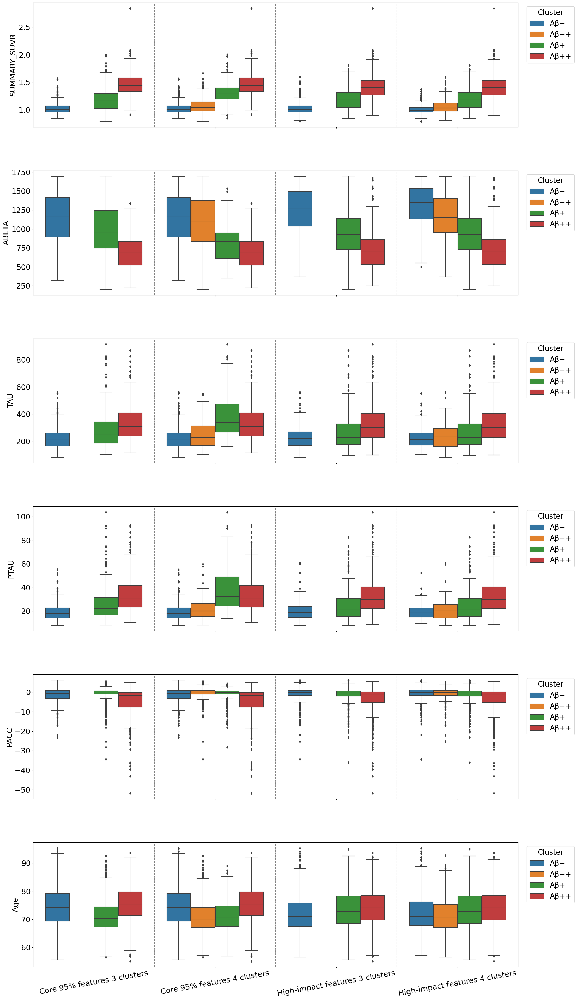

In [242]:
plt.rcParams.update({
    "font.size": 20,
    "axes.titlesize": 28,
    "axes.labelsize": 21,
    "xtick.labelsize": 21,
    "ytick.labelsize": 21,
    "legend.fontsize": 20
})

cont_vars = ['SUMMARY_SUVR', 'ABETA', 'TAU', 'PTAU', 'PACC', 'Age']
clustering_labels = list(df_long['Clustering'].cat.categories)
cluster_order_present = [c for c in cluster_order if c in df_long['Cluster_label'].cat.categories]

fig, axes = plt.subplots(len(cont_vars), 1, figsize=(24, 8 * len(cont_vars)))
fig.subplots_adjust(hspace=0.35)

for row_i, var in enumerate(cont_vars):
    ax = axes[row_i]
    sns.boxplot(
        data=df_long,
        x='Clustering', y=var,
        hue='Cluster_label',
        hue_order=cluster_order_present,
        order=clustering_labels,
        ax=ax
    )
    for xv in [0.5, 1.5, 2.5]:
        ax.axvline(xv, color='gray', linestyle='--')
    ax.set_ylabel(var)
    ax.set_xlabel('')
    if row_i < len(cont_vars) - 1:
        ax.set_xticklabels([])
    else:
        ax.set_xticklabels(clustering_labels, rotation=10, ha='center')
    ax.legend(title='Cluster', bbox_to_anchor=(1.01, 1), loc='upper left')



fig.savefig(path + f'/sel_clusters_descriptive_{date}.png', bbox_inches='tight')
fig.savefig(path + f'/sel_clusters_descriptive_{date}.svg', format='svg', bbox_inches='tight')

plt.show()

In [233]:
'''plt.rcParams.update({
    "font.size": 20,              # base font size
    "axes.titlesize": 28,         # title font
    "axes.labelsize": 21,         # x and y labels
    "xtick.labelsize": 21,        # x ticks
    "ytick.labelsize": 21,        # y ticks
    "legend.fontsize": 20        # legend
})

for var in ['SUMMARY_SUVR','ABETA','TAU','PTAU','PACC','Age']:
    plt.figure(figsize=(24,8))
    sns.boxplot(data=df_long, x='Clustering', y=var, hue='Cluster_label')
    #plt.title(f"{var} across clustering strategies")
    plt.tight_layout()
    plt.axvline(0.5, color='gray', linestyle='--')
    plt.axvline(1.5, color='gray', linestyle='--')
    plt.axvline(2.5, color='gray', linestyle='--')
    plt.show()
    
'''

'plt.rcParams.update({\n    "font.size": 20,              # base font size\n    "axes.titlesize": 28,         # title font\n    "axes.labelsize": 21,         # x and y labels\n    "xtick.labelsize": 21,        # x ticks\n    "ytick.labelsize": 21,        # y ticks\n    "legend.fontsize": 20        # legend\n})\n\nfor var in [\'SUMMARY_SUVR\',\'ABETA\',\'TAU\',\'PTAU\',\'PACC\',\'Age\']:\n    plt.figure(figsize=(24,8))\n    sns.boxplot(data=df_long, x=\'Clustering\', y=var, hue=\'Cluster_label\')\n    #plt.title(f"{var} across clustering strategies")\n    plt.tight_layout()\n    plt.axvline(0.5, color=\'gray\', linestyle=\'--\')\n    plt.axvline(1.5, color=\'gray\', linestyle=\'--\')\n    plt.axvline(2.5, color=\'gray\', linestyle=\'--\')\n    plt.show()\n    \n'

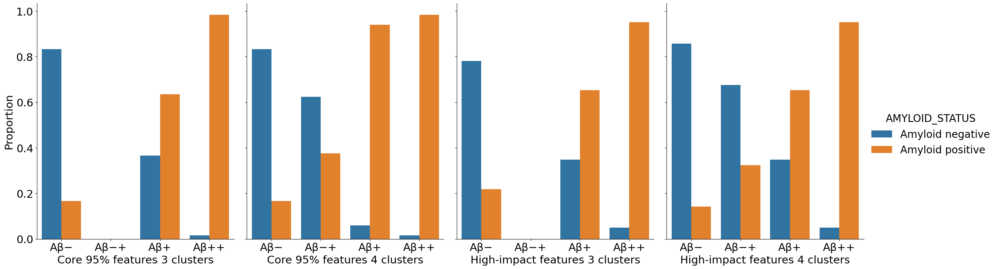

In [241]:
plt.rcParams.update({
    "font.size": 20,              # base font size
    "axes.titlesize": 28,         # title font
    "axes.labelsize": 21,         # x and y labels
    "xtick.labelsize": 21,        # x ticks
    "ytick.labelsize": 21,        # y ticks
    "legend.fontsize": 20        # legend
})
g = sns.catplot(
    data=amyloid_prop,
    x='Cluster_label',
    y='Proportion',
    hue='AMYLOID_STATUS',
    col='Clustering',
    kind='bar',
    col_wrap=4,
    sharey=True,
    height=8,       # height of each panel in inches
    aspect=0.75  # width = height * aspect, so each panel is 8×12in
)

# Remove top titles
g.set_titles("")

# Set clustering name as x-axis label for each subplot

for ax, title in zip(g.axes.flatten(), amyloid_prop['Clustering'].cat.categories):
    ax.set_xlabel(title)


#plt.tight_layout()
g.savefig(path + f'/sel_clusters_descriptive_as_{date}.png', bbox_inches='tight')
g.savefig(path + f'/sel_clusters_descriptive_as_{date}.svg', format='svg', bbox_inches='tight')

plt.show()



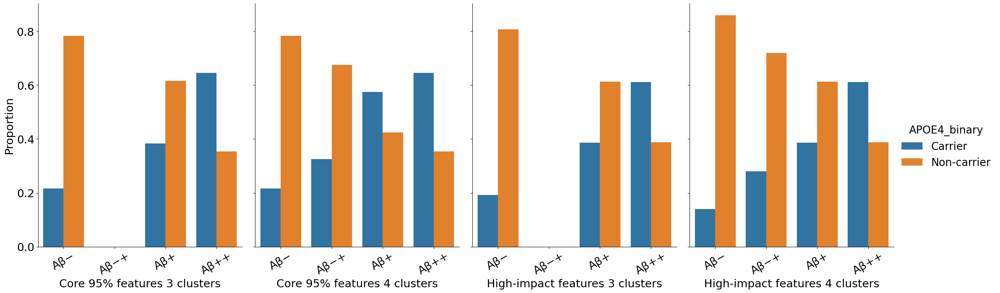

In [243]:
g = sns.catplot(
    data=apoe_prop,
    x='Cluster_label',
    y='Proportion',
    hue='APOE4_binary',
    col='Clustering',
    kind='bar',
    col_wrap=4,
    sharey=True,
    height=8,       # height of each panel in inches
    aspect=0.75
)

# Remove top titles
g.set_titles("")

# Add clustering names as x-axis labels
for ax, title in zip(g.axes.flatten(), apoe_prop['Clustering'].cat.categories):
    ax.set_xlabel(title)

# Remove default x-axis label
#g.set_xlabels("")

# Optional: rotate cluster labels for readability
for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=30)

#plt.tight_layout()
g.savefig(path + f'/sel_clusters_descriptive_apoe_{date}.png', bbox_inches='tight')
g.savefig(path + f'/sel_clusters_descriptive_apoe_{date}.svg', format='svg', bbox_inches='tight')

plt.show()

# Clusters' forest plots

In [123]:
meta2_cleaned_noad.shape

(2802, 42)

In [246]:
meta2_cleaned_noad_bl = meta2_cleaned_noad[(meta2_cleaned_noad.VISCODE2 == 'bl') |(meta2_cleaned_noad.VISCODE2 == 'SCV2')].copy()

In [247]:
meta2_cleaned_noad_bl.shape

(1911, 41)

In [248]:
# Centiloids clusters vs petVAE clusters

#meta2_cleaned_noad_bl['centilod_clusters'] = 2
#meta2_cleaned_noad_bl.loc[meta2_cleaned_noad_bl.CENTILOIDS<10,'centilod_clusters'] = 1
#meta2_cleaned_noad_bl.loc[meta2_cleaned_noad_bl.CENTILOIDS>30,'centilod_clusters'] = 3

# Define centiloid thresholds
conditions = [
    meta2_cleaned_noad_bl['CENTILOIDS'] <= 15,                                          # negative 1
    (meta2_cleaned_noad_bl['CENTILOIDS'] > 15) & (meta2_cleaned_noad_bl['CENTILOIDS'] <= 25),  # uncertain 2
    (meta2_cleaned_noad_bl['CENTILOIDS'] > 25) & (meta2_cleaned_noad_bl['CENTILOIDS'] <= 50),  # moderate positive 3
    meta2_cleaned_noad_bl['CENTILOIDS'] > 50                                             # high positive 4
]

labels = [1, 2, 3,4]

meta2_cleaned_noad_bl['centiloid_class'] = np.select(conditions, labels, default=np.nan)

In [257]:
meta2_cleaned_noad_bl.clusters95_4.value_counts()

2    526
3    523
4    512
1    350
Name: clusters95_4, dtype: int64

In [249]:
def forest_plot_clusters(coef, conf, ax=None, title=None, ylabel=None,
                         color="black", ci_color="blue", y_positions=None):
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt

    if ax is None:
        fig, ax = plt.subplots(figsize=(6, 4))
        
    conf.columns = ["CI_lower", "CI_upper"]

    # Combine into one dataframe
    results = pd.concat([coef, conf], axis=1).reset_index()
    results.columns = ["Variable", "Coef", "CI_lower", "CI_upper"]
    results['Variable'] = ['Intercept', 'Cluster 2', 'Cluster 3', 'Cluster 4', 'Sex, M', 'Age']

    # Exclude intercept
    plot_data = results[results["Variable"] != "Intercept"].copy()
    
    # Apply y positions
    if y_positions is None:
        y_positions = np.arange(len(plot_data))
    plot_data["y_pos"] = y_positions

    # --- Plot using numeric y positions ---
    ax.errorbar(
        plot_data["Coef"],
        plot_data["y_pos"],  # numeric positions instead of names
        xerr=[plot_data["Coef"] - plot_data["CI_lower"],
              plot_data["CI_upper"] - plot_data["Coef"]],
        fmt="o",
        color=color,
        ecolor=ci_color,
        elinewidth=4,
        capsize=4
    )

    # Replace numeric ticks with variable names
    ax.set_yticks(plot_data["y_pos"])
    ax.set_yticklabels(plot_data["Variable"])

    ax.axvline(x=0, color="red", linestyle="--")  # null effect line
    ax.set_xlabel("Coefficient (95% CI)")
    if ylabel:
        ax.set_ylabel(ylabel)
    if title:
        ax.set_title(title)

    return ax


Optimization terminated successfully.
         Current function value: 0.744445
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.763526
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.762076
         Iterations 8


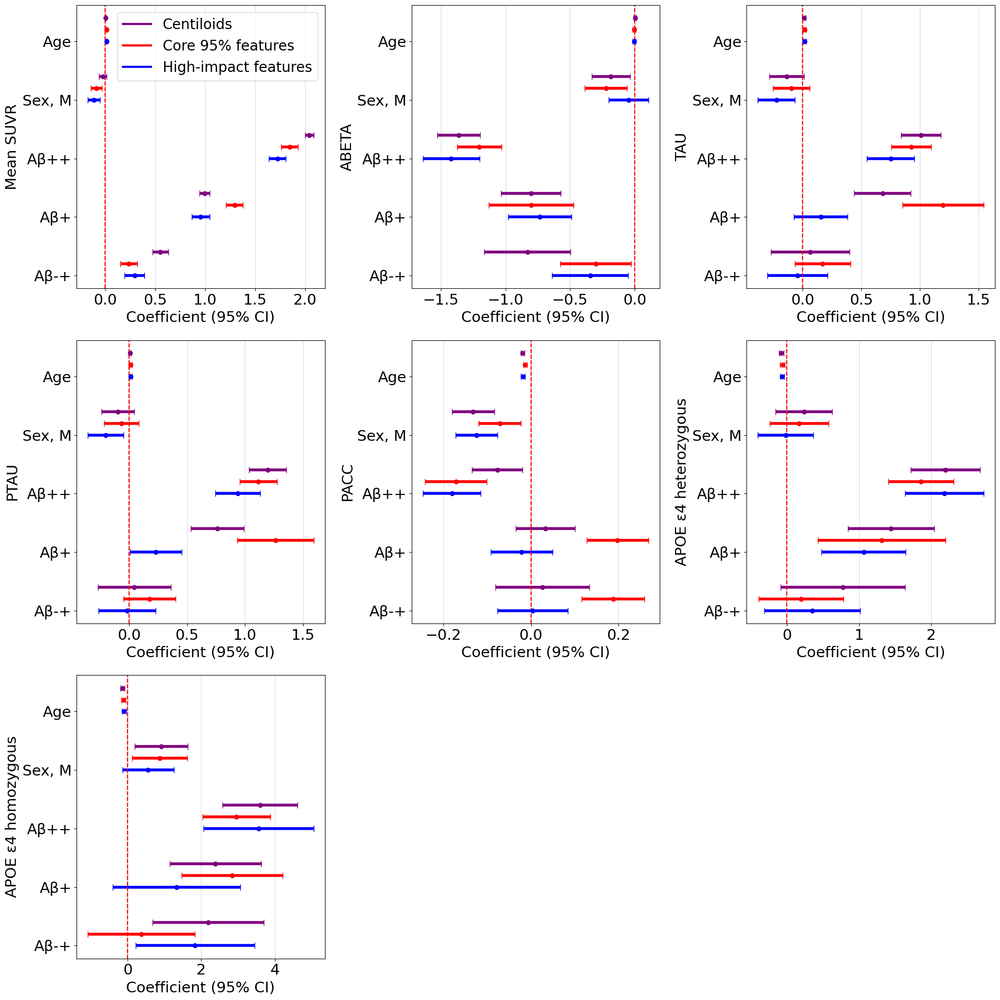

In [439]:
plt.rcParams.update({
    "font.size": 20,              # base font size
    "axes.titlesize": 28,         # title font
    "axes.labelsize": 21,         # x and y labels
    "xtick.labelsize": 21,        # x ticks
    "ytick.labelsize": 21,        # y ticks
    "legend.fontsize": 20        # legend
})


import statsmodels.api as sm
import statsmodels.formula.api as smf

import numpy as np

fig, axes = plt.subplots(3, 3, figsize=(20, 20) )
axes = axes.flatten()

variables = ['SUMMARY_SUVR','ABETA', 'TAU','PTAU',  'PACC','APOE4']
names = ['Mean SUVR','ABETA', 'TAU','PTAU',  'PACC', 'APOE ε4 heterozygous', 'APOE ε4 homozygous']

for i,var in enumerate(variables):
    # Features (independent variables) and target (dependent variable)
    #X = meta2_cleaned_noad_bl[['clusters','Age','sex_binary']]   # predictors
    #y = meta2_cleaned_noad_bl[i]            # response
    #pt = PowerTransformer(method='yeo-johnson')
    data = meta2_cleaned_noad_bl.dropna(subset=[var]).copy()
    
    data['APOE4'] = data['APOE4'].astype('category').cat.codes
    data['95_4clusters'] = data['clusters95_4'].astype('category')
    #data[i] = pt.fit_transform(meta2_cleaned_noad_bl[[i]].dropna())
    #if i != 'PACC':
    #    data[i] = np.log(data[i])
        
    '''mask = np.isfinite(X).all(axis=1) & np.isfinite(y)
    X_clean = X[mask]
    y_clean = y[mask]'''

    # Add constant for intercept
    #X_clean = sm.add_constant(X_clean)

    # Fit model
    #model = sm.OLS(y_clean, X_clean).fit()
    
    if var == 'APOE4':
        model = smf.mnlogit(var + " ~ C(centiloid_class) + Age + C(Sex)", data=data).fit()
        forest_plot_clusters(coef = model.params[0], conf = model.conf_int().loc['1',:],ax = axes[i], ylabel = names[i],
                     color='purple', ci_color='purple', y_positions=[0.4,1.4,2.4,3.4,4.4])
        forest_plot_clusters(coef = model.params[1],conf =model.conf_int().loc['2',:],ax = axes[i+1], ylabel = names[i+1],
                     color='purple', ci_color='purple', y_positions=[0.4,1.4,2.4,3.4,4.4])
        axes[i].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)
        axes[i+1].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)
    else:
        model = smf.ols(var+"~ C(centiloid_class) + Age+C(Sex)", data=data).fit()
    
        forest_plot_clusters(coef = model.params,conf =model.conf_int(),ax = axes[i], ylabel = names[i],
                     color='purple', ci_color='purple', y_positions=[0.4,1.4,2.4,3.4,4.4])
        axes[i].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)    
    
    if var == 'APOE4':
        model = smf.mnlogit(var + " ~ C(clusters95_4) + Age + C(Sex)", data=data).fit()
        forest_plot_clusters(coef = model.params[0], conf = model.conf_int().loc['1',:],ax = axes[i], ylabel = names[i],
                     color='red', ci_color='red', y_positions=[0.2,1.2,2.2,3.2,4.2])
        forest_plot_clusters(coef = model.params[1],conf =model.conf_int().loc['2',:],ax = axes[i+1], ylabel = names[i+1],
                     color='red', ci_color='red', y_positions=[0.2,1.2,2.2,3.2,4.2])
        axes[i].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)
        axes[i+1].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)
    else:
        model = smf.ols(var+"~ C(clusters95_4) + Age+C(Sex)", data=data).fit()
    
        forest_plot_clusters(coef = model.params,conf =model.conf_int(),ax = axes[i], ylabel = names[i],
                     color='red', ci_color='red', y_positions=[0.2,1.2,2.2,3.2,4.2])
        axes[i].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)    
            


    
    if var == 'APOE4':
        model = smf.mnlogit(var + " ~ C(clusters_top_4) + Age + C(Sex)", data=data).fit()
        forest_plot_clusters(coef = model.params[0], conf = model.conf_int().loc['1',:],ax = axes[i],
                     color='blue', ci_color='blue', y_positions=[0.0,1.0,2.0,3.0,4.0])
        forest_plot_clusters(coef = model.params[1],conf =model.conf_int().loc['2',:],ax = axes[i+1],
                     color='blue', ci_color='blue', y_positions=[0.0,1.0,2.0,3.0,4.0])
        axes[i].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)
        axes[i+1].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)
    else:
        model = smf.ols(var+"~ C(clusters_top_4) + Age+C(Sex)", data=data).fit()
    
        forest_plot_clusters(coef = model.params,conf =model.conf_int(),ax = axes[i],
                     color='blue', ci_color='blue', y_positions=[0.0,1.0,2.0,3.0,4.0])
        axes[i].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)

axes[0].legend(
    handles=[
        plt.Line2D([0], [0], color='purple', lw=3, label='Centiloids'),
        plt.Line2D([0], [0], color='red', lw=3, label='Core 95% features'),
        plt.Line2D([0], [0], color='blue', lw=3, label='High-impact features'),
    ],
    loc='upper right', frameon=True
)

axes[-1].remove()
axes[-2].remove()
for i in range(7):
    axes[i].set_yticklabels(['Aβ-+','Aβ+','Aβ++','Sex, M','Age'])

plt.tight_layout()

#plt.savefig(path + f'/forest_plot_clusters_sup_cent_{date}.png', bbox_inches='tight')
#plt.savefig(path + f'/forest_plot_clusters_sup_cent_{date}.svg', format='svg', bbox_inches='tight')

plt.show()

In [467]:
row

Variable                                                     APOE4
metric                                                    Accuracy
R2_cent_mean                                              0.678083
R2_95_mean                                                0.659176
R2_hi_mean                                                0.657423
R2_cent_std                                               0.063385
R2_95_std                                                 0.077146
R2_hi_std                                                 0.062675
R2_cent_folds    [0.711864406779661, 0.6206896551724138, 0.8275...
R2_95_folds      [0.6779661016949152, 0.6379310344827587, 0.793...
R2_hi_folds      [0.6949152542372882, 0.6896551724137931, 0.758...
p_hi_vs_cent                                              0.223489
p_95_vs_cent                                              0.208067
Name: 5, dtype: object

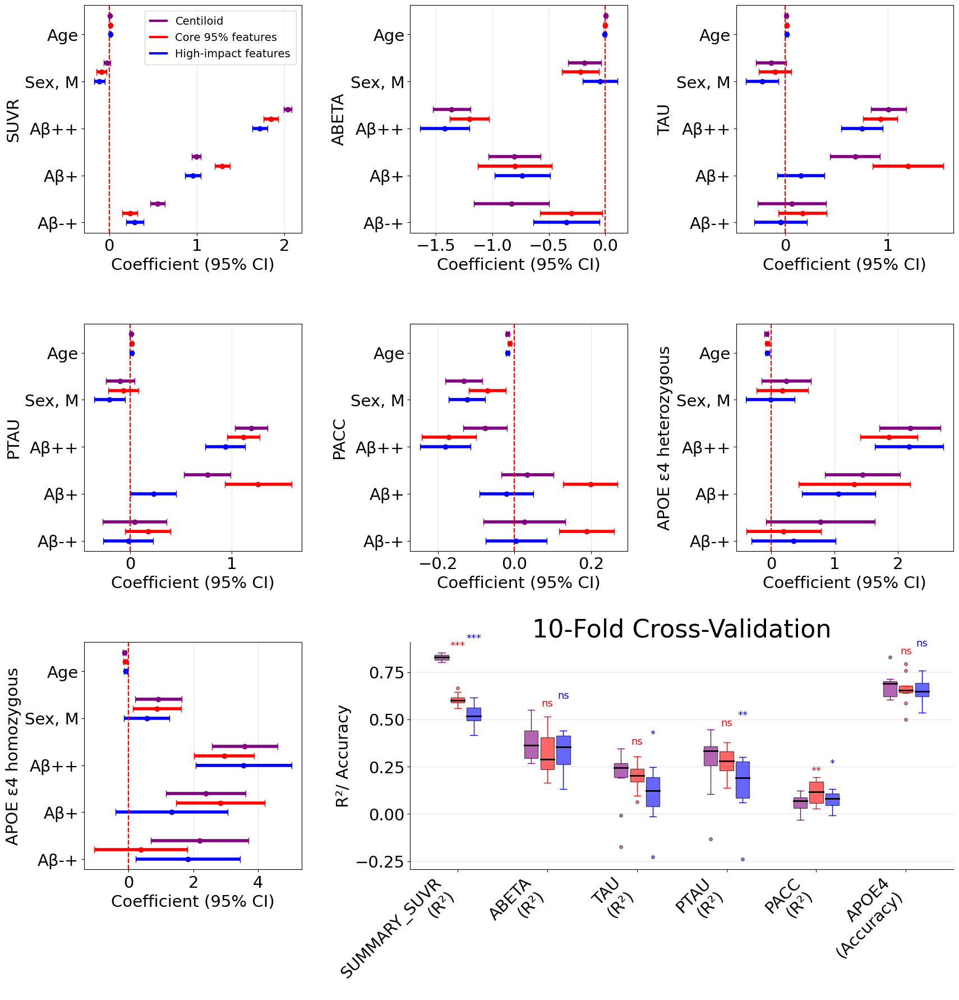

In [470]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import statsmodels.formula.api as smf

from matplotlib.gridspec import GridSpec
from matplotlib.patches import Patch
from sklearn.model_selection import KFold
from sklearn.metrics import r2_score, accuracy_score
from statsmodels.stats.multitest import multipletests
from scipy.stats import ttest_rel

# ======================
# Plot settings
# ======================
plt.rcParams.update({
    "font.size": 20,
    "axes.labelsize": 21,
    "xtick.labelsize": 21,
    "ytick.labelsize": 21,
    "legend.fontsize": 20
})

# ======================
# CV setup
# ======================
kf = KFold(n_splits=10, shuffle=True, random_state=42)
cv_results = []

# ======================
# Figure with GridSpec
# ======================
fig = plt.figure(figsize=(20, 20))
gs  = GridSpec(3, 3, figure=fig, wspace=0.5, hspace=0.4)

# First 7 subplots
axes = [fig.add_subplot(gs[i // 3, i % 3]) for i in range(7)]

# R² / Accuracy panel spanning last 2 slots in row 2
ax_r2 = fig.add_subplot(gs[2, 1:])

# ======================
# Variables
# ======================
variables = ['SUMMARY_SUVR','ABETA','TAU','PTAU','PACC','APOE4']
names = ['SUVR','ABETA','TAU','PTAU','PACC',
         'APOE ε4 heterozygous','APOE ε4 homozygous']
# ======================
# Helpers
# ======================
def p_to_star(p):
    if p < 0.001:
        return "***"
    elif p < 0.01:
        return "**"
    elif p < 0.05:
        return "*"
    else:
        return "ns"

def whisker_top(folds):
    q1, q3 = np.percentile(folds, [25, 75])
    return min(max(folds), q3 + 1.5 * (q3 - q1))

# ======================
# Main loop
# ======================
for i, var in enumerate(variables):

    data = meta2_cleaned_noad_bl.dropna(subset=[var]).copy()
    data['APOE4'] = data['APOE4'].astype('category').cat.codes
    data['95_4clusters'] = data['clusters95_4'].astype('category')

    # ======================
    # CV
    # ======================
    acc_cent, acc_95, acc_hi = [], [], []
    r2_cent,  r2_95,  r2_hi  = [], [], []

    for train_idx, test_idx in kf.split(data):

        train = data.iloc[train_idx]
        test  = data.iloc[test_idx]

        if var == 'APOE4':
            for acc_list, formula_var in zip(
                [acc_cent, acc_95, acc_hi],
                ['centiloid_class', 'clusters95_4', 'clusters_top_4']
            ):
                m = smf.mnlogit(
                    f"{var} ~ C({formula_var}) + Age + C(Sex)", data=train
                ).fit(disp=0)
                preds = m.predict(test).values.argmax(axis=1)
                acc_list.append(accuracy_score(test[var], preds))

        else:
            for r2_list, formula_var in zip(
                [r2_cent, r2_95, r2_hi],
                ['centiloid_class', 'clusters95_4', 'clusters_top_4']
            ):
                m = smf.ols(
                    f"{var} ~ C({formula_var}) + Age + C(Sex)", data=train
                ).fit()
                r2_list.append(r2_score(test[var], m.predict(test)))

    if var == 'APOE4':
        acc_cent = np.array(acc_cent)
        acc_95   = np.array(acc_95)
        acc_hi   = np.array(acc_hi)

        p_hi_vs_cent = ttest_rel(acc_hi,  acc_cent).pvalue
        p_95_vs_cent = ttest_rel(acc_95,  acc_cent).pvalue

        cv_results.append({
            "Variable":       var,
            "metric":         "Accuracy",
            "R2_cent_mean":   acc_cent.mean(),
            "R2_95_mean":     acc_95.mean(),
            "R2_hi_mean":     acc_hi.mean(),
            "R2_cent_std":    acc_cent.std(),
            "R2_95_std":      acc_95.std(),
            "R2_hi_std":      acc_hi.std(),
            "R2_cent_folds":  acc_cent.tolist(),
            "R2_95_folds":    acc_95.tolist(),
            "R2_hi_folds":    acc_hi.tolist(),
            "p_hi_vs_cent":   p_hi_vs_cent,
            "p_95_vs_cent":   p_95_vs_cent,
        })

    else:
        r2_cent = np.array(r2_cent)
        r2_95   = np.array(r2_95)
        r2_hi   = np.array(r2_hi)

        p_hi_vs_cent = ttest_rel(r2_hi,  r2_cent).pvalue
        p_95_vs_cent = ttest_rel(r2_95,  r2_cent).pvalue

        cv_results.append({
            "Variable":       var,
            "metric":         "R²",
            "R2_cent_mean":   r2_cent.mean(),
            "R2_95_mean":     r2_95.mean(),
            "R2_hi_mean":     r2_hi.mean(),
            "R2_cent_std":    r2_cent.std(),
            "R2_95_std":      r2_95.std(),
            "R2_hi_std":      r2_hi.std(),
            "R2_cent_folds":  r2_cent.tolist(),
            "R2_95_folds":    r2_95.tolist(),
            "R2_hi_folds":    r2_hi.tolist(),
            "p_hi_vs_cent":   p_hi_vs_cent,
            "p_95_vs_cent":   p_95_vs_cent,
        })

    # ======================
    # Forest plots
    # ======================

    # Centiloid
    if var == 'APOE4':
        model = smf.mnlogit(f"{var} ~ C(centiloid_class) + Age + C(Sex)", data=data).fit(disp=0)

        forest_plot_clusters(model.params[0], model.conf_int().loc['1',:], ax=axes[i],
                             ylabel=names[i], color='purple', ci_color='purple',
                             y_positions=[0.4,1.4,2.4,3.4,4.4])

        forest_plot_clusters(model.params[1], model.conf_int().loc['2',:], ax=axes[i+1],
                             ylabel=names[i+1], color='purple', ci_color='purple',
                             y_positions=[0.4,1.4,2.4,3.4,4.4])

        axes[i+1].grid(axis='x', alpha=0.3)

    else:
        model = smf.ols(f"{var} ~ C(centiloid_class) + Age + C(Sex)", data=data).fit()

        forest_plot_clusters(model.params, model.conf_int(), ax=axes[i],
                             ylabel=names[i], color='purple', ci_color='purple',
                             y_positions=[0.4,1.4,2.4,3.4,4.4])

    axes[i].grid(axis='x', alpha=0.3)

    # Core 95%
    if var == 'APOE4':
        model = smf.mnlogit(f"{var} ~ C(clusters95_4) + Age + C(Sex)", data=data).fit(disp=0)

        forest_plot_clusters(model.params[0], model.conf_int().loc['1',:], ax=axes[i],
                             color='red', ci_color='red',
                             y_positions=[0.2,1.2,2.2,3.2,4.2])

        forest_plot_clusters(model.params[1], model.conf_int().loc['2',:], ax=axes[i+1],
                             color='red', ci_color='red',
                             y_positions=[0.2,1.2,2.2,3.2,4.2])

    else:
        model = smf.ols(f"{var} ~ C(clusters95_4) + Age + C(Sex)", data=data).fit()

        forest_plot_clusters(model.params, model.conf_int(), ax=axes[i],
                             color='red', ci_color='red',
                             y_positions=[0.2,1.2,2.2,3.2,4.2])

    axes[i].grid(axis='x', alpha=0.3)

    # High-impact
    if var == 'APOE4':
        model = smf.mnlogit(f"{var} ~ C(clusters_top_4) + Age + C(Sex)", data=data).fit(disp=0)

        forest_plot_clusters(model.params[0], model.conf_int().loc['1',:], ax=axes[i],
                             color='blue', ci_color='blue',
                             y_positions=[0.0,1.0,2.0,3.0,4.0])

        forest_plot_clusters(model.params[1], model.conf_int().loc['2',:], ax=axes[i+1],
                             color='blue', ci_color='blue',
                             y_positions=[0.0,1.0,2.0,3.0,4.0])

    else:
        model = smf.ols(f"{var} ~ C(clusters_top_4) + Age + C(Sex)", data=data).fit()

        forest_plot_clusters(model.params, model.conf_int(), ax=axes[i],
                             color='blue', ci_color='blue',
                             y_positions=[0.0,1.0,2.0,3.0,4.0])

    axes[i].grid(axis='x', alpha=0.3)

# ======================
# FDR correction (5 vars × 2 comparisons = 10 tests)
# ======================
cv_df = pd.DataFrame(cv_results)

all_pvals = []
for _, row in cv_df.iterrows():
    all_pvals.append(row["p_95_vs_cent"])
    all_pvals.append(row["p_hi_vs_cent"])

_, pvals_corrected, _, _ = multipletests(all_pvals, method='fdr_bh')

cv_df["p_95_vs_cent_fdr"] = pvals_corrected[0::2]
cv_df["p_hi_vs_cent_fdr"] = pvals_corrected[1::2]

# ======================
# GLOBAL METRIC PANEL — boxplots
# ======================
n_vars  = len(cv_df)
x       = np.arange(n_vars) * 1.4
width   = 0.25
offsets = [-width, 0, width]
colors  = ['purple', 'red', 'blue']
labels  = ['Centiloid', 'Core 95%', 'High-impact']
keys    = ['R2_cent_folds', 'R2_95_folds', 'R2_hi_folds']

for j, (key, color) in enumerate(zip(keys, colors)):
    fold_data = [cv_df.loc[i, key] for i in range(n_vars)]
    ax_r2.boxplot(
        fold_data,
        positions=x + offsets[j],
        widths=width * 0.85,
        patch_artist=True,
        boxprops=dict(facecolor=color, alpha=0.6),
        medianprops=dict(color='black', linewidth=2),
        whiskerprops=dict(color=color),
        capprops=dict(color=color),
        flierprops=dict(marker='o', markerfacecolor=color, markersize=4, alpha=0.5),
        manage_ticks=False,
    )

# Remove any auto-generated empty legend from boxplot
if ax_r2.get_legend():
    ax_r2.get_legend().remove()

ax_r2.set_xticks(x)
ax_r2.set_xticklabels(
    [f"{row['Variable']}\n({row['metric']})" for _, row in cv_df.iterrows()],
    rotation=45, ha='right'
)
ax_r2.set_ylabel("R²/ Accuracy")
ax_r2.set_title("10-Fold Cross-Validation")
ax_r2.spines['top'].set_visible(False)
ax_r2.spines['right'].set_visible(False)
ax_r2.grid(axis='y', alpha=0.3)

# Add clean legend with Patch handles only
legend_handles = [
    Patch(facecolor='purple', alpha=0.6, label='Centiloids'),
    Patch(facecolor='red',    alpha=0.6, label='Core 95%'),
    Patch(facecolor='blue',   alpha=0.6, label='High-impact'),
]
'''ax_r2.legend(
    handles=legend_handles,
    loc='upper right',
    frameon=True,
    fontsize=16
)'''

# ======================
# Significance stars (FDR-corrected)
# ======================
for idx, row in cv_df.iterrows():

    y_max = max(
        whisker_top(row["R2_cent_folds"]),
        whisker_top(row["R2_95_folds"]),
        whisker_top(row["R2_hi_folds"])
    )

    # Core 95% vs Centiloids — red, lower
    ax_r2.text(
        x[idx] + offsets[1],
        y_max + 0.02,
        p_to_star(row["p_95_vs_cent_fdr"]),
        ha='center', fontsize=13, color='red'
    )
    # High-impact vs Centiloids — blue, higher
    ax_r2.text(
        x[idx] + offsets[2],
        y_max + 0.06,
        p_to_star(row["p_hi_vs_cent_fdr"]),
        ha='center', fontsize=13, color='blue'
    )

# ======================
# Legend for forest plots — placed inside axes[0] without overflow
# ======================
axes[0].legend(
    handles=[
        plt.Line2D([0], [0], color='purple', lw=3, label='Centiloid'),
        plt.Line2D([0], [0], color='red',    lw=3, label='Core 95% features'),
        plt.Line2D([0], [0], color='blue',   lw=3, label='High-impact features'),
    ],
    loc='upper right',       # bottom corner avoids top-heavy overlap
    frameon=True,
    fontsize=14,             # slightly smaller to fit within subplot
    handlelength=1.5,
    borderpad=0.5,
)

# ======================
# Y tick labels for forest plots
# ======================
for i in range(7):
    axes[i].set_yticklabels(['Aβ-+','Aβ+','Aβ++','Sex, M','Age'])

plt.savefig(path + f'/forest_plot_clusters_sup_cent2_{date}.png', bbox_inches='tight')
plt.savefig(path + f'/forest_plot_clusters_sup_cent2_{date}.svg', format='svg', bbox_inches='tight')

plt.show()

# ======================
# Save CV results
# ======================
cv_df.to_csv(path + f'/cv_r2_comparison_{date}.csv', index=False)

In [422]:
cv_df

,Variable,R2_cent_mean,R2_95_mean,R2_hi_mean,R2_cent_std,R2_95_std,R2_hi_std,p_hi_vs_cent,p_95_vs_cent,R2_cent_folds,R2_95_folds,R2_hi_folds
0,SUMMARY_SUVR,0.827973,0.605976,0.523437,0.016272,0.029548,0.055297,5.331349e-08,1.320978e-08,"[0.8199615611144546, 0.8272279758030499, 0.853...","[0.614756659346098, 0.6455620598609585, 0.5872...","[0.6160441078660656, 0.4890928001587047, 0.468..."
1,ABETA,0.376408,0.316696,0.325353,0.089394,0.105511,0.107489,1.567780e-01,1.081900e-01,"[0.2865658699377319, 0.293224523743394, 0.3001...","[0.415761532837437, 0.21265324200019875, 0.227...","[0.43380816759118757, 0.3500905273478023, 0.15..."
2,TAU,0.189398,0.193934,0.099445,0.152078,0.069173,0.136056,5.209660e-03,9.185494e-01,"[0.24625559901944538, 0.32418677261517925, 0.2...","[0.06293484462787868, 0.2223364782071069, 0.30...","[0.12968761980106502, 0.247582434306042, 0.020..."
3,PTAU,0.274232,0.272751,0.155057,0.161115,0.077338,0.155867,4.722474e-04,9.749158e-01,"[0.35989235618054716, 0.3987519377267187, 0.34...","[0.13840619812967803, 0.2752037803222185, 0.37...","[0.22019122304992056, 0.2998719925279161, 0.06..."
4,PACC,0.056721,0.114959,0.071300,0.047273,0.061771,0.045274,6.688618e-03,2.079942e-03,"[0.08974484624440904, 0.08456586295682333, 0.1...","[0.17158816212275052, 0.18611329571026014, 0.0...","[0.10862284481063544, 0.09418240700771119, 0.1..."


In [220]:
import pandas as pd
import numpy as np

# Define your three classification columns
classifications = ['clusters95_4', 'clusters_top_4', 'centiloid_class']  # replace with your actual column names

variables = ['SUMMARY_SUVR', 'CENTILOIDS']

results = {}

for cls in classifications:
    grouped = meta2_cleaned_noad_bl.groupby(cls)[variables].agg(['mean', 'std']).round(3)
    grouped.columns = ['_'.join(col) for col in grouped.columns]  # flatten multi-index columns
    grouped['n'] = meta2_cleaned_noad_bl.groupby(cls).size()
    results[cls] = grouped

final_table = pd.concat(results, axis=0)
print(final_table)

                              SUMMARY_SUVR_mean  SUMMARY_SUVR_std  \
                clusters95_4                                        
clusters95_4    1                        -0.868             0.476   
                2                        -0.626             0.587   
                3                         0.434             0.631   
                4                         1.008             0.680   
clusters_top_4  1                        -0.912             0.445   
                2                        -0.625             0.597   
                3                         0.066             0.774   
                4                         0.834             0.715   
centiloid_class 1                        -1.066             0.290   
                2                        -0.511             0.093   
                3                        -0.067             0.171   
                4                         0.987             0.546   

                              CEN

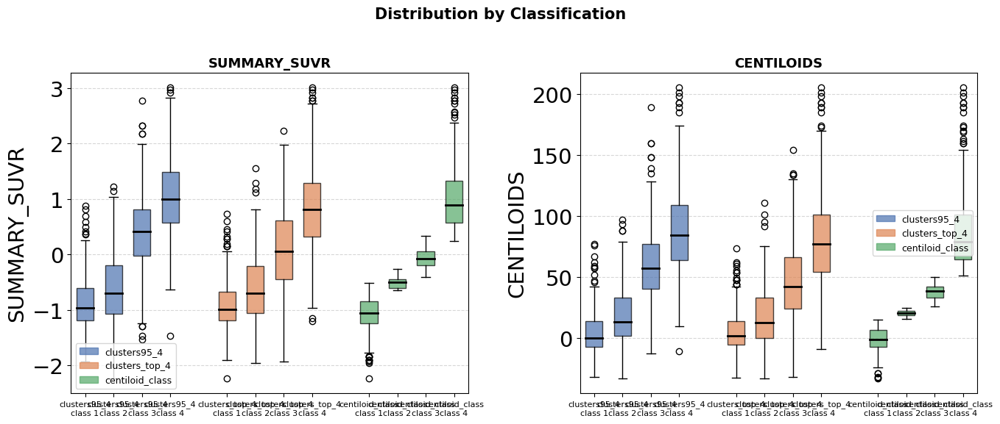

In [221]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

classifications = ['clusters95_4', 'clusters_top_4', 'centiloid_class']  # replace with your actual names
variables = ['SUMMARY_SUVR', 'CENTILOIDS']
colors = ['#4C72B0', '#DD8452', '#55A868']  # one color per classification

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

for ax, var in zip(axes, variables):
    data_to_plot = []
    positions = []
    color_list = []
    tick_positions = []
    tick_labels = []
    
    offset = 0
    for i, cls in enumerate(classifications):
        classes = sorted(meta2_cleaned_noad_bl[cls].dropna().unique())
        for j, c in enumerate(classes):
            data_to_plot.append(meta2_cleaned_noad_bl[meta2_cleaned_noad_bl[cls] == c][var].dropna().values)
            positions.append(offset)
            color_list.append(colors[i])
            tick_positions.append(offset)
            tick_labels.append(f'{cls}\nclass {int(c)}')
            offset += 1
        offset += 1  # gap between classifications

    bp = ax.boxplot(data_to_plot, positions=positions, patch_artist=True, widths=0.6,
                    medianprops=dict(color='black', linewidth=2))
    
    for patch, color in zip(bp['boxes'], color_list):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)

    ax.set_xticks(tick_positions)
    ax.set_xticklabels(tick_labels, fontsize=8)
    ax.set_title(var, fontsize=13, fontweight='bold')
    ax.set_ylabel(var)
    ax.grid(axis='y', linestyle='--', alpha=0.5)

    # Legend for classifications
    legend_patches = [mpatches.Patch(color=colors[i], alpha=0.7, label=cls) 
                      for i, cls in enumerate(classifications)]
    ax.legend(handles=legend_patches, fontsize=9)

plt.suptitle('Distribution by Classification', fontsize=15, fontweight='bold')
plt.tight_layout()
#plt.savefig('boxplots_by_classification.png', dpi=150, bbox_inches='tight')
plt.show()

In [217]:
meta2_cleaned_noad_bl.columns

Index(['Project', 'Phase', 'MRI_subID', 'Sex', 'Weight', 'Research.Group',
       'VISCODE', 'VISCODE2', 'Study.Date', 'Age', 'Modality', 'Description',
       'Imaging.Protocol', 'Image.Data.ID', 'modality_subtype', 'PATH',
       'PET_PATH_normalised', 'AMYLOID_STATUS', 'SUMMARY_SUVR', 'CENTILOIDS',
       'APOE4', 'ABETA', 'TAU', 'PTAU', 'MMSE', 'ADAS11', 'ADAS13',
       'RAVLT_immediate', 'LDELTOTAL', 'DIGITSCOR', 'TRABSCOR', 'PACC',
       'umap_X_all', 'umap_Y_all', 'rank_parabola_all', 'umap_X_95',
       'umap_Y_95', 'rank_parabola_95', 'umap_X_top', 'umap_Y_top',
       'rank_parabola_top', 'clusters95_4', 'clusters_top_4', 'clusters_top_3',
       'centiloid_class'],
      dtype='object')

In [321]:
def forest_plot_3clusters(coef, conf, ax=None, title=None, ylabel=None,
                         color="black", ci_color="blue", y_positions=None):
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt

    if ax is None:
        fig, ax = plt.subplots(figsize=(6, 4))
        
    conf.columns = ["CI_lower", "CI_upper"]

    # Combine into one dataframe
    results = pd.concat([coef, conf], axis=1).reset_index()
    results.columns = ["Variable", "Coef", "CI_lower", "CI_upper"]
    results['Variable'] = ['Intercept', 'Cluster 2', 'Cluster 3', 'Sex, M', 'Age']

    # Exclude intercept
    plot_data = results[results["Variable"] != "Intercept"].copy()
    
    # Apply y positions
    if y_positions is None:
        y_positions = np.arange(len(plot_data))
    plot_data["y_pos"] = y_positions

    # --- Plot using numeric y positions ---
    ax.errorbar(
        plot_data["Coef"],
        plot_data["y_pos"],  # numeric positions instead of names
        xerr=[plot_data["Coef"] - plot_data["CI_lower"],
              plot_data["CI_upper"] - plot_data["Coef"]],
        fmt="o",
        color=color,
        ecolor=ci_color,
        elinewidth=3,
        capsize=4
    )

    # Replace numeric ticks with variable names
    ax.set_yticks(plot_data["y_pos"])
    ax.set_yticklabels(plot_data["Variable"])

    ax.axvline(x=0, color="red", linestyle="--")  # null effect line
    ax.set_xlabel("Coefficient (95% CI)")
    if ylabel:
        ax.set_ylabel(ylabel)
    if title:
        ax.set_title(title)

    return ax


Optimization terminated successfully.
         Current function value: 0.744445
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.762076
         Iterations 8


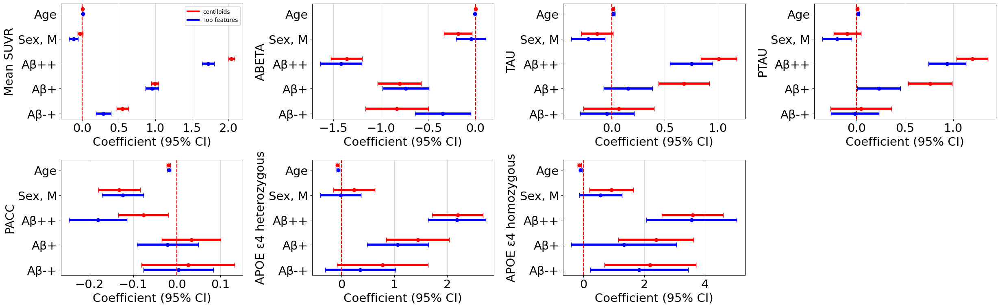

In [214]:
plt.rcParams.update({
    "font.size": 20,              # base font size
    "axes.titlesize": 28,         # title font
    "axes.labelsize": 21,         # x and y labels
    "xtick.labelsize": 21,        # x ticks
    "ytick.labelsize": 21,        # y ticks
    "legend.fontsize": 20        # legend
})


import statsmodels.api as sm
import statsmodels.formula.api as smf

import numpy as np

fig, axes = plt.subplots(2, 4, figsize=(25, 8) )
axes = axes.flatten()

variables = ['SUMMARY_SUVR','ABETA', 'TAU','PTAU',  'PACC','APOE4']
names = ['Mean SUVR','ABETA', 'TAU','PTAU',  'PACC', 'APOE ε4 heterozygous', 'APOE ε4 homozygous']

for i,var in enumerate(variables):
    # Features (independent variables) and target (dependent variable)
    #X = meta2_cleaned_noad_bl[['clusters','Age','sex_binary']]   # predictors
    #y = meta2_cleaned_noad_bl[i]            # response
    #pt = PowerTransformer(method='yeo-johnson')
    data = meta2_cleaned_noad_bl.dropna(subset=[var]).copy()
    
    data['APOE4'] = data['APOE4'].astype('category').cat.codes
    data['95_4clusters'] = data['clusters95_4'].astype('category')
    #data[i] = pt.fit_transform(meta2_cleaned_noad_bl[[i]].dropna())
    #if i != 'PACC':
    #    data[i] = np.log(data[i])
        
    '''mask = np.isfinite(X).all(axis=1) & np.isfinite(y)
    X_clean = X[mask]
    y_clean = y[mask]'''

    # Add constant for intercept
    #X_clean = sm.add_constant(X_clean)

    # Fit model
    #model = sm.OLS(y_clean, X_clean).fit()
    if var == 'APOE4':
        model = smf.mnlogit(var + " ~ C(centiloid_class) + Age + C(Sex)", data=data).fit()
        forest_plot_clusters(coef = model.params[0], conf = model.conf_int().loc['1',:],ax = axes[i], ylabel = names[i],
                     color='red', ci_color='red', y_positions=[0.2,1.2,2.2,3.2,4.2])
        forest_plot_clusters(coef = model.params[1],conf =model.conf_int().loc['2',:],ax = axes[i+1], ylabel = names[i+1],
                     color='red', ci_color='red', y_positions=[0.2,1.2,2.2,3.2,4.2])
        axes[i].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)
        axes[i+1].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)
    else:
        model = smf.ols(var+"~ C(centiloid_class) + Age+C(Sex)", data=data).fit()
    
        forest_plot_clusters(coef = model.params,conf =model.conf_int(),ax = axes[i], ylabel = names[i],
                     color='red', ci_color='red', y_positions=[0.2,1.2,2.2,3.2,4.2])
        axes[i].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)    
            


    
    if var == 'APOE4':
        model = smf.mnlogit(var + " ~ C(clusters_top_4) + Age + C(Sex)", data=data).fit()
        forest_plot_clusters(coef = model.params[0], conf = model.conf_int().loc['1',:],ax = axes[i],
                     color='blue', ci_color='blue', y_positions=[0.0,1.0,2.0,3.0,4.0])
        forest_plot_clusters(coef = model.params[1],conf =model.conf_int().loc['2',:],ax = axes[i+1],
                     color='blue', ci_color='blue', y_positions=[0.0,1.0,2.0,3.0,4.0])
        axes[i].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)
        axes[i+1].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)
    else:
        model = smf.ols(var+"~ C(clusters_top_4) + Age+C(Sex)", data=data).fit()
    
        forest_plot_clusters(coef = model.params,conf =model.conf_int(),ax = axes[i],
                     color='blue', ci_color='blue', y_positions=[0.0,1.0,2.0,3.0,4.0])
        axes[i].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)

axes[0].legend(
    handles=[
        plt.Line2D([0], [0], color='red', lw=3, label='centiloids'),
        plt.Line2D([0], [0], color='blue', lw=3, label='Top features'),
    ],
    loc='upper right', frameon=True, fontsize=10
)

axes[-1].remove()
for i in range(7):
    axes[i].set_yticklabels(['Aβ-+','Aβ+','Aβ++','Sex, M','Age'])

plt.tight_layout()

#plt.savefig(path + f'/forest_plot_clusters_sup_{date}.png', bbox_inches='tight')
#plt.savefig(path + f'/forest_plot_clusters_sup_{date}.svg', format='svg', bbox_inches='tight')

plt.show()

Optimization terminated successfully.
         Current function value: 0.746251
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.767874
         Iterations 7


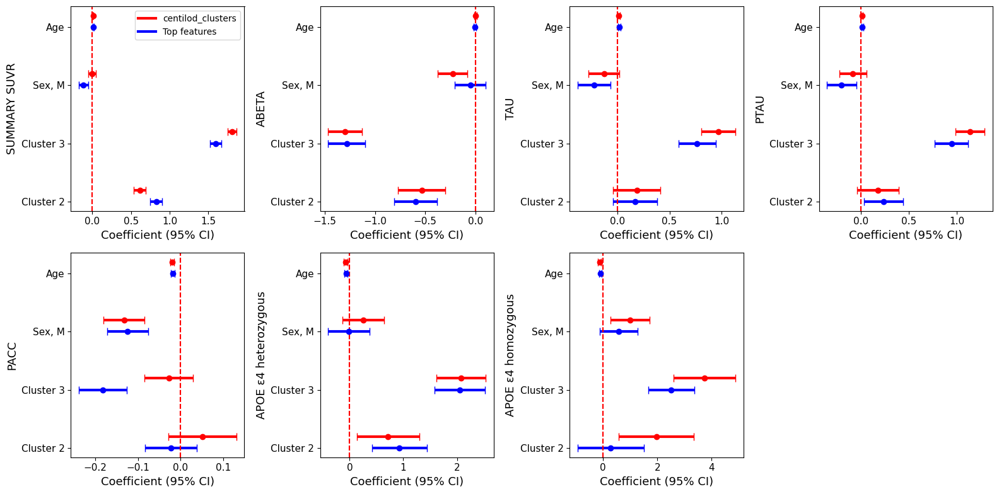

In [322]:
'''
import statsmodels.api as sm
import statsmodels.formula.api as smf

import numpy as np

fig, axes = plt.subplots(2, 4, figsize=(16, 8) )
axes = axes.flatten()

variables = ['SUMMARY_SUVR','ABETA', 'TAU','PTAU',  'PACC','APOE4']
names = ['SUMMARY SUVR','ABETA', 'TAU','PTAU',  'PACC', 'APOE ε4 heterozygous', 'APOE ε4 homozygous']

for i,var in enumerate(variables):
    # Features (independent variables) and target (dependent variable)
    #X = meta2_cleaned_noad_bl[['clusters','Age','sex_binary']]   # predictors
    #y = meta2_cleaned_noad_bl[i]            # response
    #pt = PowerTransformer(method='yeo-johnson')
    data = meta2_cleaned_noad_bl.dropna(subset=[var]).copy()
    
    data['APOE4'] = data['APOE4'].astype('category').cat.codes
    #data['95_4clusters'] = data['clusters95_4'].astype('category')
    #data[i] = pt.fit_transform(meta2_cleaned_noad_bl[[i]].dropna())
    #if i != 'PACC':
    #    data[i] = np.log(data[i])
        
    '''mask = np.isfinite(X).all(axis=1) & np.isfinite(y)
    X_clean = X[mask]
    y_clean = y[mask]'''

    # Add constant for intercept
    #X_clean = sm.add_constant(X_clean)

    # Fit model
    #model = sm.OLS(y_clean, X_clean).fit()
    if var == 'APOE4':
        model = smf.mnlogit(var + " ~ C(centilod_clusters) + Age + C(Sex)", data=data).fit()
        forest_plot_3clusters(coef = model.params[0], conf = model.conf_int().loc['1',:],ax = axes[i], ylabel = names[i],
                     color='red', ci_color='red', y_positions=[0.2,1.2,2.2,3.2])
        forest_plot_3clusters(coef = model.params[1],conf =model.conf_int().loc['2',:],ax = axes[i+1], ylabel = names[i+1],
                     color='red', ci_color='red', y_positions=[0.2,1.2,2.2,3.2])
    else:
        model = smf.ols(var+"~ C(centilod_clusters) + Age+C(Sex)", data=data).fit()
    
        forest_plot_3clusters(coef = model.params,conf =model.conf_int(),ax = axes[i], ylabel = names[i],
                     color='red', ci_color='red', y_positions=[0.2,1.2,2.2,3.2])
            
            


    
    if var == 'APOE4':
        model = smf.mnlogit(var + " ~ C(clusters_top_3) + Age + C(Sex)", data=data).fit()
        forest_plot_3clusters(coef = model.params[0], conf = model.conf_int().loc['1',:],ax = axes[i],
                     color='blue', ci_color='blue', y_positions=[0.0,1.0,2.0,3.0])
        forest_plot_3clusters(coef = model.params[1],conf =model.conf_int().loc['2',:],ax = axes[i+1],
                     color='blue', ci_color='blue', y_positions=[0.0,1.0,2.0,3.0])
    else:
        model = smf.ols(var+"~ C(clusters_top_3) + Age+C(Sex)", data=data).fit()
    
        forest_plot_3clusters(coef = model.params,conf =model.conf_int(),ax = axes[i],
                     color='blue', ci_color='blue', y_positions=[0.0,1.0,2.0,3.0])

axes[0].legend(
    handles=[
        plt.Line2D([0], [0], color='red', lw=3, label='centilod_clusters'),
        plt.Line2D([0], [0], color='blue', lw=3, label='Top features'),
    ],
    loc='upper right', frameon=True, fontsize=10
)

axes[-1].remove()


plt.tight_layout()

#plt.savefig(path + f'/forest_plot_clusters_sup_{date}.png', bbox_inches='tight')
#plt.savefig(path + f'/forest_plot_clusters_sup_{date}.svg', format='svg', bbox_inches='tight')

plt.show()'''

                            OLS Regression Results                            
Dep. Variable:           SUMMARY_SUVR   R-squared:                       0.529
Model:                            OLS   Adj. R-squared:                  0.528
Method:                 Least Squares   F-statistic:                     428.7
Date:                Thu, 09 Apr 2026   Prob (F-statistic):          1.20e-308
Time:                        14:12:27   Log-Likelihood:                -1926.9
No. Observations:                1911   AIC:                             3866.
Df Residuals:                    1905   BIC:                             3899.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                 -1

                            OLS Regression Results                            
Dep. Variable:                   PACC   R-squared:                       0.084
Model:                            OLS   Adj. R-squared:                  0.082
Method:                 Least Squares   F-statistic:                     34.97
Date:                Thu, 09 Apr 2026   Prob (F-statistic):           2.58e-34
Time:                        14:12:28   Log-Likelihood:                -1479.1
No. Observations:                1910   AIC:                             2970.
Df Residuals:                    1904   BIC:                             3004.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                  1

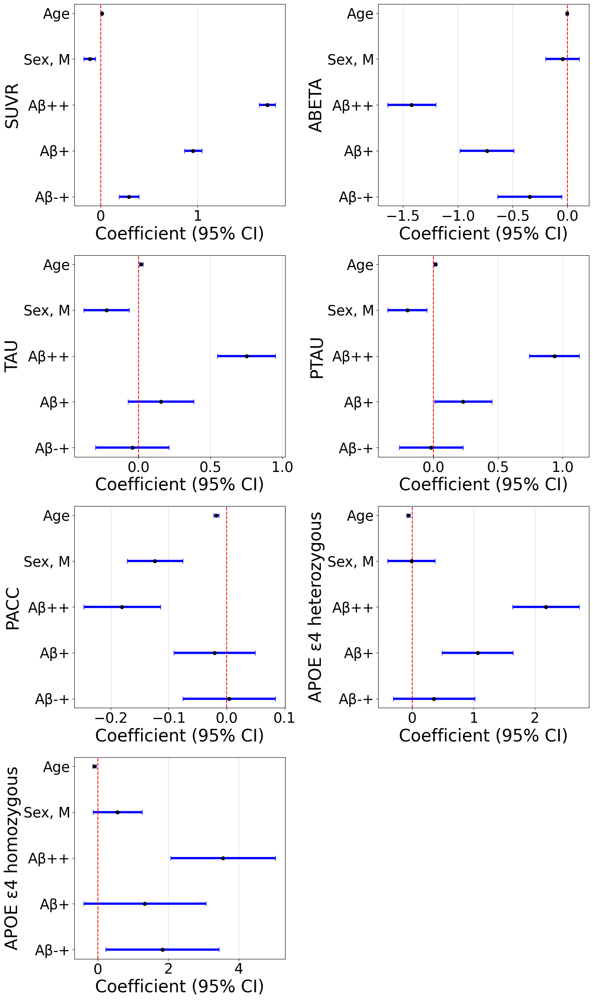

In [247]:
plt.rcParams.update({
    "font.size": 20,              # base font size
    "axes.titlesize": 32,         # title font
    "axes.labelsize": 30,         # x and y labels
    "xtick.labelsize": 25,        # x ticks
    "ytick.labelsize": 25,        # y ticks
    "legend.fontsize": 20        # legend
})

import statsmodels.api as sm
import statsmodels.formula.api as smf

import numpy as np

fig, axes = plt.subplots(4, 2, figsize=(15, 25) )
axes = axes.flatten()

variables = ['SUMMARY_SUVR','ABETA', 'TAU','PTAU',  'PACC','APOE4']
names = ['SUVR','ABETA', 'TAU','PTAU',  'PACC', 'APOE ε4 heterozygous', 'APOE ε4 homozygous']

for i,var in enumerate(variables):
    # Features (independent variables) and target (dependent variable)
    #X = meta2_cleaned_noad_bl[['clusters','Age','sex_binary']]   # predictors
    #y = meta2_cleaned_noad_bl[i]            # response
    #pt = PowerTransformer(method='yeo-johnson')
    data = meta2_cleaned_noad_bl.dropna(subset=[var]).copy()
    data['APOE4'] = data['APOE4'].astype('category').cat.codes
    
    #data[i] = pt.fit_transform(meta2_cleaned_noad_bl[[i]].dropna())
    #if i != 'PACC':
    #    data[i] = np.log(data[i])
        
    '''mask = np.isfinite(X).all(axis=1) & np.isfinite(y)
    X_clean = X[mask]
    y_clean = y[mask]'''

    # Add constant for intercept
    #X_clean = sm.add_constant(X_clean)

    # Fit model
    #model = sm.OLS(y_clean, X_clean).fit()
    if var == 'APOE4':
        model = smf.mnlogit(var + " ~ C(clusters_top_4) + Age + C(Sex)", data=data).fit()
        forest_plot_clusters(coef = model.params[0], conf = model.conf_int().loc['1',:],ax = axes[i], ylabel = names[i])
        forest_plot_clusters(coef = model.params[1],conf =model.conf_int().loc['2',:],ax = axes[i+1], ylabel = names[i+1])
        axes[i].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)
        axes[i+1].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)
    else:
        model = smf.ols(var+"~ C(clusters_top_4) + Age+C(Sex)", data=data).fit()
        axes[i].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)
    
        if i == 0:
            forest_plot_clusters(coef = model.params,conf =model.conf_int(),ax = axes[i], ylabel = names[i])
        else:
            forest_plot_clusters(coef = model.params,conf =model.conf_int(),ax = axes[i], ylabel = names[i])
    
    

    
    # Print full summary
    print(model.summary())
    print(model.pvalues)

for i in range(7):
    axes[i].set_yticklabels(['Aβ-+','Aβ+','Aβ++','Sex, M','Age'])
axes[-1].remove()
#axes[-2].remove()
plt.tight_layout()

#plt.savefig(path + f'/forest_plot_clusters_main_{date}.png', bbox_inches='tight')
#plt.savefig(path + f'/forest_plot_clusters_main_{date}.svg', format='svg', bbox_inches='tight')

plt.show()

                            OLS Regression Results                            
Dep. Variable:           SUMMARY_SUVR   R-squared:                       0.830
Model:                            OLS   Adj. R-squared:                  0.829
Method:                 Least Squares   F-statistic:                     1858.
Date:                Thu, 09 Apr 2026   Prob (F-statistic):               0.00
Time:                        16:49:00   Log-Likelihood:                -954.86
No. Observations:                1911   AIC:                             1922.
Df Residuals:                    1905   BIC:                             1955.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

                            OLS Regression Results                            
Dep. Variable:                   PACC   R-squared:                       0.068
Model:                            OLS   Adj. R-squared:                  0.066
Method:                 Least Squares   F-statistic:                     27.89
Date:                Thu, 09 Apr 2026   Prob (F-statistic):           2.40e-27
Time:                        16:49:00   Log-Likelihood:                -1495.5
No. Observations:                1910   AIC:                             3003.
Df Residuals:                    1904   BIC:                             3036.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

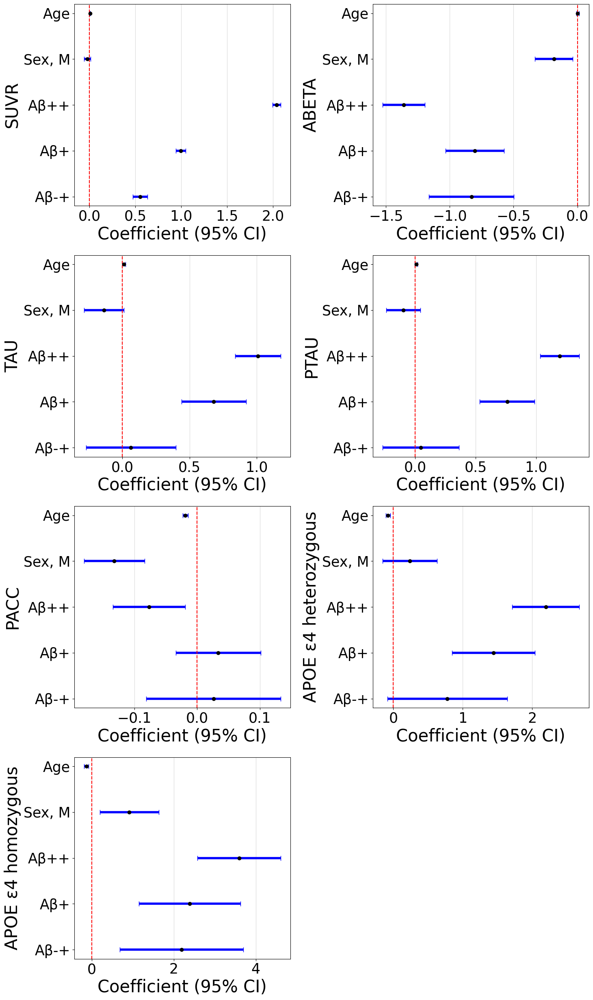

In [272]:
plt.rcParams.update({
    "font.size": 20,              # base font size
    "axes.titlesize": 32,         # title font
    "axes.labelsize": 30,         # x and y labels
    "xtick.labelsize": 25,        # x ticks
    "ytick.labelsize": 25,        # y ticks
    "legend.fontsize": 20        # legend
})

import statsmodels.api as sm
import statsmodels.formula.api as smf

import numpy as np

fig, axes = plt.subplots(4, 2, figsize=(15, 25) )
axes = axes.flatten()

variables = ['SUMMARY_SUVR','ABETA', 'TAU','PTAU',  'PACC','APOE4']
names = ['SUVR','ABETA', 'TAU','PTAU',  'PACC', 'APOE ε4 heterozygous', 'APOE ε4 homozygous']

for i,var in enumerate(variables):
    # Features (independent variables) and target (dependent variable)
    #X = meta2_cleaned_noad_bl[['clusters','Age','sex_binary']]   # predictors
    #y = meta2_cleaned_noad_bl[i]            # response
    #pt = PowerTransformer(method='yeo-johnson')
    data = meta2_cleaned_noad_bl.dropna(subset=[var]).copy()
    data['APOE4'] = data['APOE4'].astype('category').cat.codes
    
    #data[i] = pt.fit_transform(meta2_cleaned_noad_bl[[i]].dropna())
    #if i != 'PACC':
    #    data[i] = np.log(data[i])
        
    '''mask = np.isfinite(X).all(axis=1) & np.isfinite(y)
    X_clean = X[mask]
    y_clean = y[mask]'''

    # Add constant for intercept
    #X_clean = sm.add_constant(X_clean)

    # Fit model
    #model = sm.OLS(y_clean, X_clean).fit()
    if var == 'APOE4':
        model = smf.mnlogit(var + " ~ C(centiloid_class) + Age + C(Sex)", data=data).fit()
        forest_plot_clusters(coef = model.params[0], conf = model.conf_int().loc['1',:],ax = axes[i], ylabel = names[i])
        forest_plot_clusters(coef = model.params[1],conf =model.conf_int().loc['2',:],ax = axes[i+1], ylabel = names[i+1])
        axes[i].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)
        axes[i+1].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)
    else:
        model = smf.ols(var+"~ C(centiloid_class) + Age+C(Sex)", data=data).fit()
        axes[i].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)
    
        if i == 0:
            forest_plot_clusters(coef = model.params,conf =model.conf_int(),ax = axes[i], ylabel = names[i])
        else:
            forest_plot_clusters(coef = model.params,conf =model.conf_int(),ax = axes[i], ylabel = names[i])
    
    

    
    # Print full summary
    print(model.summary())
    print(model.pvalues)

for i in range(7):
    axes[i].set_yticklabels(['Aβ-+','Aβ+','Aβ++','Sex, M','Age'])
axes[-1].remove()
#axes[-2].remove()
plt.tight_layout()


#plt.show()

Optimization terminated successfully.
         Current function value: 0.744445
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.762076
         Iterations 8


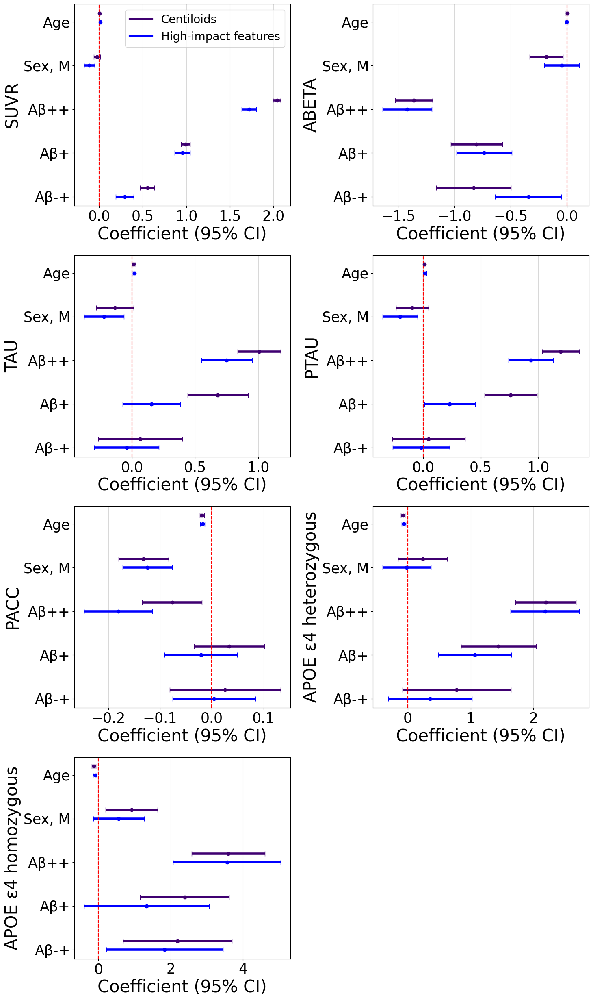

In [270]:
plt.rcParams.update({
    "font.size": 20,              # base font size
    "axes.titlesize": 32,         # title font
    "axes.labelsize": 30,         # x and y labels
    "xtick.labelsize": 25,        # x ticks
    "ytick.labelsize": 25,        # y ticks
    "legend.fontsize": 20        # legend
})

import statsmodels.api as sm
import statsmodels.formula.api as smf

import numpy as np

fig, axes = plt.subplots(4, 2, figsize=(15, 25) )
axes = axes.flatten()

variables = ['SUMMARY_SUVR','ABETA', 'TAU','PTAU',  'PACC','APOE4']
names = ['SUVR','ABETA', 'TAU','PTAU',  'PACC', 'APOE ε4 heterozygous', 'APOE ε4 homozygous']

for i,var in enumerate(variables):
    # Features (independent variables) and target (dependent variable)
    #X = meta2_cleaned_noad_bl[['clusters','Age','sex_binary']]   # predictors
    #y = meta2_cleaned_noad_bl[i]            # response
    #pt = PowerTransformer(method='yeo-johnson')
    data = meta2_cleaned_noad_bl.dropna(subset=[var]).copy()
    data['APOE4'] = data['APOE4'].astype('category').cat.codes
    
    
    
    if var == 'APOE4':
        model = smf.mnlogit(var + " ~ C(centiloid_class) + Age + C(Sex)", data=data).fit()
        forest_plot_clusters(coef = model.params[0], conf = model.conf_int().loc['1',:],ax = axes[i], ylabel = names[i],
                     color="#3F0071", ci_color="#3F0071", y_positions=[0.2,1.2,2.2,3.2,4.2])
        forest_plot_clusters(coef = model.params[1],conf =model.conf_int().loc['2',:],ax = axes[i+1], ylabel = names[i+1],
                     color="#3F0071", ci_color="#3F0071", y_positions=[0.2,1.2,2.2,3.2,4.2])
        axes[i].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)
        axes[i+1].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)
    else:
        model = smf.ols(var+"~ C(centiloid_class) + Age+C(Sex)", data=data).fit()
    
        forest_plot_clusters(coef = model.params,conf =model.conf_int(),ax = axes[i], ylabel = names[i],
                     color="#3F0071", ci_color="#3F0071", y_positions=[0.2,1.2,2.2,3.2,4.2])
        axes[i].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)    
            


    
    if var == 'APOE4':
        model = smf.mnlogit(var + " ~ C(clusters_top_4) + Age + C(Sex)", data=data).fit()
        forest_plot_clusters(coef = model.params[0], conf = model.conf_int().loc['1',:],ax = axes[i],
                     color='blue', ci_color='blue', y_positions=[0.0,1.0,2.0,3.0,4.0])
        forest_plot_clusters(coef = model.params[1],conf =model.conf_int().loc['2',:],ax = axes[i+1],
                     color='blue', ci_color='blue', y_positions=[0.0,1.0,2.0,3.0,4.0])
        axes[i].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)
        axes[i+1].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)
    else:
        model = smf.ols(var+"~ C(clusters_top_4) + Age+C(Sex)", data=data).fit()
    
        forest_plot_clusters(coef = model.params,conf =model.conf_int(),ax = axes[i],
                     color='blue', ci_color='blue', y_positions=[0.0,1.0,2.0,3.0,4.0])
        axes[i].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)

axes[0].legend(
    handles=[
        plt.Line2D([0], [0], color="#3F0071", lw=3, label='Centiloid'),
        plt.Line2D([0], [0], color='blue', lw=3, label='High-impact features'),
    ],
    loc='upper right', frameon=True
)

axes[-1].remove()
for i in range(7):
    axes[i].set_yticklabels(['Aβ-+','Aβ+','Aβ++','Sex, M','Age'])
    
    

#axes[-2].remove()
plt.tight_layout()

plt.savefig(path + f'/forest_plot_clusters_main_cent_{date}.png', bbox_inches='tight')
plt.savefig(path + f'/forest_plot_clusters_main_cent_{date}.svg', format='svg', bbox_inches='tight')

plt.show()

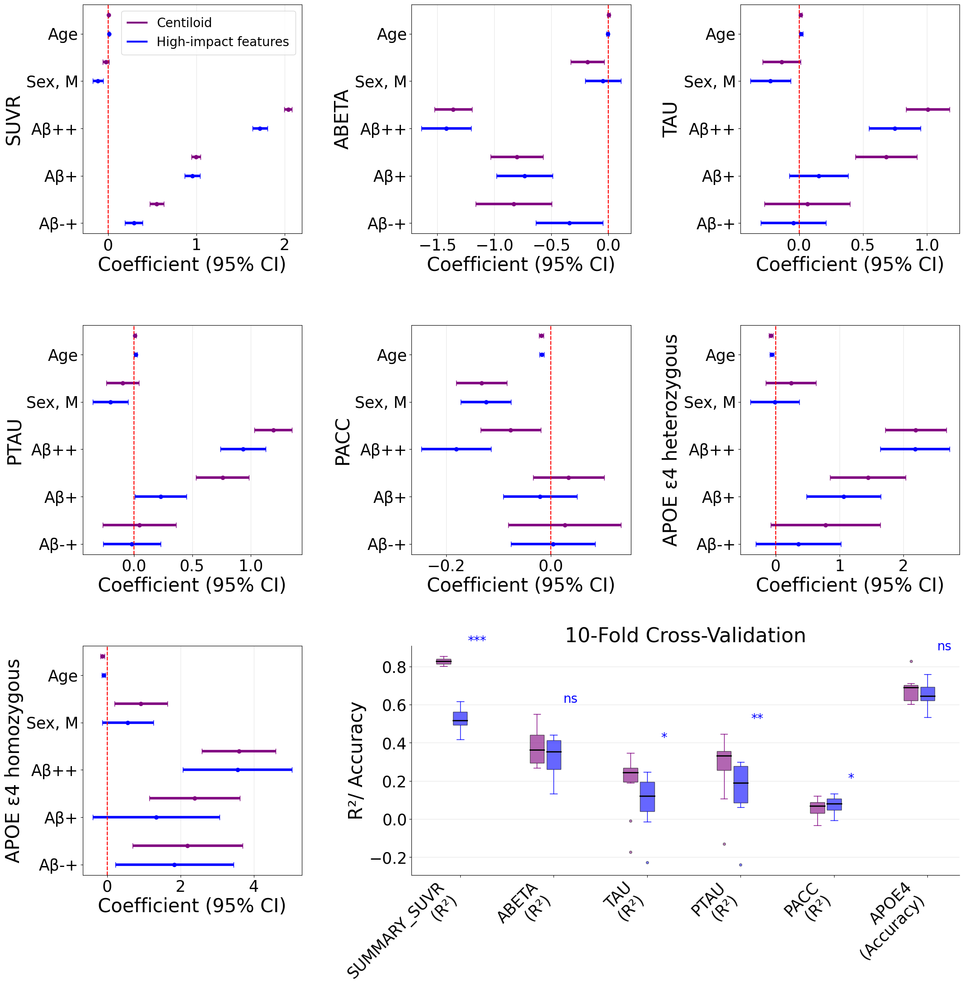

In [469]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import statsmodels.formula.api as smf

from matplotlib.gridspec import GridSpec
from matplotlib.patches import Patch
from sklearn.model_selection import KFold
from sklearn.metrics import r2_score, accuracy_score
from statsmodels.stats.multitest import multipletests
from scipy.stats import ttest_rel

# ======================
# Plot settings
# ======================
plt.rcParams.update({
    "font.size": 20,              # base font size
    "axes.titlesize": 32,         # title font
    "axes.labelsize": 30,         # x and y labels
    "xtick.labelsize": 25,        # x ticks
    "ytick.labelsize": 25,        # y ticks
    "legend.fontsize": 20        # legend
})
# ======================
# CV setup
# ======================
kf = KFold(n_splits=10, shuffle=True, random_state=42)
cv_results = []

# ======================
# Figure with GridSpec
# ======================
fig = plt.figure(figsize=(25,25))
gs  = GridSpec(3, 3, figure=fig, wspace=0.5, hspace=0.4)

# First 7 subplots
axes = [fig.add_subplot(gs[i // 3, i % 3]) for i in range(7)]

# R² / Accuracy panel spanning last 2 slots in row 2
ax_r2 = fig.add_subplot(gs[2, 1:])

# ======================
# Variables
# ======================
variables = ['SUMMARY_SUVR','ABETA','TAU','PTAU','PACC','APOE4']
names = ['SUVR','ABETA','TAU','PTAU','PACC',
         'APOE ε4 heterozygous','APOE ε4 homozygous']

# ======================
# Helpers
# ======================
def p_to_star(p):
    if p < 0.001:
        return "***"
    elif p < 0.01:
        return "**"
    elif p < 0.05:
        return "*"
    else:
        return "ns"

def whisker_top(folds):
    q1, q3 = np.percentile(folds, [25, 75])
    return min(max(folds), q3 + 1.5 * (q3 - q1))

# ======================
# Main loop
# ======================
for i, var in enumerate(variables):

    data = meta2_cleaned_noad_bl.dropna(subset=[var]).copy()
    data['APOE4'] = data['APOE4'].astype('category').cat.codes
    #data['95_4clusters'] = data['clusters95_4'].astype('category')

    # ======================
    # CV
    # ======================
    acc_cent, acc_hi = [], []
    r2_cent,  r2_hi  = [], []

    for train_idx, test_idx in kf.split(data):

        train = data.iloc[train_idx]
        test  = data.iloc[test_idx]

        if var == 'APOE4':
            for acc_list, formula_var in zip(
                [acc_cent, acc_hi],
                ['centiloid_class', 'clusters_top_4']
            ):
                m = smf.mnlogit(
                    f"{var} ~ C({formula_var}) + Age + C(Sex)", data=train
                ).fit(disp=0)
                preds = m.predict(test).values.argmax(axis=1)
                acc_list.append(accuracy_score(test[var], preds))

        else:
            for r2_list, formula_var in zip(
                [r2_cent, r2_hi],
                ['centiloid_class', 'clusters_top_4']
            ):
                m = smf.ols(
                    f"{var} ~ C({formula_var}) + Age + C(Sex)", data=train
                ).fit()
                r2_list.append(r2_score(test[var], m.predict(test)))

    if var == 'APOE4':
        acc_cent = np.array(acc_cent)
        acc_hi   = np.array(acc_hi)

        p_hi_vs_cent = ttest_rel(acc_hi,  acc_cent).pvalue

        cv_results.append({
            "Variable":       var,
            "metric":         "Accuracy",
            "R2_cent_mean":   acc_cent.mean(),
            "R2_hi_mean":     acc_hi.mean(),
            "R2_cent_std":    acc_cent.std(),
            "R2_hi_std":      acc_hi.std(),
            "R2_cent_folds":  acc_cent.tolist(),
            "R2_hi_folds":    acc_hi.tolist(),
            "p_hi_vs_cent":   p_hi_vs_cent
        })

    else:
        r2_cent = np.array(r2_cent)
        r2_hi   = np.array(r2_hi)

        p_hi_vs_cent = ttest_rel(r2_hi,  r2_cent).pvalue

        cv_results.append({
            "Variable":       var,
            "metric":         "R²",
            "R2_cent_mean":   r2_cent.mean(),
            "R2_hi_mean":     r2_hi.mean(),
            "R2_cent_std":    r2_cent.std(),
            "R2_hi_std":      r2_hi.std(),
            "R2_cent_folds":  r2_cent.tolist(),
            "R2_hi_folds":    r2_hi.tolist(),
            "p_hi_vs_cent":   p_hi_vs_cent
        })

    # ======================
    # Forest plots
    # ======================

    # Centiloid
    if var == 'APOE4':
        model = smf.mnlogit(f"{var} ~ C(centiloid_class) + Age + C(Sex)", data=data).fit(disp=0)

        forest_plot_clusters(model.params[0], model.conf_int().loc['1',:], ax=axes[i],
                             ylabel=names[i], color='purple', ci_color='purple',
                             y_positions=[0.4,1.4,2.4,3.4,4.4])

        forest_plot_clusters(model.params[1], model.conf_int().loc['2',:], ax=axes[i+1],
                             ylabel=names[i+1], color='purple', ci_color='purple',
                             y_positions=[0.4,1.4,2.4,3.4,4.4])

        axes[i+1].grid(axis='x', alpha=0.3)

    else:
        model = smf.ols(f"{var} ~ C(centiloid_class) + Age + C(Sex)", data=data).fit()

        forest_plot_clusters(model.params, model.conf_int(), ax=axes[i],
                             ylabel=names[i], color='purple', ci_color='purple',
                             y_positions=[0.4,1.4,2.4,3.4,4.4])

    axes[i].grid(axis='x', alpha=0.3)

   

    # High-impact
    if var == 'APOE4':
        model = smf.mnlogit(f"{var} ~ C(clusters_top_4) + Age + C(Sex)", data=data).fit(disp=0)

        forest_plot_clusters(model.params[0], model.conf_int().loc['1',:], ax=axes[i],
                             color='blue', ci_color='blue',
                             y_positions=[0.0,1.0,2.0,3.0,4.0])

        forest_plot_clusters(model.params[1], model.conf_int().loc['2',:], ax=axes[i+1],
                             color='blue', ci_color='blue',
                             y_positions=[0.0,1.0,2.0,3.0,4.0])

    else:
        model = smf.ols(f"{var} ~ C(clusters_top_4) + Age + C(Sex)", data=data).fit()

        forest_plot_clusters(model.params, model.conf_int(), ax=axes[i],
                             color='blue', ci_color='blue',
                             y_positions=[0.0,1.0,2.0,3.0,4.0])

    axes[i].grid(axis='x', alpha=0.3)

# ======================
# FDR correction (5 vars × 2 comparisons = 10 tests)
# ======================
cv_df = pd.DataFrame(cv_results)

all_pvals = []
for _, row in cv_df.iterrows():
    all_pvals.append(row["p_hi_vs_cent"])

_, pvals_corrected, _, _ = multipletests(all_pvals, method='fdr_bh')


cv_df["p_hi_vs_cent_fdr"] = pvals_corrected

# ======================
# GLOBAL METRIC PANEL — boxplots
# ======================
n_vars  = len(cv_df)
x       = np.arange(n_vars) * 1.4
width   = 0.25
offsets = [-width, 0, width]
colors  = ['purple', 'blue']
labels  = ['Centiloid', 'High-impact']
keys    = ['R2_cent_folds', 'R2_hi_folds']

for j, (key, color) in enumerate(zip(keys, colors)):
    fold_data = [cv_df.loc[i, key] for i in range(n_vars)]
    ax_r2.boxplot(
        fold_data,
        positions=x + offsets[j],
        widths=width * 0.85,
        patch_artist=True,
        boxprops=dict(facecolor=color, alpha=0.6),
        medianprops=dict(color='black', linewidth=2),
        whiskerprops=dict(color=color),
        capprops=dict(color=color),
        flierprops=dict(marker='o', markerfacecolor=color, markersize=4, alpha=0.5),
        manage_ticks=False,
    )

# Remove any auto-generated empty legend from boxplot
if ax_r2.get_legend():
    ax_r2.get_legend().remove()

ax_r2.set_xticks(x)
ax_r2.set_xticklabels(
    [f"{row['Variable']}\n({row['metric']})" for _, row in cv_df.iterrows()],
    rotation=45, ha='right'
)
ax_r2.set_ylabel("R²/ Accuracy")
ax_r2.set_title("10-Fold Cross-Validation")
ax_r2.spines['top'].set_visible(False)
ax_r2.spines['right'].set_visible(False)
ax_r2.grid(axis='y', alpha=0.3)

# Add clean legend with Patch handles only
legend_handles = [
    Patch(facecolor='purple', alpha=0.6, label='Centiloids'),
    Patch(facecolor='blue',   alpha=0.6, label='High-impact')
]
'''ax_r2.legend(
    handles=legend_handles,
    loc='upper right',
    frameon=True,
    fontsize=16
)'''

# ======================
# Significance stars (FDR-corrected)
# ======================
for idx, row in cv_df.iterrows():

    y_max = max(
        whisker_top(row["R2_cent_folds"]),
        whisker_top(row["R2_hi_folds"])
    )

    
    # High-impact vs Centiloids — blue, higher
    ax_r2.text(
        x[idx] + offsets[2],
        y_max + 0.06,
        p_to_star(row["p_hi_vs_cent_fdr"]),
        ha='center', color='blue'
    )

# ======================
# Legend for forest plots — placed inside axes[0] without overflow
# ======================
axes[0].legend(
    handles=[
        plt.Line2D([0], [0], color='purple', lw=3, label='Centiloid'),
        plt.Line2D([0], [0], color='blue',   lw=3, label='High-impact features')
    ],
    loc='upper right',       # bottom corner avoids top-heavy overlap
    frameon=True,             # slightly smaller to fit within subplot
    handlelength=1.5,
    borderpad=0.5,
)

# ======================
# Y tick labels for forest plots
# ======================
for i in range(7):
    axes[i].set_yticklabels(['Aβ-+','Aβ+','Aβ++','Sex, M','Age'])

plt.savefig(path + f'/forest_plot_clusters_main_cent2_{date}.png', bbox_inches='tight')
plt.savefig(path + f'/forest_plot_clusters_main_cent2_{date}.svg', format='svg', bbox_inches='tight')

plt.show()

# ======================
# Save CV results
# ======================
cv_df.to_csv(path + f'/cv_r2_comparison_{date}.csv', index=False)

In [447]:
pvals_corrected

array([3.19880922e-07, 1.88133599e-01, 1.00329277e-02, 1.41674218e-03,
       1.00329277e-02, 2.23489039e-01])

In [278]:
import statsmodels.formula.api as smf
from scipy import stats

variables = ['SUMMARY_SUVR','TAU','PTAU']

for var in variables:
    
    data = meta2_cleaned_noad_bl.dropna(subset=[var]).copy()

    print(f"\n=== Variable: {var} ===")

    model_main = smf.ols(
        f"{var} ~ C(centiloid_class) + C(clusters_top_4) + Age + C(Sex)",
        data=data
    ).fit()

    model_inter = smf.ols(
        f"{var} ~ C(centiloid_class) * C(clusters_top_4) + Age + C(Sex)",
        data=data
    ).fit()

    # 🔍 Get all interaction terms automatically
    interaction_terms = [
        term for term in model_inter.params.index
        if ":" in term and "centiloid_class" in term and "clusters_top_4" in term
    ]

    print("\nCluster-specific interaction tests:")
    
    for term in interaction_terms:
        test = model_inter.wald_test(f"{term} = 0")
        print(f"{term}: p = {test.pvalue:.3e}")

    # ✅ Likelihood ratio test (global)
    lr_stat = 2 * (model_inter.llf - model_main.llf)
    df_diff = model_inter.df_model - model_main.df_model
    p_value = stats.chi2.sf(lr_stat, df_diff)

    print(f"\nGlobal interaction test:")
    print(f"LR stat: {lr_stat:.3f}")
    print(f"df: {df_diff}")
    print(f"p-value: {p_value:.3e}")


=== Variable: SUMMARY_SUVR ===

Cluster-specific interaction tests:
C(centiloid_class)[T.2.0]:C(clusters_top_4)[T.2]: p = 5.776e-01
C(centiloid_class)[T.3.0]:C(clusters_top_4)[T.2]: p = 8.260e-01
C(centiloid_class)[T.4.0]:C(clusters_top_4)[T.2]: p = 4.090e-01
C(centiloid_class)[T.2.0]:C(clusters_top_4)[T.3]: p = 9.354e-01
C(centiloid_class)[T.3.0]:C(clusters_top_4)[T.3]: p = 4.890e-01
C(centiloid_class)[T.4.0]:C(clusters_top_4)[T.3]: p = 4.463e-02
C(centiloid_class)[T.2.0]:C(clusters_top_4)[T.4]: p = 2.639e-01
C(centiloid_class)[T.3.0]:C(clusters_top_4)[T.4]: p = 2.968e-01
C(centiloid_class)[T.4.0]:C(clusters_top_4)[T.4]: p = 3.491e-02

Global interaction test:
LR stat: 34.394
df: 9.0
p-value: 7.617e-05

=== Variable: TAU ===


/csc/epitkane/home/atagmazi/.conda/envs/atagmazi_gpu8/lib/python3.7/site-packages/statsmodels/base/model.py:1894: FutureWarning: The behavior of wald_test will change after 0.14 to returning scalar test statistic values. To get the future behavior now, set scalar to True. To silence this message while retaining the legacy behavior, set scalar to False.
  FutureWarning



Cluster-specific interaction tests:
C(centiloid_class)[T.2.0]:C(clusters_top_4)[T.2]: p = 7.536e-02
C(centiloid_class)[T.3.0]:C(clusters_top_4)[T.2]: p = 2.195e-01
C(centiloid_class)[T.4.0]:C(clusters_top_4)[T.2]: p = 7.573e-01
C(centiloid_class)[T.2.0]:C(clusters_top_4)[T.3]: p = 3.611e-01
C(centiloid_class)[T.3.0]:C(clusters_top_4)[T.3]: p = 7.484e-01
C(centiloid_class)[T.4.0]:C(clusters_top_4)[T.3]: p = 2.023e-01
C(centiloid_class)[T.2.0]:C(clusters_top_4)[T.4]: p = 8.881e-02
C(centiloid_class)[T.3.0]:C(clusters_top_4)[T.4]: p = 6.484e-01
C(centiloid_class)[T.4.0]:C(clusters_top_4)[T.4]: p = 2.821e-01

Global interaction test:
LR stat: 11.230
df: 9.0
p-value: 2.603e-01

=== Variable: PTAU ===

Cluster-specific interaction tests:


/csc/epitkane/home/atagmazi/.conda/envs/atagmazi_gpu8/lib/python3.7/site-packages/statsmodels/base/model.py:1894: FutureWarning: The behavior of wald_test will change after 0.14 to returning scalar test statistic values. To get the future behavior now, set scalar to True. To silence this message while retaining the legacy behavior, set scalar to False.
  FutureWarning
/csc/epitkane/home/atagmazi/.conda/envs/atagmazi_gpu8/lib/python3.7/site-packages/statsmodels/base/model.py:1894: FutureWarning: The behavior of wald_test will change after 0.14 to returning scalar test statistic values. To get the future behavior now, set scalar to True. To silence this message while retaining the legacy behavior, set scalar to False.
  FutureWarning


C(centiloid_class)[T.2.0]:C(clusters_top_4)[T.2]: p = 3.960e-02
C(centiloid_class)[T.3.0]:C(clusters_top_4)[T.2]: p = 3.184e-01
C(centiloid_class)[T.4.0]:C(clusters_top_4)[T.2]: p = 6.151e-01
C(centiloid_class)[T.2.0]:C(clusters_top_4)[T.3]: p = 2.077e-01
C(centiloid_class)[T.3.0]:C(clusters_top_4)[T.3]: p = 7.932e-01
C(centiloid_class)[T.4.0]:C(clusters_top_4)[T.3]: p = 1.157e-01
C(centiloid_class)[T.2.0]:C(clusters_top_4)[T.4]: p = 4.140e-02
C(centiloid_class)[T.3.0]:C(clusters_top_4)[T.4]: p = 7.672e-01
C(centiloid_class)[T.4.0]:C(clusters_top_4)[T.4]: p = 1.718e-01

Global interaction test:
LR stat: 13.157
df: 9.0
p-value: 1.557e-01


In [280]:
print(model_main.summary())

                            OLS Regression Results                            
Dep. Variable:                   PTAU   R-squared:                       0.329
Model:                            OLS   Adj. R-squared:                  0.319
Method:                 Least Squares   F-statistic:                     32.05
Date:                Fri, 10 Apr 2026   Prob (F-statistic):           5.71e-41
Time:                        10:57:28   Log-Likelihood:                -643.22
No. Observations:                 531   AIC:                             1304.
Df Residuals:                     522   BIC:                             1343.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

In [185]:
3.357867e-04

0.0003357867

In [266]:
meta2_cleaned_noad_bl.columns

Index(['Project', 'Phase', 'MRI_subID', 'Sex', 'Weight', 'Research.Group',
       'VISCODE', 'VISCODE2', 'Study.Date', 'Age', 'Modality', 'Description',
       'Imaging.Protocol', 'Image.Data.ID', 'modality_subtype', 'PATH',
       'PET_PATH_normalised', 'AMYLOID_STATUS', 'SUMMARY_SUVR', 'APOE4',
       'ABETA', 'TAU', 'PTAU', 'MMSE', 'ADAS11', 'ADAS13', 'RAVLT_immediate',
       'LDELTOTAL', 'DIGITSCOR', 'TRABSCOR', 'PACC', '95_4clusters',
       'top_4clusters', 'umap_X_all', 'umap_Y_all', 'rank_parabola_all',
       'umap_X_95', 'umap_Y_95', 'rank_parabola_95', 'umap_X_top',
       'umap_Y_top', 'rank_parabola_top', 'clusters95_4', 'clusters_ top_4',
       'clusters_top_4'],
      dtype='object')

# Survival models

In [87]:
ADNI_key.loc[ADNI_key.DX_bl == 'LMCI','DX_bl'] ='MCI'
ADNI_key.loc[ADNI_key.DX_bl == 'EMCI','DX_bl'] ='MCI'

ADNI_key.loc[ADNI_key.DX == 'Dementia','DX'] ='AD'

In [88]:
ADNI_key

,COLPROT,ORIGPROT,PTID,SITE,VISCODE,EXAMDATE,DX_bl,AGE,PTGENDER,PTEDUCAT,...,PTAU_bl,FDG_bl,PIB_bl,AV45_bl,FBB_bl,Years_bl,Month_bl,Month,M,update_stamp
RID,,,,,,,,,,,,,,,,,,,,,
2,ADNI1,ADNI1,011_S_0002,11,bl,2005-09-08,CN,74.3,Male,16,...,NaN,1.33615,NaN,NaN,NaN,0.000000,0.00000,0,0,2023-07-07 04:59:40.0
3,ADNI1,ADNI1,011_S_0003,11,bl,2005-09-12,AD,81.3,Male,18,...,22.83,1.10860,NaN,NaN,NaN,0.000000,0.00000,0,0,2023-07-07 04:59:40.0
3,ADNI1,ADNI1,011_S_0003,11,m06,2006-03-13,AD,81.3,Male,18,...,22.83,1.10860,NaN,NaN,NaN,0.498289,5.96721,6,6,2023-07-07 04:59:40.0
3,ADNI1,ADNI1,011_S_0003,11,m12,2006-09-12,AD,81.3,Male,18,...,22.83,1.10860,NaN,NaN,NaN,0.999316,11.96720,12,12,2023-07-07 04:59:40.0
3,ADNI1,ADNI1,011_S_0003,11,m24,2007-09-12,AD,81.3,Male,18,...,22.83,1.10860,NaN,NaN,NaN,1.998630,23.93440,24,24,2023-07-07 04:59:40.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4349,ADNI3,ADNI2,018_S_4349,18,m138,2023-03-30,CN,71.4,Female,16,...,17.82,1.33353,NaN,1.0344,NaN,11.351100,135.93400,138,138,2023-08-22 04:58:56.0
6801,ADNI3,ADNI3,041_S_6801,41,m42,2023-06-30,SMC,61.0,Female,12,...,NaN,NaN,NaN,1.1509,NaN,3.701570,44.32790,42,42,2023-08-25 05:00:03.0
5097,ADNI3,ADNI2,041_S_5097,41,m126,2023-08-16,SMC,67.5,Male,16,...,16.48,1.20863,NaN,1.1086,NaN,10.371000,124.19700,126,126,2023-08-26 05:00:28.0


In [89]:
ADNI_key.DX_bl.value_counts()

MCI    8270
CN     4904
AD     1751
SMC    1485
Name: DX_bl, dtype: int64

In [140]:
ADNI_key[ADNI_key.DX_bl == 'MCI'].DX.value_counts()

MCI    4634
AD     1124
CN      321
Name: DX, dtype: int64

In [141]:
ADNI_key.columns

Index(['COLPROT', 'ORIGPROT', 'PTID', 'SITE', 'VISCODE', 'EXAMDATE', 'DX_bl',
       'AGE', 'PTGENDER', 'PTEDUCAT',
       ...
       'PTAU_bl', 'FDG_bl', 'PIB_bl', 'AV45_bl', 'FBB_bl', 'Years_bl',
       'Month_bl', 'Month', 'M', 'update_stamp'],
      dtype='object', length=115)

In [93]:
ADNI_key_sel = ADNI_key[ADNI_key['PTID'].isin(meta2_cleaned_noad_bl['MRI_subID'])].copy()

In [94]:
ids = ADNI_key_sel['PTID'].value_counts()[lambda x: x > 1]


In [95]:
ids

027_S_2245    16
037_S_4214    16
027_S_2219    16
022_S_2379    16
127_S_2234    16
              ..
073_S_4540     2
016_S_4601     2
109_S_2237     2
053_S_5287     2
141_S_4907     2
Name: PTID, Length: 574, dtype: int64

In [96]:
ADNI_key_sel.shape

(4895, 115)

In [97]:
temp

,COLPROT,ORIGPROT,PTID,SITE,VISCODE,EXAMDATE,DX_bl,AGE,PTGENDER,PTEDUCAT,...,PTAU_bl,FDG_bl,PIB_bl,AV45_bl,FBB_bl,Years_bl,Month_bl,Month,M,update_stamp
RID,,,,,,,,,,,,,,,,,,,,,
2045,ADNIGO,ADNIGO,128_S_2045,128,bl,2010-10-15,EMCI,72.3,Male,16,...,20.5,1.22925,NaN,1.4796,NaN,0.0,0.0,0,0,2023-07-07 04:59:51.0


In [98]:
[int(x[1:]) for x in temp[temp['VISCODE']!='bl']['VISCODE']]

[]

In [140]:
# Define centiloid thresholds
conditions = [
    meta2_cleaned_noad_bl['CENTILOIDS'] <= 15,                                          # negative 1
    (meta2_cleaned_noad_bl['CENTILOIDS'] > 15) & (meta2_cleaned_noad_bl['CENTILOIDS'] <= 25),  # uncertain 2
    (meta2_cleaned_noad_bl['CENTILOIDS'] > 25) & (meta2_cleaned_noad_bl['CENTILOIDS'] <= 50),  # moderate positive 3
    meta2_cleaned_noad_bl['CENTILOIDS'] > 50                                             # high positive 4
]

labels = [1, 2, 3,4]

meta2_cleaned_noad_bl['centiloid_class'] = np.select(conditions, labels, default=np.nan)

In [190]:
meta_survival = pd.DataFrame()
max_observation = 0
for i,ID in enumerate(ids.index):
    temp = ADNI_key_sel[ADNI_key_sel.PTID == ID].copy()
    
    temp =  temp.sort_values(by='Month')
    '''temp = temp.sort_values(
    by=['VISCODE', 'AGE'],
    key=lambda col: col.map(lambda x: 0 if x == 'bl' else 1) if col.name == 'VISCODE' else col
    ) '''#sorting by age and so baseline will be always on the first place
    
    meta_survival.loc[i,'subID']= ID
    meta_survival.loc[i,'Sex'] = temp['PTGENDER'].values[0]
    meta_survival.loc[i,'cluster_95'] = meta2_cleaned_noad_bl[meta2_cleaned_noad_bl.MRI_subID == ID].clusters95_4.values[0]
    meta_survival.loc[i,'cluster_top'] = meta2_cleaned_noad_bl[meta2_cleaned_noad_bl.MRI_subID == ID].clusters_top_4.values[0]
    meta_survival.loc[i,'centiloid_cluster'] = meta2_cleaned_noad_bl[meta2_cleaned_noad_bl.MRI_subID == ID].centiloid_class.values[0]
    for j in range(temp.shape[0]):
        if temp['Month'].iloc[j] > 72:
            break
        meta_survival.loc[i,'cl_group_'+str(j)] = temp['DX'].iloc[j]
        meta_survival.loc[i,'viscode_'+str(j)] = temp['VISCODE'].iloc[j]
        meta_survival.loc[i,'observ_monthes_'+str(j)] = temp['Month'].iloc[j]
        
        meta_survival.loc[i,'age_'+str(j)] = temp['AGE'].iloc[j]
        
        if j>0:
            meta_survival.loc[i,'observ_monthes_'+str(j)] = temp['Month'].iloc[j]
            meta_survival.loc[i,'age_'+str(j)] = temp['AGE'].iloc[j]+(meta_survival.loc[i,'observ_monthes_'+str(j)]/12)
            
            if j>max_observation:
                max_observation = j
        


In [113]:
meta2_cleaned_noad_bl.columns

Index(['Project', 'Phase', 'MRI_subID', 'Sex', 'Weight', 'Research.Group',
       'VISCODE', 'VISCODE2', 'Study.Date', 'Age', 'Modality', 'Description',
       'Imaging.Protocol', 'Image.Data.ID', 'modality_subtype', 'PATH',
       'PET_PATH_normalised', 'AMYLOID_STATUS', 'SUMMARY_SUVR', 'CENTILOIDS',
       'APOE4', 'ABETA', 'TAU', 'PTAU', 'MMSE', 'ADAS11', 'ADAS13',
       'RAVLT_immediate', 'LDELTOTAL', 'DIGITSCOR', 'TRABSCOR', 'PACC',
       'umap_X_all', 'umap_Y_all', 'rank_parabola_all', 'umap_X_95',
       'umap_Y_95', 'rank_parabola_95', 'umap_X_top', 'umap_Y_top',
       'rank_parabola_top', 'clusters95_4', 'clusters_top_4',
       'clusters_top_3'],
      dtype='object')

In [126]:
meta2_cleaned_noad_bl.centiloid_class.value_counts()

3.0    821
0.0    578
2.0    399
1.0    113
Name: centiloid_class, dtype: int64

In [128]:
meta_survival

,subID,Sex,cluster_95,cluster_top,centiloid_cluster,cl_group_0,viscode_0,observ_monthes_0,age_0,cl_group_1,...,observ_monthes_9,age_9,cl_group_10,viscode_10,observ_monthes_10,age_10,cl_group_11,viscode_11,observ_monthes_11,age_11
0,027_S_2245,Female,2.0,2.0,0.0,MCI,bl,0.0,57.0,NaN,...,60.0,62.0,MCI,m72,72.0,63.0,NaN,NaN,NaN,NaN
1,037_S_4214,Male,1.0,1.0,0.0,MCI,bl,0.0,74.2,NaN,...,66.0,79.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,027_S_2219,Male,1.0,2.0,1.0,MCI,bl,0.0,74.3,NaN,...,60.0,79.3,MCI,m72,72.0,80.3,NaN,NaN,NaN,NaN
3,022_S_2379,Male,1.0,1.0,0.0,MCI,bl,0.0,66.0,NaN,...,60.0,71.0,CN,m72,72.0,72.0,NaN,NaN,NaN,NaN
4,127_S_2234,Female,2.0,1.0,0.0,MCI,bl,0.0,63.6,NaN,...,60.0,68.6,CN,m72,72.0,69.6,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
569,073_S_4540,Female,1.0,1.0,0.0,MCI,bl,0.0,71.1,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
570,016_S_4601,Male,1.0,4.0,0.0,MCI,bl,0.0,72.8,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
571,109_S_2237,Male,1.0,1.0,0.0,MCI,bl,0.0,65.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
572,053_S_5287,Female,1.0,1.0,2.0,CN,bl,0.0,78.9,CN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [191]:
meta_survival = meta_survival.dropna(axis=1, how='all')

In [130]:
meta_survival['cl_group_0'].value_counts()

MCI    349
CN     225
Name: cl_group_0, dtype: int64

In [185]:
ad_bl = meta_survival[meta_survival['cl_group_0']=='AD'] # checking that there is no AD at baseline
#ad_bl = meta_survival[meta_survival['cl_group_0']=='MCI']

In [186]:
#meta_survival = meta_survival[meta_survival.cl_group_0!= 'MCI'] ##!!!!!!!!!!!!
#meta_survival.reset_index(drop=True, inplace = True)

In [187]:
meta_survival

,subID,Sex,cluster_95,cluster_top,centiloid_cluster,cl_group_0,viscode_0,observ_monthes_0,age_0,cl_group_1,...,observ_monthes_9,age_9,cl_group_10,viscode_10,observ_monthes_10,age_10,cl_group_11,viscode_11,observ_monthes_11,age_11
0,033_S_4177,Male,1.0,3.0,1.0,CN,bl,0.0,84.9,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,037_S_4028,Female,2.0,2.0,1.0,CN,bl,0.0,63.5,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,127_S_4148,Male,1.0,1.0,1.0,CN,bl,0.0,73.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,021_S_4276,Female,1.0,1.0,1.0,CN,bl,0.0,73.9,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,009_S_4388,Male,1.0,3.0,1.0,CN,bl,0.0,66.8,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220,036_S_5248,Male,1.0,1.0,1.0,CN,bl,0.0,74.3,CN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
221,127_S_5218,Female,1.0,1.0,1.0,CN,bl,0.0,82.5,CN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
222,153_S_5267,Female,2.0,3.0,2.0,CN,bl,0.0,65.8,CN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
223,041_S_5204,Female,3.0,4.0,4.0,CN,bl,0.0,76.8,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [133]:
ADNI_key_sel[ADNI_key_sel.PTID == '098_S_2079']['VISCODE'].values[1:]

array(['m06', 'm03', 'm72', 'm60', 'm48', 'm42', 'm36', 'm30', 'm24',
       'm18', 'm12', 'm96', 'm108', 'm120', 'm132'], dtype=object)

In [134]:
for k in ADNI_key_sel[ADNI_key_sel.PTID == '098_S_2079']['VISCODE']:
    print(k[1:])

l
06
03
72
60
48
42
36
30
24
18
12
96
108
120
132


In [135]:
meta_survival

,subID,Sex,cluster_95,cluster_top,centiloid_cluster,cl_group_0,viscode_0,observ_monthes_0,age_0,cl_group_1,...,observ_monthes_9,age_9,cl_group_10,viscode_10,observ_monthes_10,age_10,cl_group_11,viscode_11,observ_monthes_11,age_11
0,027_S_2245,Female,2.0,2.0,0.0,MCI,bl,0.0,57.0,NaN,...,60.0,62.0,MCI,m72,72.0,63.0,NaN,NaN,NaN,NaN
1,037_S_4214,Male,1.0,1.0,0.0,MCI,bl,0.0,74.2,NaN,...,66.0,79.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,027_S_2219,Male,1.0,2.0,1.0,MCI,bl,0.0,74.3,NaN,...,60.0,79.3,MCI,m72,72.0,80.3,NaN,NaN,NaN,NaN
3,022_S_2379,Male,1.0,1.0,0.0,MCI,bl,0.0,66.0,NaN,...,60.0,71.0,CN,m72,72.0,72.0,NaN,NaN,NaN,NaN
4,127_S_2234,Female,2.0,1.0,0.0,MCI,bl,0.0,63.6,NaN,...,60.0,68.6,CN,m72,72.0,69.6,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
569,073_S_4540,Female,1.0,1.0,0.0,MCI,bl,0.0,71.1,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
570,016_S_4601,Male,1.0,4.0,0.0,MCI,bl,0.0,72.8,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
571,109_S_2237,Male,1.0,1.0,0.0,MCI,bl,0.0,65.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
572,053_S_5287,Female,1.0,1.0,2.0,CN,bl,0.0,78.9,CN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [163]:
summary = meta_survival.groupby(['cluster_95', 'cl_group_0']).size().reset_index(name='count')
print(summary)


   cluster_95 cl_group_0  count
0         1.0         CN    128
1         2.0         CN     48
2         3.0         CN      8
3         4.0         CN     41


In [156]:
summary = meta_survival.groupby(['cluster_top', 'cl_group_0']).size().reset_index(name='count')
print(summary)


   cluster_top cl_group_0  count
0          1.0         CN     83
1          1.0        MCI     67
2          2.0         CN     42
3          2.0        MCI     47
4          3.0         CN     50
5          3.0        MCI     73
6          4.0         CN     50
7          4.0        MCI    162


In [195]:
# Preparing input for survival models
survival_input = pd.DataFrame()

for i in range(meta_survival.shape[0]):
    survival_input.loc[i,'subID'] = meta_survival.loc[i,'subID']
    survival_input.loc[i,'Sex'] = meta_survival.loc[i,'Sex']
    survival_input.loc[i,'cluster_95'] = meta_survival.loc[i,'cluster_95']
    survival_input.loc[i,'cluster_top'] = meta_survival.loc[i,'cluster_top']
    survival_input.loc[i,'centiloid_cluster'] = meta_survival.loc[i,'centiloid_cluster']
    for j in range(1, max_observation + 1):
        if pd.isna(meta_survival.loc[i,'viscode_'+str(j)]):
            break
        if meta_survival.loc[i,'cl_group_'+str(j)] == 'AD':
        #if meta_survival.loc[i,'cl_group_'+str(j)] == 'MCI':
            survival_input.loc[i,'time'] = meta_survival.loc[i,'observ_monthes_'+str(j)]
            survival_input.loc[i,'age'] = meta_survival.loc[i,'age_'+str(j)]
            survival_input.loc[i,'event'] = 1 #diagnosed with AD
            break
        else:
            survival_input.loc[i,'time'] = meta_survival.loc[i,'observ_monthes_'+str(j)]
            survival_input.loc[i,'age'] = meta_survival.loc[i,'age_'+str(j)]
            survival_input.loc[i,'event'] = 0 #Not diagnosed with AD
        
            

In [196]:
survival_input

,subID,Sex,cluster_95,cluster_top,centiloid_cluster,time,age,event
0,027_S_2245,Female,2.0,2.0,1.0,72.0,63.00,0.0
1,037_S_4214,Male,1.0,1.0,1.0,66.0,79.70,0.0
2,027_S_2219,Male,1.0,2.0,2.0,72.0,80.30,0.0
3,022_S_2379,Male,1.0,1.0,1.0,72.0,72.00,0.0
4,127_S_2234,Female,2.0,1.0,1.0,72.0,69.60,0.0
...,...,...,...,...,...,...,...,...
569,073_S_4540,Female,1.0,1.0,1.0,3.0,71.35,0.0
570,016_S_4601,Male,1.0,4.0,1.0,3.0,73.05,0.0
571,109_S_2237,Male,1.0,1.0,1.0,3.0,65.25,0.0
572,053_S_5287,Female,1.0,1.0,3.0,24.0,80.90,0.0


In [172]:
survival_input.event.value_counts()

0.0    185
1.0     40
Name: event, dtype: int64

In [159]:

'''rows = []

for i in range(meta_survival.shape[0]):
    row = {
        'subID': meta_survival.loc[i, 'subID'],
        'Sex': meta_survival.loc[i, 'Sex'],
        'cluster_95': meta_survival.loc[i, 'cluster_95'],
        'cluster_top': meta_survival.loc[i, 'cluster_top']
    }
    
    for j in range(1, max_observation + 1):
        val = meta_survival.loc[i, 'cl_group_' + str(j)]
        if pd.isna(val):
            break
        row['time'] = meta_survival.loc[i, 'observ_monthes_' + str(j)]
        row['age'] = meta_survival.loc[i, 'age_' + str(j)]
        row['event'] = 1 if val == 'AD' else 0
        if val == 'AD':
            break

    rows.append(row)

survival_input = pd.DataFrame(rows)
'''

"rows = []\n\nfor i in range(meta_survival.shape[0]):\n    row = {\n        'subID': meta_survival.loc[i, 'subID'],\n        'Sex': meta_survival.loc[i, 'Sex'],\n        'cluster_95': meta_survival.loc[i, 'cluster_95'],\n        'cluster_top': meta_survival.loc[i, 'cluster_top']\n    }\n    \n    for j in range(1, max_observation + 1):\n        val = meta_survival.loc[i, 'cl_group_' + str(j)]\n        if pd.isna(val):\n            break\n        row['time'] = meta_survival.loc[i, 'observ_monthes_' + str(j)]\n        row['age'] = meta_survival.loc[i, 'age_' + str(j)]\n        row['event'] = 1 if val == 'AD' else 0\n        if val == 'AD':\n            break\n\n    rows.append(row)\n\nsurvival_input = pd.DataFrame(rows)\n"

In [160]:
#survival_input = survival_input[['time','event','age','Sex','cluster_95','cluster_top','subID']]

In [110]:
survival_input[survival_input.event == 1.0].time.value_counts()

24.0    31
6.0     20
12.0    17
36.0    14
48.0    10
72.0     6
60.0     4
54.0     3
66.0     2
18.0     1
42.0     1
Name: time, dtype: int64

In [194]:
survival_input

,subID,Sex,cluster_95,cluster_top,centiloid_cluster,time,age,event
0,033_S_4177,Male,1.0,3.0,1.0,48.0,88.9,0.0
1,037_S_4028,Female,2.0,2.0,1.0,48.0,67.5,0.0
2,127_S_4148,Male,1.0,1.0,1.0,72.0,79.0,0.0
3,021_S_4276,Female,1.0,1.0,1.0,66.0,79.4,0.0
4,009_S_4388,Male,1.0,3.0,1.0,66.0,72.3,0.0
...,...,...,...,...,...,...,...,...
220,036_S_5248,Male,1.0,1.0,1.0,6.0,74.8,0.0
221,127_S_5218,Female,1.0,1.0,1.0,6.0,83.0,0.0
222,153_S_5267,Female,2.0,3.0,2.0,6.0,66.3,0.0
223,041_S_5204,Female,3.0,4.0,4.0,24.0,78.8,0.0


In [163]:
survival_input.event.value_counts()

0.0    465
1.0    109
Name: event, dtype: int64

In [164]:
survival_input[survival_input.event == 1.0].time.value_counts()

24.0    31
6.0     20
12.0    17
36.0    14
48.0    10
72.0     6
60.0     4
54.0     3
66.0     2
18.0     1
42.0     1
Name: time, dtype: int64

In [146]:
from lifelines import KaplanMeierFitter
kmf = KaplanMeierFitter()
kmf.fit(survival_input.time, event_observed=survival_input.event)

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 574 total observations, 465 right-censored observations>

<AxesSubplot:xlabel='timeline'>

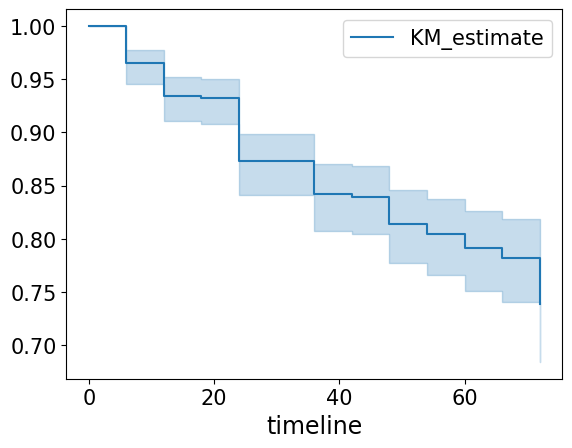

In [147]:
kmf.survival_function_
kmf.cumulative_density_
kmf.plot_survival_function()

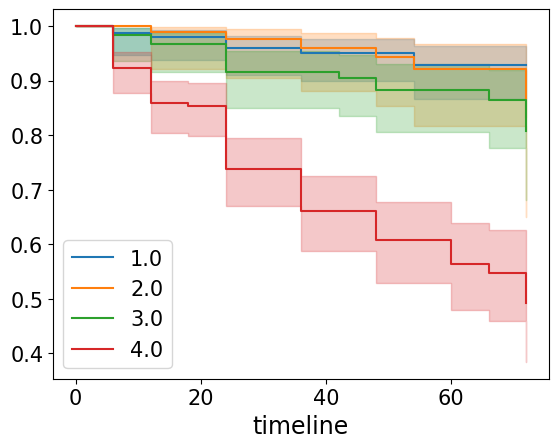

In [197]:
ax = plt.subplot(111)

kmf = KaplanMeierFitter()

for name, grouped_df in survival_input.groupby('cluster_top'):
    kmf.fit(grouped_df["time"], grouped_df["event"], label=name)
    kmf.plot_survival_function(ax=ax)

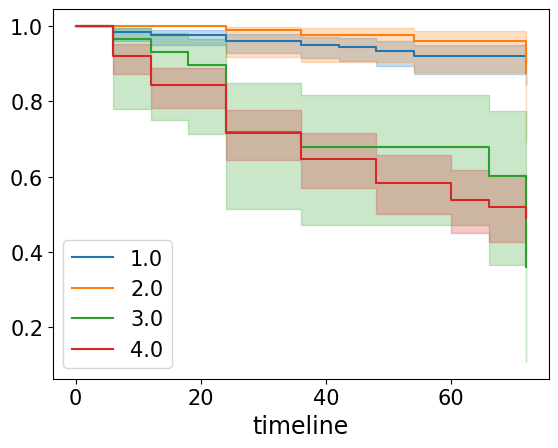

In [198]:
ax = plt.subplot(111)

kmf = KaplanMeierFitter()

for name, grouped_df in survival_input.groupby('cluster_95'):
    kmf.fit(grouped_df["time"], grouped_df["event"], label=name)
    kmf.plot_survival_function(ax=ax)

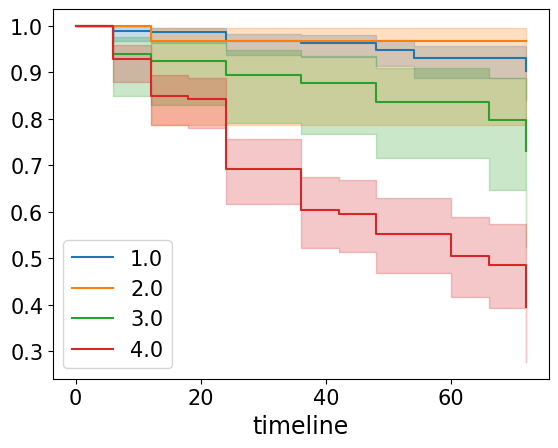

In [199]:
ax = plt.subplot(111)

kmf = KaplanMeierFitter()

for name, grouped_df in survival_input.groupby('centiloid_cluster'):
    kmf.fit(grouped_df["time"], grouped_df["event"], label=name)
    kmf.plot_survival_function(ax=ax)

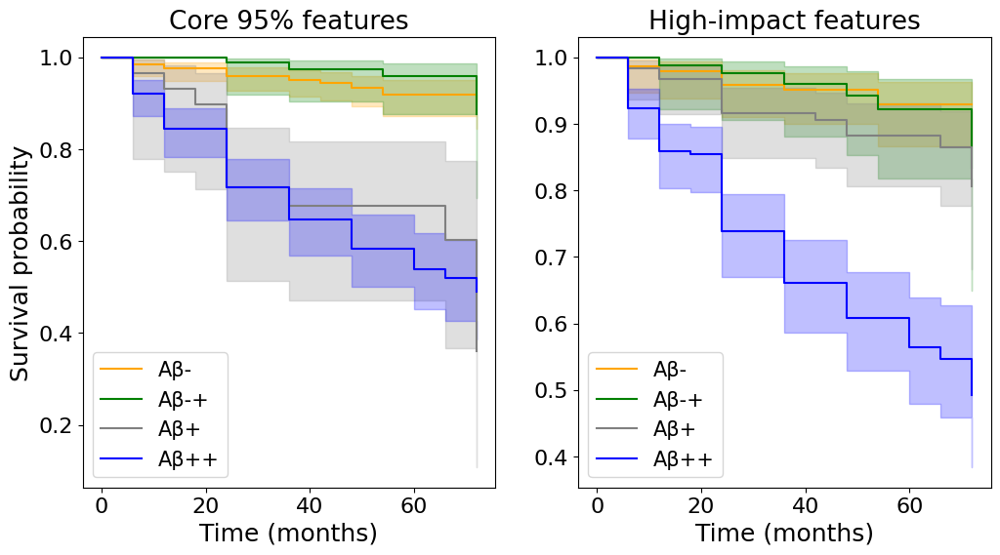

In [453]:
plt.rcParams.update({
    "font.size": 18,              # base font size
    "axes.titlesize": 19,         # title font
    "axes.labelsize": 18,         # x and y labels
    "xtick.labelsize": 16,        # x ticks
    "ytick.labelsize": 16,        # y ticks
    "legend.fontsize": 15        # legend
})

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
cluster_colors = {
    1: "orange",
    2: "green",
    3: "grey",
    4: "blue"
}
kmf = KaplanMeierFitter()

for name, grouped_df in survival_input.groupby('cluster_95'):
    color = cluster_colors.get(name, "black") 
    kmf.fit(grouped_df["time"], grouped_df["event"], label=name)
    kmf.plot_survival_function(ax=ax[0],color=color)

ax[0].set_title("Core 95% features")
ax[0].set_xlabel("Time (months)")
ax[0].set_ylabel("Survival probability")

ax[0].legend(title="")   
handles, _ = ax[0].get_legend_handles_labels()
ax[0].legend(handles, ['Aβ-','Aβ-+','Aβ+','Aβ++'])

kmf = KaplanMeierFitter()

for name, grouped_df in survival_input.groupby('cluster_top'):
    color = cluster_colors.get(name, "black")
    kmf.fit(grouped_df["time"], grouped_df["event"], label=name)
    kmf.plot_survival_function(ax=ax[1],color=color)
    
ax[1].set_title("High-impact features")
ax[1].set_xlabel("Time (months)")
ax[1].legend(title="") 
handles, _ = ax[1].get_legend_handles_labels()
ax[1].legend(handles, ['Aβ-','Aβ-+','Aβ+','Aβ++'])


plt.savefig(path + f'/survival_curves_clusters_{date}.png', bbox_inches='tight')
plt.savefig(path + f'/survival_curves_clusters_{date}.svg', format='svg', bbox_inches='tight')


plt.show()

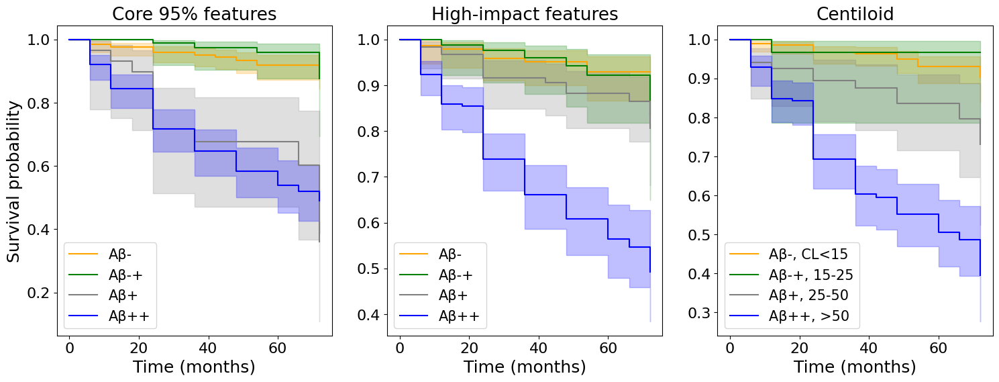

In [289]:
plt.rcParams.update({
    "font.size": 18,              # base font size
    "axes.titlesize": 19,         # title font
    "axes.labelsize": 18,         # x and y labels
    "xtick.labelsize": 16,        # x ticks
    "ytick.labelsize": 16,        # y ticks
    "legend.fontsize": 15        # legend
})

fig, ax = plt.subplots(1, 3, figsize=(18, 6))
cluster_colors = {
    1: "orange",
    2: "green",
    3: "grey",
    4: "blue"
}
kmf = KaplanMeierFitter()

for name, grouped_df in survival_input.groupby('cluster_95'):
    color = cluster_colors.get(name, "black") 
    kmf.fit(grouped_df["time"], grouped_df["event"], label=name)
    kmf.plot_survival_function(ax=ax[0],color=color)

ax[0].set_title("Core 95% features")
ax[0].set_xlabel("Time (months)")
ax[0].set_ylabel("Survival probability")

ax[0].legend(title="")   
handles, _ = ax[0].get_legend_handles_labels()
ax[0].legend(handles, ['Aβ-','Aβ-+','Aβ+','Aβ++'])

kmf = KaplanMeierFitter()

for name, grouped_df in survival_input.groupby('cluster_top'):
    color = cluster_colors.get(name, "black")
    kmf.fit(grouped_df["time"], grouped_df["event"], label=name)
    kmf.plot_survival_function(ax=ax[1],color=color)
    
ax[1].set_title("High-impact features")
ax[1].set_xlabel("Time (months)")
ax[1].legend(title="") 
handles, _ = ax[1].get_legend_handles_labels()
ax[1].legend(handles, ['Aβ-','Aβ-+','Aβ+','Aβ++'])

kmf = KaplanMeierFitter()

for name, grouped_df in survival_input.groupby('centiloid_cluster'):
    color = cluster_colors.get(name, "black")
    kmf.fit(grouped_df["time"], grouped_df["event"], label=name)
    kmf.plot_survival_function(ax=ax[2],color=color)
    
ax[2].set_title("Centiloid")
ax[2].set_xlabel("Time (months)")
ax[2].legend(title="") 
handles, _ = ax[2].get_legend_handles_labels()
ax[2].legend(handles, ['Aβ-, CL<15','Aβ-+, 15-25','Aβ+, 25-50','Aβ++, >50'])

plt.savefig(path + f'/survival_curves_clusters_cent_{date}.png', bbox_inches='tight')
plt.savefig(path + f'/survival_curves_clusters_cent_{date}.svg', format='svg', bbox_inches='tight')


plt.show()

In [451]:
axes[0].get_legend_handles_labels()

([], [])

In [178]:
from lifelines.statistics import multivariate_logrank_test
results = multivariate_logrank_test(survival_input['time'], survival_input['cluster_top'], survival_input['event'])
#results.print_summary()
print(results.summary)



   test_statistic             p   -log2(p)
0          87.231  8.613910e-19  60.009966


In [531]:
import itertools
import pandas as pd
from lifelines.statistics import logrank_test

# Suppose you have a DataFrame with 'group' and 'value' columns
groups = survival_input['cluster_top'].unique()

# Generate all pairwise combinations of groups
pairs = list(itertools.combinations(groups, 2))
print("Pairs to compare:", pairs)

# Loop over pairs
for g1, g2 in pairs:
    # Subset the data for the two groups
    df = survival_input[survival_input['cluster_top'] == g1]
    df2 = survival_input[survival_input['cluster_top'] == g2]
    
    results = logrank_test(df['time'], df2['time'], event_observed_A=df['event'], event_observed_B=df2['event'])

    # Example: print mean values
    
    print(f"Comparing group {g1} vs {g2}") #: mean times = {mean1:.2f} vs {mean2:.2f}
    print(results.summary)
    # Example: pairwise statistical test (e.g., log-rank test for survival)
    # from lifelines.statistics import logrank_test
    # result = logrank_test(df1['time'], df2['time'], event_observed_A=df1['event'], event_observed_B=df2['event'])
    # print(f"P-value: {result.p_value}")


Pairs to compare: [(3.0, 4.0), (3.0, 2.0), (3.0, 1.0), (4.0, 2.0), (4.0, 1.0), (2.0, 1.0)]
Comparing group 3.0 vs 4.0
   test_statistic             p   -log2(p)
0       32.870677  9.849782e-09  26.597261
Comparing group 3.0 vs 2.0
   test_statistic         p  -log2(p)
0         2.02181  0.155054  2.689155
Comparing group 3.0 vs 1.0
   test_statistic         p  -log2(p)
0        6.553588  0.010467  6.577968
Comparing group 4.0 vs 2.0
   test_statistic             p   -log2(p)
0       37.214466  1.058258e-09  29.815661
Comparing group 4.0 vs 1.0
   test_statistic             p   -log2(p)
0       79.870139  3.998440e-19  61.117196
Comparing group 2.0 vs 1.0
   test_statistic         p  -log2(p)
0        0.407821  0.523078  0.934903


In [532]:
import itertools
import pandas as pd
from lifelines.statistics import logrank_test

# Suppose you have a DataFrame with 'group' and 'value' columns
groups = survival_input['cluster_95'].unique()

# Generate all pairwise combinations of groups
pairs = list(itertools.combinations(groups, 2))
print("Pairs to compare:", pairs)

# Loop over pairs
for g1, g2 in pairs:
    # Subset the data for the two groups
    df = survival_input[survival_input['cluster_95'] == g1]
    df2 = survival_input[survival_input['cluster_95'] == g2]
    
    results = logrank_test(df['time'], df2['time'], event_observed_A=df['event'], event_observed_B=df2['event'])

    # Example: print mean values
    
    print(f"Comparing group {g1} vs {g2}") #: mean times = {mean1:.2f} vs {mean2:.2f}
    print(results.summary)
    # Example: pairwise statistical test (e.g., log-rank test for survival)
    # from lifelines.statistics import logrank_test
    # result = logrank_test(df1['time'], df2['time'], event_observed_A=df1['event'], event_observed_B=df2['event'])
    # print(f"P-value: {result.p_value}")


Pairs to compare: [(1.0, 4.0), (1.0, 2.0), (1.0, 3.0), (4.0, 2.0), (4.0, 3.0), (2.0, 3.0)]
Comparing group 1.0 vs 4.0
   test_statistic             p   -log2(p)
0      104.738439  1.393709e-24  79.247345
Comparing group 1.0 vs 2.0
   test_statistic         p  -log2(p)
0        1.999179  0.157384  2.667635
Comparing group 1.0 vs 3.0
   test_statistic             p   -log2(p)
0       36.397915  1.608752e-09  29.211411
Comparing group 4.0 vs 2.0
   test_statistic             p   -log2(p)
0       62.341465  2.887802e-15  48.298949
Comparing group 4.0 vs 3.0
   test_statistic         p  -log2(p)
0         0.21725  0.641143  0.641282
Comparing group 2.0 vs 3.0
   test_statistic             p   -log2(p)
0       34.127366  5.162018e-09  27.529418


In [200]:
survival_input_regression = survival_input[['time','event','age','cluster_top','cluster_95','centiloid_cluster','Sex']] #,'age','Sex','cluster_top'
#survival_input_regression = survival_input_regression[survival_input_regression.time <=72]
survival_input_regression.loc[survival_input_regression['Sex'] == 'Female', 'Sex'] = 0.0
survival_input_regression.loc[survival_input_regression['Sex'] == 'Male', 'Sex'] = 1.0


#survival_input_regression[survival_input_regression.Sex == 'Male'] = 0.0
#survival_input_regression[survival_input_regression.Sex == 'Female'] = 1.0

/csc/epitkane/home/atagmazi/.conda/envs/atagmazi_gpu8/lib/python3.7/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [201]:
survival_input_regression

,time,event,age,cluster_top,cluster_95,centiloid_cluster,Sex
0,72.0,0.0,63.00,2.0,2.0,1.0,0.0
1,66.0,0.0,79.70,1.0,1.0,1.0,1.0
2,72.0,0.0,80.30,2.0,1.0,2.0,1.0
3,72.0,0.0,72.00,1.0,1.0,1.0,1.0
4,72.0,0.0,69.60,1.0,2.0,1.0,0.0
...,...,...,...,...,...,...,...
569,3.0,0.0,71.35,1.0,1.0,1.0,0.0
570,3.0,0.0,73.05,4.0,1.0,1.0,1.0
571,3.0,0.0,65.25,1.0,1.0,1.0,1.0
572,24.0,0.0,80.90,1.0,1.0,3.0,0.0


In [202]:
cph_95 = CoxPHFitter()
cph_95.fit(survival_input_regression, duration_col='time', event_col='event',formula="C(cluster_95) + age+ C(Sex)") #, cluster_col='cluster_top'
print(cph_95.summary)

                          coef  exp(coef)  se(coef)  coef lower 95%  \
covariate                                                             
C(Sex)[T.1.0]         0.270497   1.310615  0.201975       -0.125368   
C(cluster_95)[T.2.0] -0.312852   0.731358  0.516731       -1.325626   
C(cluster_95)[T.3.0]  2.019196   7.532269  0.381145        1.272166   
C(cluster_95)[T.4.0]  2.119584   8.327670  0.265169        1.599862   
age                  -0.042997   0.957914  0.015074       -0.072541   

                      coef upper 95%  exp(coef) lower 95%  \
covariate                                                   
C(Sex)[T.1.0]               0.666361             0.882173   
C(cluster_95)[T.2.0]        0.699921             0.265637   
C(cluster_95)[T.3.0]        2.766227             3.568573   
C(cluster_95)[T.4.0]        2.639305             4.952351   
age                        -0.013453             0.930028   

                      exp(coef) upper 95%  cmp to         z             p 

In [180]:
1.172631e-07

1.172631e-07

In [173]:
np.exp(cph_95.params_)

covariate
C(Sex)[T.1.0]           1.310615
C(cluster_95)[T.2.0]    0.731358
C(cluster_95)[T.3.0]    7.532269
C(cluster_95)[T.4.0]    8.327670
age                     0.957914
Name: coef, dtype: float64

In [203]:
cph_top = CoxPHFitter()
cph_top.fit(survival_input_regression, duration_col='time', event_col='event',formula="C(cluster_top) + age+ C(Sex)") #, cluster_col='cluster_top'
print(cph_top.summary)

                           coef  exp(coef)  se(coef)  coef lower 95%  \
covariate                                                              
C(Sex)[T.1.0]          0.169002   1.184122  0.196053       -0.215255   
C(cluster_top)[T.2.0]  0.315364   1.370758  0.504319       -0.673083   
C(cluster_top)[T.3.0]  0.881817   2.415284  0.417321        0.063883   
C(cluster_top)[T.4.0]  2.243809   9.429179  0.355239        1.547554   
age                   -0.040623   0.960191  0.014857       -0.069742   

                       coef upper 95%  exp(coef) lower 95%  \
covariate                                                    
C(Sex)[T.1.0]                0.553259             0.806336   
C(cluster_top)[T.2.0]        1.303811             0.510133   
C(cluster_top)[T.3.0]        1.699751             1.065968   
C(cluster_top)[T.4.0]        2.940064             4.699960   
age                         -0.011505             0.932634   

                       exp(coef) upper 95%  cmp to         z

In [204]:
cph_cent = CoxPHFitter()
cph_cent.fit(survival_input_regression, duration_col='time', event_col='event',formula="C(centiloid_cluster) + age+ C(Sex)") #, cluster_col='cluster_top'
print(cph_cent.summary)

                                 coef  exp(coef)  se(coef)  coef lower 95%  \
covariate                                                                    
C(Sex)[T.1.0]                0.347544   1.415586  0.194881       -0.034417   
C(centiloid_cluster)[T.2.0] -0.580417   0.559665  1.028696       -2.596624   
C(centiloid_cluster)[T.3.0]  1.263278   3.536997  0.375276        0.527751   
C(centiloid_cluster)[T.4.0]  2.424337  11.294734  0.265870        1.903240   
age                         -0.045973   0.955068  0.014863       -0.075104   

                             coef upper 95%  exp(coef) lower 95%  \
covariate                                                          
C(Sex)[T.1.0]                      0.729504             0.966168   
C(centiloid_cluster)[T.2.0]        1.435789             0.074525   
C(centiloid_cluster)[T.3.0]        1.998805             1.695116   
C(centiloid_cluster)[T.4.0]        2.945433             6.707592   
age                               -0.016841  

In [229]:
from lifelines.utils import printer

printer.Summary.to_latex = lambda self: self.summary.to_string()


AttributeError: module 'lifelines.utils.printer' has no attribute 'Summary'

MODEL 1: Centiloid classification only


TypeError: format() got an unexpected keyword argument 'precision'

<lifelines.CoxPHFitter: fitted with 574 total observations, 465 right-censored observations>
             duration col = 'time'
                event col = 'event'
      baseline estimation = breslow
   number of observations = 574
number of events observed = 109
   partial log-likelihood = -599.87
         time fit was run = 2026-04-07 13:48:31 UTC

---
                    coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                 
centiloid_cluster   0.81       2.26       0.09             0.64             0.99                 1.89                 2.70

                    cmp to    z      p   -log2(p)
covariate                                        
centiloid_cluster     0.00 8.92 <0.005      60.94
---
Concordance = 0.76
Partial AIC = 1201.75
log-likelihood ratio test = 108.29 on 1 df
-log2(p) of ll-ratio test = 81.83

MODEL 2: VAE classification only


TypeError: format() got an unexpected keyword argument 'precision'

<lifelines.CoxPHFitter: fitted with 574 total observations, 465 right-censored observations>
             duration col = 'time'
                event col = 'event'
      baseline estimation = breslow
   number of observations = 574
number of events observed = 109
   partial log-likelihood = -616.05
         time fit was run = 2026-04-07 13:48:31 UTC

---
              coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                           
cluster_top   0.84       2.32       0.11             0.62             1.06                 1.85                 2.90

              cmp to    z      p   -log2(p)
covariate                                  
cluster_top     0.00 7.34 <0.005      42.05
---
Concordance = 0.73
Partial AIC = 1234.10
log-likelihood ratio test = 75.94 on 1 df
-log2(p) of ll-ratio test = 58.25

MODEL 3: Joint model (centiloids + VAE)


TypeError: format() got an unexpected keyword argument 'precision'

<lifelines.CoxPHFitter: fitted with 574 total observations, 465 right-censored observations>
             duration col = 'time'
                event col = 'event'
      baseline estimation = breslow
   number of observations = 574
number of events observed = 109
   partial log-likelihood = -598.93
         time fit was run = 2026-04-07 13:48:31 UTC

---
                    coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                 
centiloid_cluster   0.69       1.99       0.13             0.44             0.94                 1.55                 2.56
cluster_top         0.21       1.23       0.15            -0.09             0.50                 0.91                 1.66

                    cmp to    z      p   -log2(p)
covariate                                        
centiloid_cluster     0.00 5.39 <0.005      23.77
cluster_top           0.00 1.35   0.18       2.49
---
Concordance = 0.77
Partial AIC = 1201.87
log-likelihood ratio test = 110.17 on 2 df
-log2(p) of ll-ratio test = 79.47


C-INDEX COMPARISON
Centiloid only : 0.761
VAE only       : 0.731
Joint model    : 0.771


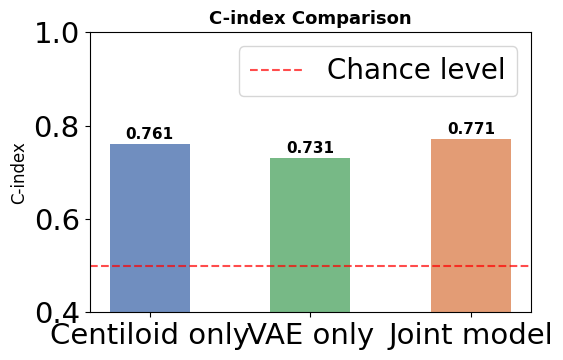

In [228]:
from lifelines import CoxPHFitter
from lifelines.statistics import proportional_hazard_test
import pandas as pd
import matplotlib.pyplot as plt

# Define your columns
duration_col  = 'time'   # replace with your time column
event_col     = 'event'           # replace with your event column (1=event, 0=censored)
vae_class_col = 'cluster_top'  # replace with your VAE classification column

# Drop rows with missing values in relevant columns
cols_needed = [duration_col, event_col, 'centiloid_cluster', vae_class_col]
df = survival_input_regression[cols_needed].dropna()

# --- Model 1: centiloids only (baseline) ---
cph_baseline = CoxPHFitter()
cph_baseline.fit(df[[duration_col, event_col, 'centiloid_cluster']], 
                 duration_col=duration_col, event_col=event_col)

# --- Model 2: VAE only ---
cph_vae = CoxPHFitter()
cph_vae.fit(df[[duration_col, event_col, vae_class_col]], 
            duration_col=duration_col, event_col=event_col)

# --- Model 3: centiloids + VAE (joint model) ---
cph_joint = CoxPHFitter()
cph_joint.fit(df[[duration_col, event_col, 'centiloid_cluster', vae_class_col]], 
              duration_col=duration_col, event_col=event_col)

# --- Print summaries ---
print("=" * 50)
print("MODEL 1: Centiloid classification only")
print("=" * 50)
cph_baseline.print_summary()

print("=" * 50)
print("MODEL 2: VAE classification only")
print("=" * 50)
cph_vae.print_summary()

print("=" * 50)
print("MODEL 3: Joint model (centiloids + VAE)")
print("=" * 50)
cph_joint.print_summary()

# --- Compare C-indices ---
c_baseline = cph_baseline.concordance_index_
c_vae      = cph_vae.concordance_index_
c_joint    = cph_joint.concordance_index_

print("\n" + "=" * 50)
print("C-INDEX COMPARISON")
print("=" * 50)
print(f"Centiloid only : {c_baseline:.3f}")
print(f"VAE only       : {c_vae:.3f}")
print(f"Joint model    : {c_joint:.3f}")

# --- Plot C-index comparison ---
fig, ax = plt.subplots(figsize=(6, 4))
models = ['Centiloid only', 'VAE only', 'Joint model']
c_values = [c_baseline, c_vae, c_joint]
colors = ['#4C72B0', '#55A868', '#DD8452']

bars = ax.bar(models, c_values, color=colors, alpha=0.8, width=0.5)
ax.axhline(y=0.5, color='red', linestyle='--', alpha=0.7, label='Chance level')
ax.set_ylim(0.4, 1.0)
ax.set_ylabel('C-index', fontsize=12)
ax.set_title('C-index Comparison', fontsize=13, fontweight='bold')
ax.legend()

for bar, val in zip(bars, c_values):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.01,
            f'{val:.3f}', ha='center', fontsize=11, fontweight='bold')

plt.tight_layout()
#plt.savefig('cindex_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

<AxesSubplot:xlabel='log(HR) (95% CI)'>

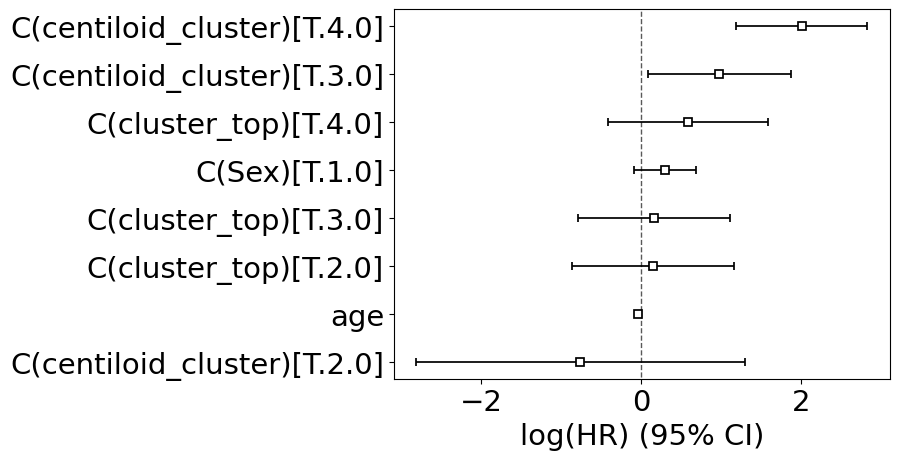

In [223]:
cph.plot()

In [574]:
ticks

array([0, 1, 2, 3, 4])

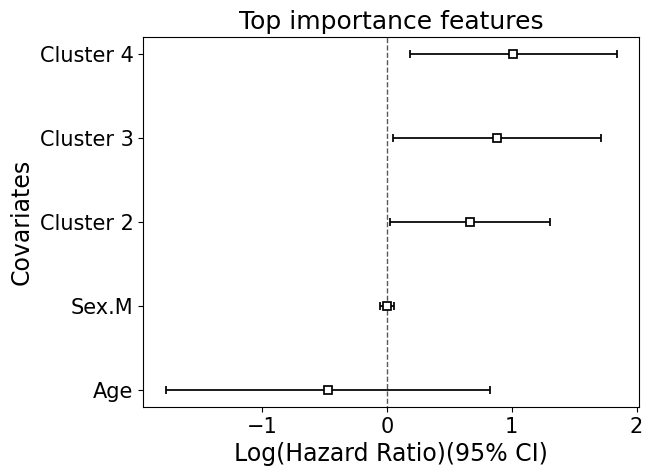

In [181]:
ax = cph_top.plot()  # plot and get the axes object
ax.set_xlabel("Log(Hazard Ratio)(95% CI)")  # change x-axis label
ax.set_ylabel("Covariates")         # change y-axis label

ticks = ax.get_yticks()
ax.set_yticks(ticks)
ax.set_yticklabels(['Age', 'Sex.M', 'Cluster 2', 'Cluster 3','Cluster 4'])

ax.set_title("Top importance features")  # add title if you want

plt.show()


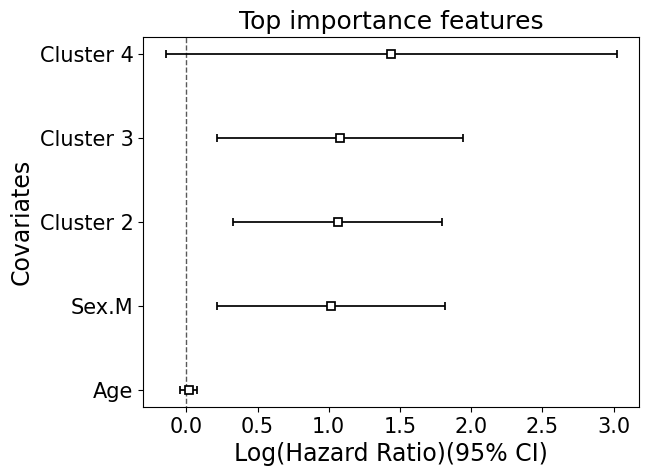

In [182]:
ax = cph_95.plot()  # plot and get the axes object
ax.set_xlabel("Log(Hazard Ratio)(95% CI)")  # change x-axis label
ax.set_ylabel("Covariates")         # change y-axis label

ticks = ax.get_yticks()
ax.set_yticks(ticks)
ax.set_yticklabels(['Age', 'Sex.M', 'Cluster 2', 'Cluster 3','Cluster 4'])

ax.set_title("Top importance features")  # add title if you want

plt.show()

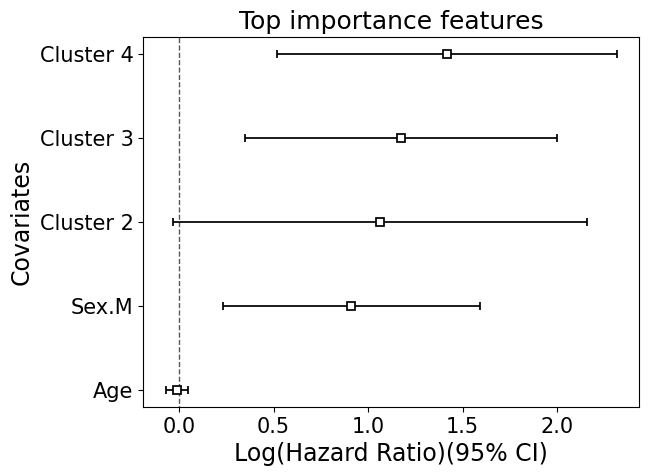

In [183]:
ax = cph_cent.plot()  # plot and get the axes object
ax.set_xlabel("Log(Hazard Ratio)(95% CI)")  # change x-axis label
ax.set_ylabel("Covariates")         # change y-axis label

ticks = ax.get_yticks()
ax.set_yticks(ticks)
ax.set_yticklabels(['Age', 'Sex.M', 'Cluster 2', 'Cluster 3','Cluster 4'])

ax.set_title("Top importance features")  # add title if you want

plt.show()

In [605]:
for i, (coef, p, upper) in enumerate(zip(summary["coef"], summary["p"], summary["coef upper 95%"])):
    # Adjust y position (depends on order of plotting)
    print(coef)

0.2909692206927207
-0.7253723916000674
1.9632453186943533
2.0717775603536337
-0.04739626418502836


In [638]:
for i in range(4, -1, -1):
    # Adjust y position (depends on order of plotting)
    print(i)

4
3
2
1
0


In [647]:
i

0

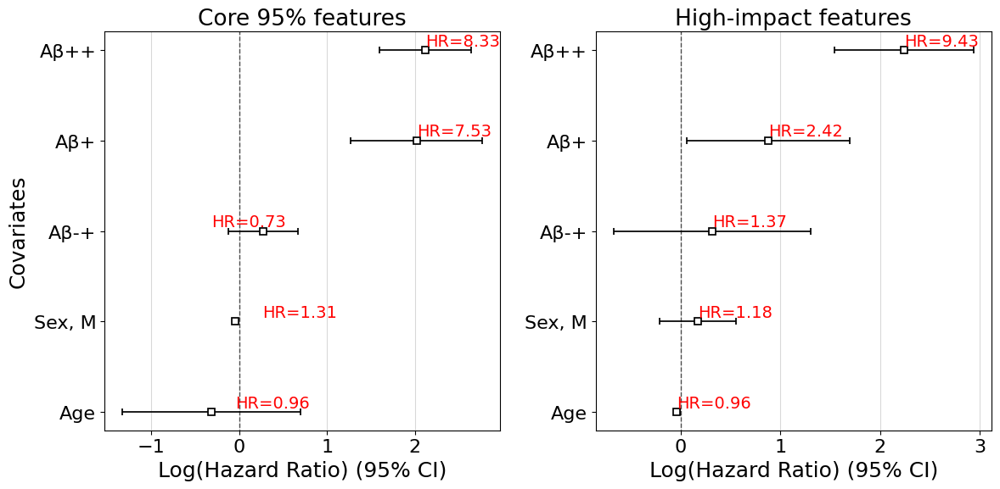

In [462]:
plt.rcParams.update({
    "font.size": 14,              # base font size
    "axes.titlesize": 19,         # title font
    "axes.labelsize": 18,         # x and y labels
    "xtick.labelsize": 16,        # x ticks
    "ytick.labelsize": 16,        # y ticks
    "legend.fontsize": 15        # legend
})

import numpy as np
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# --- First plot ---
ax1 = cph_95.plot(ax=axes[0])
ax1.set_xlabel("Log(Hazard Ratio) (95% CI)")
ax1.set_ylabel("Covariates")
ax1.set_title("Core 95% features")

# Define the label order (your preferred order)
yticklabels = ['Age', 'Sex.M', 'Cluster 2', 'Cluster 3', 'Cluster 4']
ax1.set_yticklabels(yticklabels)

# Get coefficient values (in your custom order)
summary = cph_95.summary
coefs = np.array([
    summary.loc['age', 'coef'],
    summary.loc['C(Sex)[T.1.0]', 'coef'],
    summary.loc['C(cluster_95)[T.2.0]', 'coef'],
    summary.loc['C(cluster_95)[T.3.0]', 'coef'],
    summary.loc['C(cluster_95)[T.4.0]', 'coef']
])

# Adjust for reversed y-axis order
yticks = ax1.get_yticks()
yticks = yticks[:len(coefs)]  # match number of variables

# Add text annotations next to confidence intervals
for i, coef in enumerate(coefs):
    y = yticks[i]
    text = f"HR={np.exp(coef):.2f}"
    ax1.text(coef , y+ 0.1, text, va='center', color='red')

# --- Second plot ---
ax2 = cph_top.plot(ax=axes[1])
ax2.set_xlabel("Log(Hazard Ratio) (95% CI)")
#ax2.set_ylabel("Covariates")
ax2.set_title("High-impact features")

# Define the label order (your preferred order)
yticklabels = ['Age', 'Sex.M', 'Cluster 2', 'Cluster 3', 'Cluster 4']
ax2.set_yticklabels(yticklabels)

# Get coefficient values (in your custom order)
summary = cph_top.summary
coefs = np.array([
    summary.loc['age', 'coef'],
    summary.loc['C(Sex)[T.1.0]', 'coef'],
    summary.loc['C(cluster_top)[T.2.0]', 'coef'],
    summary.loc['C(cluster_top)[T.3.0]', 'coef'],
    summary.loc['C(cluster_top)[T.4.0]', 'coef']
])

# Adjust for reversed y-axis order
yticks = ax2.get_yticks()
yticks = yticks[:len(coefs)]  # match number of variables

# Add text annotations next to confidence intervals
for i, coef in enumerate(coefs):
    y = yticks[i]
    text = f"HR={np.exp(coef):.2f}"
    ax2.text(coef , y+ 0.1, text, va='center', color='red')

for i in range(2):
    axes[i].set_yticklabels(['Age','Sex, M','Aβ-+','Aβ+','Aβ++'])
    axes[i].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)

    
plt.savefig(path + f'/survival_forestplot_{date}.png', bbox_inches='tight')
plt.savefig(path + f'/survival_forestplot_{date}.svg', format='svg', bbox_inches='tight')


plt.tight_layout()
plt.show()


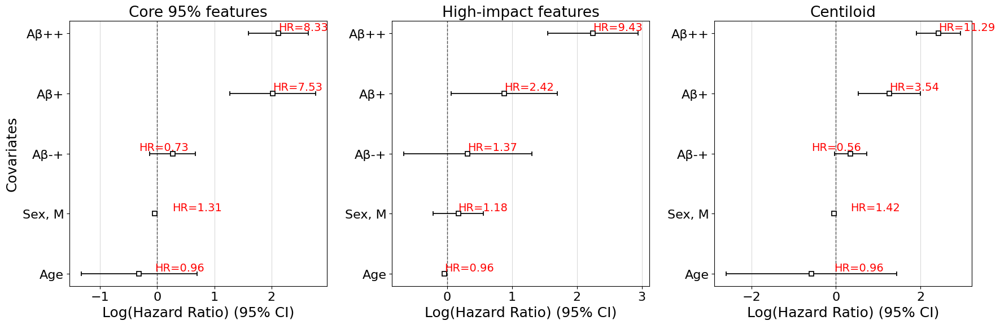

In [287]:
plt.rcParams.update({
    "font.size": 14,              # base font size
    "axes.titlesize": 19,         # title font
    "axes.labelsize": 18,         # x and y labels
    "xtick.labelsize": 16,        # x ticks
    "ytick.labelsize": 16,        # y ticks
    "legend.fontsize": 15        # legend
})

import numpy as np
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# --- First plot ---
ax1 = cph_95.plot(ax=axes[0])
ax1.set_xlabel("Log(Hazard Ratio) (95% CI)")
ax1.set_ylabel("Covariates")
ax1.set_title("Core 95% features")

# Define the label order (your preferred order)
yticklabels = ['Age', 'Sex.M', 'Cluster 2', 'Cluster 3', 'Cluster 4']
ax1.set_yticklabels(yticklabels)

# Get coefficient values (in your custom order)
summary = cph_95.summary
coefs = np.array([
    summary.loc['age', 'coef'],
    summary.loc['C(Sex)[T.1.0]', 'coef'],
    summary.loc['C(cluster_95)[T.2.0]', 'coef'],
    summary.loc['C(cluster_95)[T.3.0]', 'coef'],
    summary.loc['C(cluster_95)[T.4.0]', 'coef']
])

# Adjust for reversed y-axis order
yticks = ax1.get_yticks()
yticks = yticks[:len(coefs)]  # match number of variables

# Add text annotations next to confidence intervals
for i, coef in enumerate(coefs):
    y = yticks[i]
    text = f"HR={np.exp(coef):.2f}"
    ax1.text(coef , y+ 0.1, text, va='center', color='red')

# --- Second plot ---
ax2 = cph_top.plot(ax=axes[1])
ax2.set_xlabel("Log(Hazard Ratio) (95% CI)")
#ax2.set_ylabel("Covariates")
ax2.set_title("High-impact features")

# Define the label order (your preferred order)
yticklabels = ['Age', 'Sex.M', 'Cluster 2', 'Cluster 3', 'Cluster 4']
ax2.set_yticklabels(yticklabels)

# Get coefficient values (in your custom order)
summary = cph_top.summary
coefs = np.array([
    summary.loc['age', 'coef'],
    summary.loc['C(Sex)[T.1.0]', 'coef'],
    summary.loc['C(cluster_top)[T.2.0]', 'coef'],
    summary.loc['C(cluster_top)[T.3.0]', 'coef'],
    summary.loc['C(cluster_top)[T.4.0]', 'coef']
])
# Adjust for reversed y-axis order
yticks = ax2.get_yticks()
yticks = yticks[:len(coefs)]  # match number of variables

# Add text annotations next to confidence intervals
for i, coef in enumerate(coefs):
    y = yticks[i]
    text = f"HR={np.exp(coef):.2f}"
    ax2.text(coef , y+ 0.1, text, va='center', color='red')



# --- Third plot ---
ax2 = cph_cent.plot(ax=axes[2])
ax2.set_xlabel("Log(Hazard Ratio) (95% CI)")
#ax2.set_ylabel("Covariates")
ax2.set_title("Centiloid")

# Define the label order (your preferred order)
yticklabels = ['Age', 'Sex.M', 'Cluster 2', 'Cluster 3', 'Cluster 4']
ax2.set_yticklabels(yticklabels)

# Get coefficient values (in your custom order)
summary = cph_cent.summary
coefs = np.array([
    summary.loc['age', 'coef'],
    summary.loc['C(Sex)[T.1.0]', 'coef'],
    summary.loc['C(centiloid_cluster)[T.2.0]', 'coef'],
    summary.loc['C(centiloid_cluster)[T.3.0]', 'coef'],
    summary.loc['C(centiloid_cluster)[T.4.0]', 'coef']
])
# Adjust for reversed y-axis order
yticks = ax2.get_yticks()
yticks = yticks[:len(coefs)]  # match number of variables

# Add text annotations next to confidence intervals
for i, coef in enumerate(coefs):
    y = yticks[i]
    text = f"HR={np.exp(coef):.2f}"
    ax2.text(coef , y+ 0.1, text, va='center', color='red')

for i in range(3):
    axes[i].set_yticklabels(['Age','Sex, M','Aβ-+','Aβ+','Aβ++'])
    axes[i].grid(axis='x', color='grey', alpha=0.3, linewidth=0.8)

plt.savefig(path + f'/survival_forestplot_cent_{date}.png', bbox_inches='tight')
plt.savefig(path + f'/survival_forestplot_cent_{date}.svg', format='svg', bbox_inches='tight')
   


plt.tight_layout()
plt.show()


In [387]:
meta_survival[meta_survival['cl_group0']=='MCI']['cl_group4'].value_counts()

MCI    130
AD      18
CN       3
Name: cl_group4, dtype: int64

In [426]:
meta_survival.cl_group_0.value_counts()

MCI    349
CN     225
Name: cl_group_0, dtype: int64

In [427]:
meta_survival.cl_group_1.value_counts()

MCI    150
CN     145
AD      60
Name: cl_group_1, dtype: int64

In [409]:
meta_survival.cl_group2.value_counts()

MCI    243
CN     170
AD      55
Name: cl_group2, dtype: int64

In [412]:
meta_survival.cl_group10.value_counts()

MCI    63
CN     46
AD     11
Name: cl_group10, dtype: int64

In [ ]:

clusters_pattern = pd.DataFrame()
index = 0
for i in ids.index:
    temp = meta2_cleaned_noad_adni_sel_sorted[meta2_cleaned_noad_adni_sel_sorted.MRI_subID == i].copy()
    temp =  temp.sort_values(by='Age')
    clusters_pattern.loc[index,'id'] = i
    clusters_pattern.loc[index,'cluster_pattern'] = ''.join(temp['clusters'].astype(str))
    index +=1

# UMAP with different tracers

In [250]:
df_pib = pd.read_csv(path + '/latent_features_pib_'+ date+'.csv', index_col = 0)


In [251]:
ids = []
id_colname = []
for col in df_pib.columns:
    #ids.append(col.split('_')[0]) # 1modality 
    ids.append(col.split('/')[6].split('_')[0])
    id_colname.append(col.split('/')[6])
ids_unique = list(dict.fromkeys(ids)) 
df_pib.columns = id_colname

In [252]:
# concatenate features from slices to scan level
df_pib_combined = pd.DataFrame()
for i in ids_unique:
    #Find columns that start with the current ID
    columns = [col for col in df_pib.columns if col.startswith(i)]
    
    # Concatenate the matching columns vertically
    concat = pd.concat([df_pib[col] for col in columns], ignore_index=True)
    
    # Assign the concatenated result to a new column in the combined DataFrame
    df_pib_combined[i] = concat
 

In [253]:
df_pib_combined

,I143497,I136967,I136971,I166271,I166273,I133442,I147818,I186980,I155673,I73667,...,I187390,I180797,I180793,I138160,I161813,I161815,I161819,I161862,I159755,I159757
0,0.004177,0.004177,0.004177,0.004177,0.004177,0.004177,0.004177,0.004177,0.004177,0.004177,...,0.004177,0.004177,0.004177,0.004177,0.004177,0.004177,0.004177,0.004177,0.004177,0.004177
1,-0.000405,-0.000405,-0.000405,-0.000405,-0.000405,-0.000405,-0.000405,-0.000405,-0.000405,-0.000405,...,-0.000405,-0.000405,-0.000405,-0.000405,-0.000405,-0.000405,-0.000405,-0.000405,-0.000405,-0.000405
2,-0.008932,-0.008932,-0.008932,-0.008932,-0.008932,-0.008932,-0.008932,-0.008932,-0.008932,-0.008932,...,-0.008932,-0.008932,-0.008932,-0.008932,-0.008932,-0.008932,-0.008932,-0.008932,-0.008932,-0.008932
3,-0.004927,-0.004927,-0.004927,-0.004927,-0.004927,-0.004927,-0.004927,-0.004927,-0.004927,-0.004927,...,-0.004927,-0.004927,-0.004927,-0.004927,-0.004927,-0.004927,-0.004927,-0.004927,-0.004927,-0.004927
4,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,...,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11643,0.000730,0.000730,0.000730,0.000730,0.000730,0.000730,0.000730,0.000730,0.000730,0.000730,...,0.000730,0.000730,0.000730,0.000730,0.000730,0.000730,0.000730,0.000730,0.000730,0.000730
11644,0.000591,0.000591,0.000591,0.000591,0.000591,0.000591,0.000591,0.000591,0.000591,0.000591,...,0.000591,0.000591,0.000591,0.000591,0.000591,0.000591,0.000591,0.000591,0.000591,0.000591
11645,0.002429,0.002429,0.002429,0.002429,0.002429,0.002429,0.002429,0.002429,0.002429,0.002429,...,0.002429,0.002429,0.002429,0.002429,0.002429,0.002429,0.002429,0.002429,0.002429,0.002429
11646,-0.000498,-0.000498,-0.000498,-0.000498,-0.000498,-0.000498,-0.000498,-0.000498,-0.000498,-0.000498,...,-0.000498,-0.000498,-0.000498,-0.000498,-0.000498,-0.000498,-0.000498,-0.000498,-0.000498,-0.000498


In [256]:
X_reduced_noad.columns.values

array([2905, 3014, 3033, 3161, 3225, 3270, 3277, 7022, 7086, 7693])

In [257]:
pib_sel = df_pib_combined.T[X_reduced_noad.columns.values]

In [258]:
pib_sel

,2905,3014,3033,3161,3225,3270,3277,7022,7086,7693
I143497,1.180708,0.176320,1.386394,1.553803,1.599551,0.009135,0.628875,-2.754262,-2.902446,1.213910
I136967,1.531831,-0.032334,1.769482,1.944975,1.982787,-0.235177,0.727083,-1.661811,-1.408688,0.847823
I136971,0.707161,0.197344,0.828443,0.955072,0.982114,0.102717,0.264825,-2.188344,-2.117224,0.496124
I166271,1.247633,-0.004042,1.458986,1.653375,1.696506,-0.195792,0.661147,0.231193,0.430351,0.730939
I166273,0.656528,0.208755,0.795809,0.933565,0.966619,0.105117,0.267877,-1.722550,-1.658740,0.546116
...,...,...,...,...,...,...,...,...,...,...
I161815,0.581093,0.251034,0.686497,0.810523,0.836238,0.161134,0.251039,-2.074508,-2.012779,0.382053
I161819,0.495020,0.368397,0.751053,1.020620,1.096982,0.176847,0.666529,-0.548801,-0.432182,0.912156
I161862,0.405279,0.312638,0.499708,0.630525,0.669556,0.230387,0.255950,-2.363004,-2.345296,0.409841
I159755,1.564609,-0.023239,1.918369,2.214552,2.264578,-0.332591,0.793157,-4.194954,-4.378819,1.489380


In [259]:
df_fbb = pd.read_csv(path + '/latent_features_fbb_'+ date+'.csv', index_col = 0)


In [260]:
ids = []
id_colname = []
for col in df_fbb.columns:
    #ids.append(col.split('_')[0]) # 1modality 
    ids.append(col.split('/')[6].split('_')[0])
    id_colname.append(col.split('/')[6])
ids_unique = list(dict.fromkeys(ids)) 
df_fbb.columns = id_colname

In [261]:
# concatenate features from slices to scan level
df_fbb_combined = pd.DataFrame()
for i in ids_unique:
    #Find columns that start with the current ID
    columns = [col for col in df_fbb.columns if col.startswith(i)]
    
    # Concatenate the matching columns vertically
    concat = pd.concat([df_fbb[col] for col in columns], ignore_index=True)
    
    # Assign the concatenated result to a new column in the combined DataFrame
    df_fbb_combined[i] = concat
    


In [262]:
fbb_sel = df_fbb_combined.T[X_reduced_noad.columns.values]

In [263]:
fbb_sel.shape

(344, 10)

### combined UMAP

In [269]:
tracers_combined = pd.concat([X_reduced_noad, pib_sel, fbb_sel])

In [270]:
tracers_combined

,2905,3014,3033,3161,3225,3270,3277,7022,7086,7693
I1323673,0.607698,0.279434,0.803997,1.000060,1.056210,0.142450,0.447446,0.985387,1.079472,0.654254
I393755,0.510558,0.367180,0.775495,1.038580,1.147434,0.202229,0.466060,2.359696,2.425050,0.859235
I413047,0.936386,0.254062,1.196756,1.492417,1.612246,0.008646,0.562950,-0.327641,-0.543491,1.269609
I1411194,1.064757,0.261881,1.362124,1.621650,1.690316,0.036825,0.562786,0.636682,0.838313,0.861806
I1411241,0.788501,0.347665,1.022830,1.218097,1.270907,0.228825,0.405691,2.082536,2.328448,0.600983
...,...,...,...,...,...,...,...,...,...,...
I1352461,1.179945,0.137828,1.472109,1.694806,1.748459,-0.010450,0.545677,-2.143655,-2.283883,1.108897
I1051999,0.588487,0.407575,0.889832,1.168071,1.261868,0.213375,0.428508,-0.078511,-0.057871,0.774200
I1349921,0.621510,0.399843,0.961213,1.251495,1.357766,0.188879,0.474429,-0.453225,-0.585932,0.810647
I1239319,1.105401,0.207372,1.383966,1.616718,1.681530,-0.023451,0.481698,-1.536688,-1.310357,0.817442


In [271]:
label = np.concatenate([
    np.repeat('AV45', X_reduced_noad.shape[0]),
    np.repeat('PiB', pib_sel.shape[0]),
    np.repeat('FBB', fbb_sel.shape[0])
])

In [272]:
label

array(['AV45', 'AV45', 'AV45', ..., 'FBB', 'FBB', 'FBB'], dtype='<U4')

In [273]:
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42,metric = 'correlation')
X_umap_diff_tracers = reducer.fit_transform(tracers_combined)


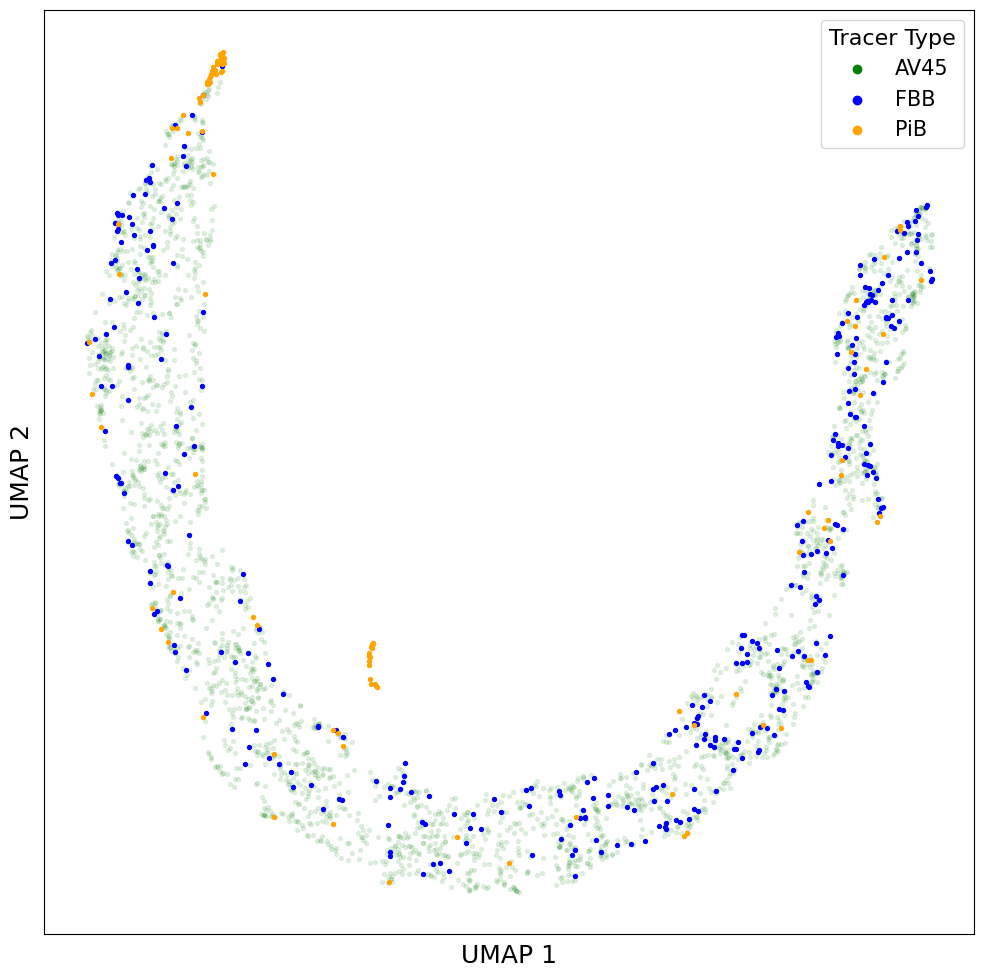

In [478]:
plt.rcParams.update({
    "font.size": 16,              
    "axes.titlesize": 16,         
    "axes.labelsize": 18,         
    "xtick.labelsize": 16,        
    "ytick.labelsize": 16,        
    "legend.fontsize": 15         
})

unique_labels = np.unique(label)
colors = ['green', 'blue', 'orange']

label_to_color = dict(zip(unique_labels, colors))

# --- Create figure AND axes ---
fig, ax = plt.subplots(figsize=(12,12))

# Scatter per tracer type
for l in unique_labels:
    idx = label == l
    ax.scatter(
        X_umap_diff_tracers[idx, 0],
        X_umap_diff_tracers[idx, 1],
        s=8,
        color=label_to_color[l],
        alpha=1.0 if l != 'AV45' else 0.1
    )

# Legend
for l in unique_labels:
    ax.scatter([], [], color=label_to_color[l], label=l)
ax.legend(title="Tracer Type")

# Remove ticks and tick labels
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_xticks([])
ax.set_yticks([])

ax.set_xlabel("UMAP 1")
ax.set_ylabel("UMAP 2")

plt.savefig(path + f'/diff_tracers_umap_{date}.png', bbox_inches='tight')
plt.savefig(path + f'/diff_tracers_umap_{date}.svg', format='svg', bbox_inches='tight')

plt.show()


In [275]:
X_umap_diff_tracers.shape

(3265, 2)

In [278]:
label.shape

(3265,)

In [265]:
import numpy as np
from sklearn.neighbors import NearestNeighbors

In [266]:
def compute_nnf(X_umap, batch_labels, k=15):
    X_umap = np.asarray(X_umap)
    batch_labels = np.asarray(batch_labels)

    nn = NearestNeighbors(n_neighbors=k+1).fit(X_umap)
    _, indices = nn.kneighbors(X_umap)

    # exclude self (first neighbor)
    indices = indices[:, 1:]

    nnf_scores = []

    for i in range(len(X_umap)):
        neighbors = batch_labels[indices[i]]
        same_batch = np.sum(neighbors == batch_labels[i])
        nnf_scores.append(same_batch / k)

    return np.mean(nnf_scores), np.array(nnf_scores)

In [267]:
def compute_lisi(X_umap, batch_labels, k=30):
    X_umap = np.asarray(X_umap)
    batch_labels = np.asarray(batch_labels)

    nn = NearestNeighbors(n_neighbors=k+1).fit(X_umap)
    _, indices = nn.kneighbors(X_umap)

    indices = indices[:, 1:]  # remove self

    lisi_scores = []

    for i in range(len(X_umap)):
        neighbors = batch_labels[indices[i]]

        # compute proportions of each batch
        _, counts = np.unique(neighbors, return_counts=True)
        p = counts / counts.sum()

        # inverse Simpson index
        lisi = 1.0 / np.sum(p ** 2)
        lisi_scores.append(lisi)

    return np.mean(lisi_scores), np.array(lisi_scores)

In [285]:
tracers_combined_av45_pib = pd.concat([X_reduced_noad, pib_sel])
label_av45_pib = np.concatenate([
    np.repeat('AV45', X_reduced_noad.shape[0]),
    np.repeat('PiB', pib_sel.shape[0])
])

In [286]:
tracers_combined_av45_fbb = pd.concat([X_reduced_noad, fbb_sel])
label_av45_fbb = np.concatenate([
    np.repeat('AV45', X_reduced_noad.shape[0]),
    np.repeat('FBB', fbb_sel.shape[0])
])

In [287]:
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42,metric = 'correlation')
X_umap_av45_pib = reducer.fit_transform(tracers_combined_av45_pib)


In [288]:
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42,metric = 'correlation')
X_umap_av45_fbb = reducer.fit_transform(tracers_combined_av45_fbb)


In [293]:
nnf_mean, nnf_vals = compute_nnf(X_umap_av45_pib, label_av45_pib, k=30)
lisi_mean, lisi_vals = compute_lisi(X_umap_av45_pib, label_av45_pib, k=30)

print("NNF:", nnf_mean)
print("LISI:", lisi_mean)

NNF: 0.9532466050439348
LISI: 1.055899490732864


In [294]:
nnf_mean, nnf_vals = compute_nnf(X_umap_av45_fbb, label_av45_fbb, k=30)
lisi_mean, lisi_vals = compute_lisi(X_umap_av45_fbb, label_av45_fbb, k=30)

print("NNF:", nnf_mean)
print("LISI:", lisi_mean)

NNF: 0.8136257681712228
LISI: 1.2412194130257717


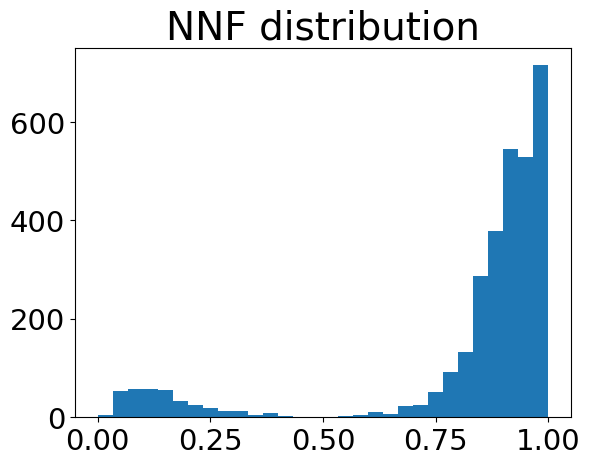

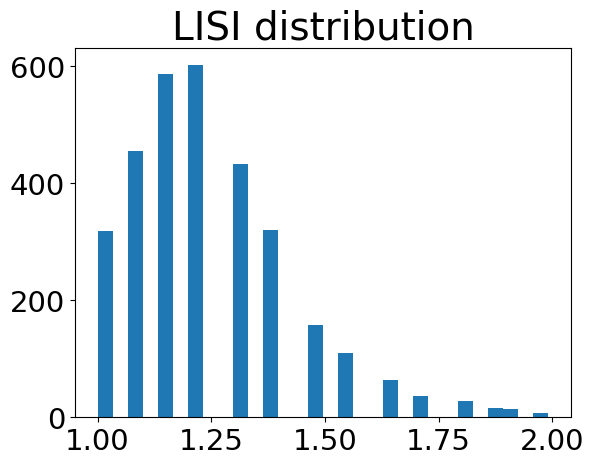

In [295]:
import matplotlib.pyplot as plt

plt.figure()
plt.hist(nnf_vals, bins=30)
plt.title("NNF distribution")
plt.show()

plt.figure()
plt.hist(lisi_vals, bins=30)
plt.title("LISI distribution")
plt.show()